<a href="https://colab.research.google.com/github/vicente-gonzalez-ruiz/learned_image_compression/blob/main/LIC2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Simple AutoEncoder (no convolutional layers)
# https://blog.keras.io/building-autoencoders-in-keras.html
# https://www.youtube.com/watch?v=wECwVBmPH7w

# Learned Image Compression (LIC) using [(Compressive) Autoencoders](https://www.lherranz.org/2022/08/24/neural-image-compression-in-a-nutshell-part-1-main-idea/)

An autoencoder consists of two main components: the encoder and the decoder.
The encoder is a function
\begin{equation}
e(\mathbf{X})=\mathbf{Z},
\end{equation}
that maps the input data $\mathbf{X}$ to the encoded representation in the latent space $\mathbf{Z}$. The decoder is the inverse function
\begin{equation}
d(\mathbf{Z})=(\mathbf{X}),
\end{equation}
that maps the encoded representation back to the original input space. When an autoencoder is implemented using [ANNs](https://en.wikipedia.org/wiki/Artificial_neural_network) (with parameters $\psi=(\theta,\phi)$, where $\theta$ are the parameters of the encoder, and $\phi$ are the parameters of the decoder), and the dimension (the number of elements) of the latent space (the output of the smaller hidden layer) is smaller than the dimension of the input (and output) space, it is impossible (in most of the cases) to decode the original $\mathbf{X}$, but only one an approximation $\hat{\mathbf{X}}(\psi)$. For this reason, the cost function $J$ optimized (minimized) in an autoencoder is usually the MSE, defined in this case as
\begin{equation}
D(\mathbf{X}, \hat{\mathbf{X}})=\frac{1}{N}\sum_{i}^{N}(\mathbf{X}_i-\hat{\mathbf{X}}_i)^2,
\end{equation}
where $N$ is the dimension of $\mathbf{X}$ (and $\hat{\mathbf{X}}$), and $\mathbf{X}_i$ is the $i$-th element of $\mathbf{X}$.

Therefore, we can formally define an autoencoder as finding the optimal autoencoder parameters
\begin{equation}
\psi^*=\min_\psi D(\mathbf{X}, \hat{\mathbf{X}}(\psi)).
\end{equation}

In a compressive autoencoder, we also take into consideration the number of bits $R(\mathbf{Z})$ required to represent $\mathbf{Z}$, that we want also to minimize. Therefore, in this case the cost function is defined as the Lagrangian
\begin{equation}
J(\mathbf{X}, \hat{\mathbf{X}}(\psi); \lambda)=D(\mathbf{X}, \hat{\mathbf{X}}(\psi)) + \lambda R(\mathbf{Z}),
\end{equation}
where $\lambda$ is a hyper-parameter, and we optimize
\begin{equation}
\psi^*=\min_\psi J(\mathbf{X}, \hat{\mathbf{X}}(\psi); \lambda).
\end{equation}

$\lambda$ determines the trading-off between rate $R$ and distortion $D$. If $\lambda$ is big we are priorizing (minimizing) $R$ and therefore, we will get a point in the RD-curve with a small bit-rate (high MSE). On the contrary, if $\lambda$ is small we are minimizing $D$ and therefore, we will be in a point of the RD-curve with a high bit-rate (small MSE).

$\mathbf{Z}$ is usually compressed with an entropy encoder (notice that this encoder is different to the "feature encoder" or "latent encoder" $e$). When the code-words assigned to the symbols $\mathbf{Z}_i$ depends on the probability distribution of $\mathbf{Z}$, such probabilities $p_\psi(\mathbf{Z})$ can be also optimized, where now $\psi=(\theta,\phi, \nu)$.

Finally, notice that we are not constrained to use the MSE as the distortion metric. Other metrics such as the SSIM (more representative of how humans perceive the differences between two images) could be also used.

## About $\mathbf{X}$ and computing resources
For reasons of space and speed, we use the [MNIST dataset](https://en.wikipedia.org/wiki/MNIST_database), that is composed of 70K images of hand written decimal digits. Notice that with this dataset, all the images have the same shape (28x28 pixels), and are monochromatic (8 bits/pixel). We will use [Keras](https://blog.keras.io/building-autoencoders-in-keras.html) (see https://www.tensorflow.org/guide/basics).

## 1. Using 1 hidden layer and no quantization of the latent space
The most basic autoencoder has only one Full-Connected hidden-Layer (FCL) of neurons. Compression is achieved when the output of the hidden neurons (the latent space) requires less bits to be represented than the original image. In this example, the hiddent layer has 32 neurons:

    Input -> FCL -> Output
    28x28    32     28x28

Notice that we have found a lossy compact representation of 28x28 scalars (integers) using only 32 (floats) scalars.

2.14.0
11490434/11490434 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 784)]             0         
                                                                 
 dense (Dense)               (None, 32)                25120     
                                                                 
 dense_1 (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
157/157 [==============================] - 1s 5ms/step


<Figure size 640x480 with 0 Axes>

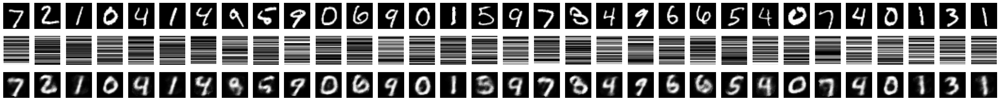

157/157 [==============================] - 1s 8ms/step


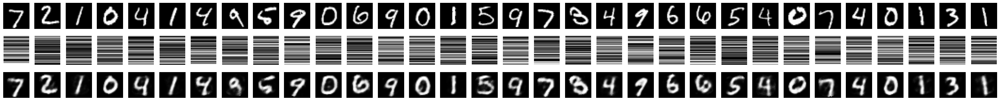

157/157 [==============================] - 1s 5ms/step


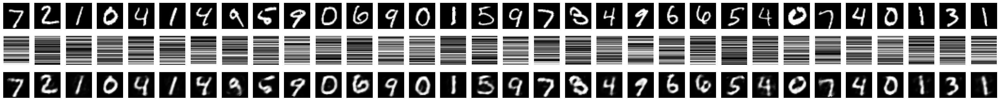

157/157 [==============================] - 2s 11ms/step


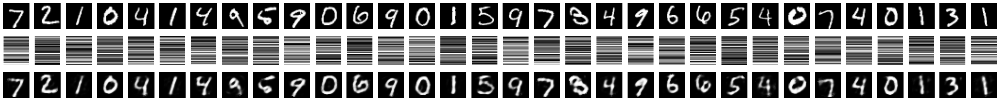

157/157 [==============================] - 1s 9ms/step


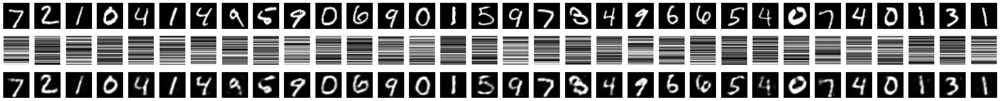

In [1]:
# A simple autoencoder with only one hidden layer.

import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.utils import Sequence
from skimage.io import imread
from sklearn.model_selection import train_test_split
from skimage.transform import resize

print(tf.__version__)

# This variable controls the number of hidden neurons. Notice that the output of a neuron is a floating point number.
LATENT_SPACE_LENGTH = 32

img_width, img_height = 28, 28
img_length = img_height * img_width

DATASET = 'mnist'  # See https://www.tensorflow.org/datasets/catalog/
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
# DATASET = 'fashion_mnist'
# DATA_URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
#with np.load(path) as data:
#    x_train = data['x_train']
#    y_train = data['x_train']
#    x_test = data['x_test']
#    y_test = data['x_test']
with np.load(path) as data:
#    x_train = data['x_train']
#    x_test = data['x_test']
#    y_train = x_train
#    y_test = x_test
    x_train = data['x_train']
    y_train = data['x_train']
    x_test = data['x_test']
    y_test = data['y_test']

# Pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_DS = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Define how to use the datasets, preprocess, etc.

def process_x(image, label):
    # The input images are reshaped (to have only one dimension) and normalized to [0, 1].
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    processed_img = tf.cast(processed_img, tf.float32) / 255.
    # The input dataset has been labeled, but labels are ignored in the rest of the pipeline.
    return processed_img, label

def process_y(image, label):
    # The output images are already in 1D. Notice that in autoencoder, the objective is to generate the same output than the input.
    return image, image

# During each training iteration, the model will process batches of 64 examples, and the training data will be shuffled with a buffer size of 100.
BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(process_x)
train_DS = train_DS.map(process_y)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(process_x)
test_DS = test_DS.map(process_y)
test_DS = test_DS.batch(BATCH_SIZE)

# A autoencoder definition (you can modify, for example, the activation fuctions).
input_layer = keras.Input(shape=(img_length,))
hidden_layer = layers.Dense(LATENT_SPACE_LENGTH, activation="relu")(input_layer)
output_layer = layers.Dense(img_length, activation="sigmoid")(hidden_layer)
autoencoder = keras.Model(input_layer, output_layer)

# To see the "latents" (content of the hidden layer) while we train the network, we define a new "model" with only the encoder.
encoder = keras.Model(input_layer, hidden_layer)

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="mse")
autoencoder.summary()

# Let's train.

# Number of times that the complete dataset is used to train the autoencoder. In this case, because we want to show the progressive reconstruction of some images, we train the encoder using only one epoch.
EPOCHS = 1

# Number of times that the autoencoder is trained. Notice that if we don't want to see how the model is learning between epochs, it is not necessary to iterate the fit() method, because we can increase the number of epochs.
ITERATIONS = 5
plt.gray()
for i in range(ITERATIONS):
    autoencoder.fit(train_DS, epochs=EPOCHS, validation_data=test_DS)

    # Show the learning.
    plt.figure(figsize=(40, 4))

    n = len(train_DS)
    if n > 32:
        n = 32

    # Show the originals (using the pipeline).
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(3, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.axis("off")
            except:
                pass

    # See the latent space (as images).
    latent_imgs = encoder.predict(test_DS)
    #print("type latent", type(latent_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(resize(latent_imgs[i], (LATENT_SPACE_LENGTH, img_width)))
        plt.axis("off")

    # See the reconstructions.
    reconstructed_imgs = autoencoder.predict(test_DS)
    #print(type(reconstructed_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + 2 * n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.axis("off")

    plt.show()


##  2. Quantizing the latent space
The reduction of dimensionality provided by the previous example could not be enough in some compression contexts. We are transforming a image that requires $28\times 28=784$ pixels of 1 byte, total 784 bytes to $32\times 4=128$ bytes (considering 4 bytes/float). With this input and output lengths we are achieving a compression ratio
\begin{equation}
\text{CR}=\frac{784}{128}=6.125\text{.}
\end{equation}

One way of increasing the $\text{CR}$ is to quantize the latent space. At this point we can use Scalar Quantization (SQ) or Vector Quantization (VQ). From a $\text{CR}$ perspective, (without considering that we need to send the code-book) VQ is at least as efficient as SQ, but it is also more computationally demanding. Moreover, because the dimensionality of the latent space is quite smaller than the original one (32 compared to 784), we "coefficients" of the latent space are basically uncorrelated. Therefore, it is expected that SQ will perform almost as good as VQ in this context. Therefore, after quantizing the coefficients, we will achieve
\begin{equation}
\text{CR}=\frac{784}{32}=24.5\text{.}
\end{equation}

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 784)]             0         
                                                                 
 dense_2 (Dense)             (None, 32)                25120     
                                                                 
 quantization (Quantization  (None, 32)                0         
 _8bits)                                                         
                                                                 
 outputs (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


  1/938 [..............................] - ETA: 2:34 - loss: 0.2311

  2/938 [..............................] - ETA: 53s - loss: 0.2300 

  3/938 [..............................] - ETA: 50s - loss: 0.2300

  5/938 [..............................] - ETA: 48s - loss: 0.2291

  7/938 [..............................] - ETA: 46s - loss: 0.2282

  8/938 [..............................] - ETA: 46s - loss: 0.2276

  9/938 [..............................] - ETA: 46s - loss: 0.2271

 11/938 [..............................] - ETA: 45s - loss: 0.2262

 12/938 [..............................] - ETA: 46s - loss: 0.2257

 14/938 [..............................] - ETA: 46s - loss: 0.2247

 16/938 [..............................] - ETA: 45s - loss: 0.2237

 17/938 [..............................] - ETA: 45s - loss: 0.2233

 18/938 [..............................] - ETA: 45s - loss: 0.2228

 19/938 [..............................] - ETA: 46s - loss: 0.2224

 20/938 [..............................] - ETA: 46s - loss: 0.2220

 22/938 [..............................] - ETA: 45s - loss: 0.2211

 24/938 [..............................] - ETA: 45s - loss: 0.2202

 25/938 [..............................] - ETA: 45s - loss: 0.2198

 27/938 [..............................] - ETA: 44s - loss: 0.2189

 29/938 [..............................] - ETA: 44s - loss: 0.2181

 31/938 [..............................] - ETA: 44s - loss: 0.2172

 32/938 [>.............................] - ETA: 44s - loss: 0.2168

 33/938 [>.............................] - ETA: 44s - loss: 0.2164

 34/938 [>.............................] - ETA: 44s - loss: 0.2160

 36/938 [>.............................] - ETA: 44s - loss: 0.2151

 37/938 [>.............................] - ETA: 44s - loss: 0.2147

 38/938 [>.............................] - ETA: 44s - loss: 0.2142

 40/938 [>.............................] - ETA: 44s - loss: 0.2133

 42/938 [>.............................] - ETA: 43s - loss: 0.2125

 44/938 [>.............................] - ETA: 43s - loss: 0.2117

 45/938 [>.............................] - ETA: 44s - loss: 0.2113

 47/938 [>.............................] - ETA: 43s - loss: 0.2104

 49/938 [>.............................] - ETA: 43s - loss: 0.2095

 50/938 [>.............................] - ETA: 43s - loss: 0.2091

 51/938 [>.............................] - ETA: 43s - loss: 0.2088

 52/938 [>.............................] - ETA: 43s - loss: 0.2084

 53/938 [>.............................] - ETA: 43s - loss: 0.2080

 54/938 [>.............................] - ETA: 43s - loss: 0.2076

 55/938 [>.............................] - ETA: 43s - loss: 0.2072

 56/938 [>.............................] - ETA: 44s - loss: 0.2068

 57/938 [>.............................] - ETA: 44s - loss: 0.2064

 58/938 [>.............................] - ETA: 44s - loss: 0.2060

 59/938 [>.............................] - ETA: 44s - loss: 0.2056

 60/938 [>.............................] - ETA: 44s - loss: 0.2052

 61/938 [>.............................] - ETA: 44s - loss: 0.2048

 62/938 [>.............................] - ETA: 44s - loss: 0.2044

 63/938 [=>............................] - ETA: 44s - loss: 0.2040

 64/938 [=>............................] - ETA: 44s - loss: 0.2036

 65/938 [=>............................] - ETA: 44s - loss: 0.2032

 67/938 [=>............................] - ETA: 44s - loss: 0.2024

 68/938 [=>............................] - ETA: 44s - loss: 0.2020

 69/938 [=>............................] - ETA: 44s - loss: 0.2017

 70/938 [=>............................] - ETA: 44s - loss: 0.2013

 71/938 [=>............................] - ETA: 44s - loss: 0.2009

 72/938 [=>............................] - ETA: 44s - loss: 0.2006

 73/938 [=>............................] - ETA: 44s - loss: 0.2002

 75/938 [=>............................] - ETA: 44s - loss: 0.1996

 77/938 [=>............................] - ETA: 44s - loss: 0.1989

 79/938 [=>............................] - ETA: 43s - loss: 0.1982

 81/938 [=>............................] - ETA: 43s - loss: 0.1974

 83/938 [=>............................] - ETA: 43s - loss: 0.1967

 84/938 [=>............................] - ETA: 43s - loss: 0.1963

 86/938 [=>............................] - ETA: 43s - loss: 0.1956

 88/938 [=>............................] - ETA: 42s - loss: 0.1948

 90/938 [=>............................] - ETA: 42s - loss: 0.1941

 92/938 [=>............................] - ETA: 42s - loss: 0.1934

 94/938 [==>...........................] - ETA: 42s - loss: 0.1927

 96/938 [==>...........................] - ETA: 41s - loss: 0.1920

 98/938 [==>...........................] - ETA: 41s - loss: 0.1913

 99/938 [==>...........................] - ETA: 41s - loss: 0.1909

100/938 [==>...........................] - ETA: 41s - loss: 0.1906

101/938 [==>...........................] - ETA: 41s - loss: 0.1902

102/938 [==>...........................] - ETA: 41s - loss: 0.1899

104/938 [==>...........................] - ETA: 41s - loss: 0.1892

106/938 [==>...........................] - ETA: 41s - loss: 0.1885

108/938 [==>...........................] - ETA: 41s - loss: 0.1879

110/938 [==>...........................] - ETA: 41s - loss: 0.1872

111/938 [==>...........................] - ETA: 41s - loss: 0.1869

112/938 [==>...........................] - ETA: 41s - loss: 0.1866

114/938 [==>...........................] - ETA: 40s - loss: 0.1859

116/938 [==>...........................] - ETA: 40s - loss: 0.1853

118/938 [==>...........................] - ETA: 40s - loss: 0.1847

120/938 [==>...........................] - ETA: 40s - loss: 0.1840

122/938 [==>...........................] - ETA: 39s - loss: 0.1834

124/938 [==>...........................] - ETA: 39s - loss: 0.1828

126/938 [===>..........................] - ETA: 39s - loss: 0.1822

128/938 [===>..........................] - ETA: 39s - loss: 0.1816

130/938 [===>..........................] - ETA: 38s - loss: 0.1809

132/938 [===>..........................] - ETA: 38s - loss: 0.1803

134/938 [===>..........................] - ETA: 38s - loss: 0.1798

136/938 [===>..........................] - ETA: 37s - loss: 0.1792

138/938 [===>..........................] - ETA: 37s - loss: 0.1786

140/938 [===>..........................] - ETA: 37s - loss: 0.1780

142/938 [===>..........................] - ETA: 37s - loss: 0.1775

144/938 [===>..........................] - ETA: 37s - loss: 0.1769

146/938 [===>..........................] - ETA: 36s - loss: 0.1763

148/938 [===>..........................] - ETA: 36s - loss: 0.1758

150/938 [===>..........................] - ETA: 36s - loss: 0.1753

152/938 [===>..........................] - ETA: 36s - loss: 0.1748

154/938 [===>..........................] - ETA: 36s - loss: 0.1742

156/938 [===>..........................] - ETA: 35s - loss: 0.1737

158/938 [====>.........................] - ETA: 35s - loss: 0.1731

160/938 [====>.........................] - ETA: 35s - loss: 0.1726

162/938 [====>.........................] - ETA: 35s - loss: 0.1721

164/938 [====>.........................] - ETA: 35s - loss: 0.1715

166/938 [====>.........................] - ETA: 34s - loss: 0.1710

168/938 [====>.........................] - ETA: 34s - loss: 0.1704

170/938 [====>.........................] - ETA: 34s - loss: 0.1699

172/938 [====>.........................] - ETA: 34s - loss: 0.1694

174/938 [====>.........................] - ETA: 34s - loss: 0.1689

176/938 [====>.........................] - ETA: 34s - loss: 0.1684

178/938 [====>.........................] - ETA: 33s - loss: 0.1679

180/938 [====>.........................] - ETA: 33s - loss: 0.1674

182/938 [====>.........................] - ETA: 33s - loss: 0.1669

184/938 [====>.........................] - ETA: 33s - loss: 0.1663

186/938 [====>.........................] - ETA: 33s - loss: 0.1658

188/938 [=====>........................] - ETA: 33s - loss: 0.1653

190/938 [=====>........................] - ETA: 32s - loss: 0.1648

192/938 [=====>........................] - ETA: 32s - loss: 0.1643

194/938 [=====>........................] - ETA: 32s - loss: 0.1639

196/938 [=====>........................] - ETA: 32s - loss: 0.1634

198/938 [=====>........................] - ETA: 32s - loss: 0.1630

200/938 [=====>........................] - ETA: 32s - loss: 0.1625

202/938 [=====>........................] - ETA: 31s - loss: 0.1621

204/938 [=====>........................] - ETA: 31s - loss: 0.1616

206/938 [=====>........................] - ETA: 31s - loss: 0.1612

207/938 [=====>........................] - ETA: 31s - loss: 0.1609

208/938 [=====>........................] - ETA: 31s - loss: 0.1607

209/938 [=====>........................] - ETA: 31s - loss: 0.1605

210/938 [=====>........................] - ETA: 31s - loss: 0.1603

212/938 [=====>........................] - ETA: 31s - loss: 0.1599

214/938 [=====>........................] - ETA: 31s - loss: 0.1594

216/938 [=====>........................] - ETA: 31s - loss: 0.1590

218/938 [=====>........................] - ETA: 31s - loss: 0.1586

220/938 [======>.......................] - ETA: 31s - loss: 0.1582

222/938 [======>.......................] - ETA: 31s - loss: 0.1578

223/938 [======>.......................] - ETA: 31s - loss: 0.1576

225/938 [======>.......................] - ETA: 31s - loss: 0.1572

227/938 [======>.......................] - ETA: 31s - loss: 0.1568

228/938 [======>.......................] - ETA: 31s - loss: 0.1566

230/938 [======>.......................] - ETA: 30s - loss: 0.1563

232/938 [======>.......................] - ETA: 30s - loss: 0.1559

234/938 [======>.......................] - ETA: 30s - loss: 0.1555

236/938 [======>.......................] - ETA: 30s - loss: 0.1551

238/938 [======>.......................] - ETA: 30s - loss: 0.1547

240/938 [======>.......................] - ETA: 30s - loss: 0.1543

242/938 [======>.......................] - ETA: 30s - loss: 0.1538

244/938 [======>.......................] - ETA: 30s - loss: 0.1534

245/938 [======>.......................] - ETA: 30s - loss: 0.1533

247/938 [======>.......................] - ETA: 30s - loss: 0.1529

248/938 [======>.......................] - ETA: 30s - loss: 0.1527

249/938 [======>.......................] - ETA: 30s - loss: 0.1525

251/938 [=======>......................] - ETA: 30s - loss: 0.1521

252/938 [=======>......................] - ETA: 30s - loss: 0.1519

253/938 [=======>......................] - ETA: 30s - loss: 0.1517

254/938 [=======>......................] - ETA: 30s - loss: 0.1515

255/938 [=======>......................] - ETA: 30s - loss: 0.1513

256/938 [=======>......................] - ETA: 30s - loss: 0.1511

258/938 [=======>......................] - ETA: 30s - loss: 0.1508

260/938 [=======>......................] - ETA: 29s - loss: 0.1504

262/938 [=======>......................] - ETA: 29s - loss: 0.1500

263/938 [=======>......................] - ETA: 29s - loss: 0.1499

265/938 [=======>......................] - ETA: 29s - loss: 0.1495

267/938 [=======>......................] - ETA: 29s - loss: 0.1492

269/938 [=======>......................] - ETA: 29s - loss: 0.1488

271/938 [=======>......................] - ETA: 29s - loss: 0.1485

272/938 [=======>......................] - ETA: 29s - loss: 0.1483

274/938 [=======>......................] - ETA: 29s - loss: 0.1479

276/938 [=======>......................] - ETA: 29s - loss: 0.1476

277/938 [=======>......................] - ETA: 29s - loss: 0.1474

278/938 [=======>......................] - ETA: 29s - loss: 0.1472

280/938 [=======>......................] - ETA: 28s - loss: 0.1469

282/938 [========>.....................] - ETA: 28s - loss: 0.1465

284/938 [========>.....................] - ETA: 28s - loss: 0.1462

285/938 [========>.....................] - ETA: 28s - loss: 0.1460

286/938 [========>.....................] - ETA: 28s - loss: 0.1458

287/938 [========>.....................] - ETA: 28s - loss: 0.1456

289/938 [========>.....................] - ETA: 28s - loss: 0.1453

291/938 [========>.....................] - ETA: 28s - loss: 0.1450

292/938 [========>.....................] - ETA: 28s - loss: 0.1448

293/938 [========>.....................] - ETA: 28s - loss: 0.1447

295/938 [========>.....................] - ETA: 28s - loss: 0.1443

297/938 [========>.....................] - ETA: 28s - loss: 0.1440

299/938 [========>.....................] - ETA: 28s - loss: 0.1437

301/938 [========>.....................] - ETA: 28s - loss: 0.1434

303/938 [========>.....................] - ETA: 28s - loss: 0.1431

305/938 [========>.....................] - ETA: 27s - loss: 0.1428

307/938 [========>.....................] - ETA: 27s - loss: 0.1425

309/938 [========>.....................] - ETA: 27s - loss: 0.1422

310/938 [========>.....................] - ETA: 27s - loss: 0.1420

311/938 [========>.....................] - ETA: 27s - loss: 0.1419

312/938 [========>.....................] - ETA: 27s - loss: 0.1418

313/938 [=========>....................] - ETA: 27s - loss: 0.1416

314/938 [=========>....................] - ETA: 27s - loss: 0.1415

315/938 [=========>....................] - ETA: 27s - loss: 0.1414

317/938 [=========>....................] - ETA: 27s - loss: 0.1411

319/938 [=========>....................] - ETA: 27s - loss: 0.1408

321/938 [=========>....................] - ETA: 27s - loss: 0.1405

322/938 [=========>....................] - ETA: 27s - loss: 0.1403

323/938 [=========>....................] - ETA: 27s - loss: 0.1402

324/938 [=========>....................] - ETA: 27s - loss: 0.1400

326/938 [=========>....................] - ETA: 27s - loss: 0.1397

328/938 [=========>....................] - ETA: 27s - loss: 0.1394

329/938 [=========>....................] - ETA: 27s - loss: 0.1393

331/938 [=========>....................] - ETA: 27s - loss: 0.1390

333/938 [=========>....................] - ETA: 27s - loss: 0.1387

335/938 [=========>....................] - ETA: 26s - loss: 0.1385

336/938 [=========>....................] - ETA: 26s - loss: 0.1383

338/938 [=========>....................] - ETA: 26s - loss: 0.1381

340/938 [=========>....................] - ETA: 26s - loss: 0.1378

341/938 [=========>....................] - ETA: 26s - loss: 0.1376

343/938 [=========>....................] - ETA: 26s - loss: 0.1374

344/938 [==========>...................] - ETA: 26s - loss: 0.1373

345/938 [==========>...................] - ETA: 26s - loss: 0.1371

347/938 [==========>...................] - ETA: 26s - loss: 0.1369

349/938 [==========>...................] - ETA: 26s - loss: 0.1366

351/938 [==========>...................] - ETA: 26s - loss: 0.1364

352/938 [==========>...................] - ETA: 26s - loss: 0.1362

353/938 [==========>...................] - ETA: 26s - loss: 0.1361

355/938 [==========>...................] - ETA: 26s - loss: 0.1358

357/938 [==========>...................] - ETA: 26s - loss: 0.1356

358/938 [==========>...................] - ETA: 26s - loss: 0.1355

360/938 [==========>...................] - ETA: 25s - loss: 0.1352

361/938 [==========>...................] - ETA: 25s - loss: 0.1351

362/938 [==========>...................] - ETA: 25s - loss: 0.1350

363/938 [==========>...................] - ETA: 25s - loss: 0.1349

365/938 [==========>...................] - ETA: 25s - loss: 0.1346

366/938 [==========>...................] - ETA: 25s - loss: 0.1345

367/938 [==========>...................] - ETA: 25s - loss: 0.1344

368/938 [==========>...................] - ETA: 25s - loss: 0.1342

370/938 [==========>...................] - ETA: 25s - loss: 0.1340

372/938 [==========>...................] - ETA: 25s - loss: 0.1337

374/938 [==========>...................] - ETA: 25s - loss: 0.1335

376/938 [===========>..................] - ETA: 25s - loss: 0.1332

378/938 [===========>..................] - ETA: 25s - loss: 0.1329

380/938 [===========>..................] - ETA: 25s - loss: 0.1327

382/938 [===========>..................] - ETA: 24s - loss: 0.1324

384/938 [===========>..................] - ETA: 24s - loss: 0.1322

386/938 [===========>..................] - ETA: 24s - loss: 0.1320

388/938 [===========>..................] - ETA: 24s - loss: 0.1317

390/938 [===========>..................] - ETA: 24s - loss: 0.1315

392/938 [===========>..................] - ETA: 24s - loss: 0.1312

394/938 [===========>..................] - ETA: 24s - loss: 0.1310

396/938 [===========>..................] - ETA: 24s - loss: 0.1308

398/938 [===========>..................] - ETA: 24s - loss: 0.1306

400/938 [===========>..................] - ETA: 24s - loss: 0.1303

402/938 [===========>..................] - ETA: 23s - loss: 0.1301

404/938 [===========>..................] - ETA: 23s - loss: 0.1299

406/938 [===========>..................] - ETA: 23s - loss: 0.1297

408/938 [============>.................] - ETA: 23s - loss: 0.1294

410/938 [============>.................] - ETA: 23s - loss: 0.1292

412/938 [============>.................] - ETA: 23s - loss: 0.1290

414/938 [============>.................] - ETA: 23s - loss: 0.1287

416/938 [============>.................] - ETA: 23s - loss: 0.1285

418/938 [============>.................] - ETA: 23s - loss: 0.1283

420/938 [============>.................] - ETA: 22s - loss: 0.1281

422/938 [============>.................] - ETA: 22s - loss: 0.1278

424/938 [============>.................] - ETA: 22s - loss: 0.1276

426/938 [============>.................] - ETA: 22s - loss: 0.1275

428/938 [============>.................] - ETA: 22s - loss: 0.1273

430/938 [============>.................] - ETA: 22s - loss: 0.1271

432/938 [============>.................] - ETA: 22s - loss: 0.1269

434/938 [============>.................] - ETA: 22s - loss: 0.1266

436/938 [============>.................] - ETA: 22s - loss: 0.1264

438/938 [=============>................] - ETA: 22s - loss: 0.1262

440/938 [=============>................] - ETA: 21s - loss: 0.1260

442/938 [=============>................] - ETA: 21s - loss: 0.1258

443/938 [=============>................] - ETA: 21s - loss: 0.1257

445/938 [=============>................] - ETA: 21s - loss: 0.1255

447/938 [=============>................] - ETA: 21s - loss: 0.1254

449/938 [=============>................] - ETA: 21s - loss: 0.1251

451/938 [=============>................] - ETA: 21s - loss: 0.1250

453/938 [=============>................] - ETA: 21s - loss: 0.1248

455/938 [=============>................] - ETA: 21s - loss: 0.1246

457/938 [=============>................] - ETA: 21s - loss: 0.1244

459/938 [=============>................] - ETA: 21s - loss: 0.1242

461/938 [=============>................] - ETA: 20s - loss: 0.1240

463/938 [=============>................] - ETA: 20s - loss: 0.1238

465/938 [=============>................] - ETA: 20s - loss: 0.1236

467/938 [=============>................] - ETA: 20s - loss: 0.1234

469/938 [==============>...............] - ETA: 20s - loss: 0.1232

471/938 [==============>...............] - ETA: 20s - loss: 0.1230

472/938 [==============>...............] - ETA: 20s - loss: 0.1229

473/938 [==============>...............] - ETA: 20s - loss: 0.1228

475/938 [==============>...............] - ETA: 20s - loss: 0.1226

477/938 [==============>...............] - ETA: 20s - loss: 0.1224

479/938 [==============>...............] - ETA: 20s - loss: 0.1223

481/938 [==============>...............] - ETA: 20s - loss: 0.1221

483/938 [==============>...............] - ETA: 19s - loss: 0.1219

485/938 [==============>...............] - ETA: 19s - loss: 0.1217

487/938 [==============>...............] - ETA: 19s - loss: 0.1215

489/938 [==============>...............] - ETA: 19s - loss: 0.1213

491/938 [==============>...............] - ETA: 19s - loss: 0.1211

493/938 [==============>...............] - ETA: 19s - loss: 0.1209

495/938 [==============>...............] - ETA: 19s - loss: 0.1207

497/938 [==============>...............] - ETA: 19s - loss: 0.1206

499/938 [==============>...............] - ETA: 19s - loss: 0.1204

501/938 [===============>..............] - ETA: 19s - loss: 0.1202

502/938 [===============>..............] - ETA: 19s - loss: 0.1201

504/938 [===============>..............] - ETA: 18s - loss: 0.1200

506/938 [===============>..............] - ETA: 18s - loss: 0.1198

508/938 [===============>..............] - ETA: 18s - loss: 0.1196

510/938 [===============>..............] - ETA: 18s - loss: 0.1195

512/938 [===============>..............] - ETA: 18s - loss: 0.1193

514/938 [===============>..............] - ETA: 18s - loss: 0.1191

516/938 [===============>..............] - ETA: 18s - loss: 0.1190

518/938 [===============>..............] - ETA: 18s - loss: 0.1188

520/938 [===============>..............] - ETA: 18s - loss: 0.1186

522/938 [===============>..............] - ETA: 18s - loss: 0.1185

524/938 [===============>..............] - ETA: 17s - loss: 0.1183

525/938 [===============>..............] - ETA: 17s - loss: 0.1182

527/938 [===============>..............] - ETA: 17s - loss: 0.1180

529/938 [===============>..............] - ETA: 17s - loss: 0.1179

531/938 [===============>..............] - ETA: 17s - loss: 0.1177

533/938 [================>.............] - ETA: 17s - loss: 0.1175

535/938 [================>.............] - ETA: 17s - loss: 0.1174

537/938 [================>.............] - ETA: 17s - loss: 0.1172

539/938 [================>.............] - ETA: 17s - loss: 0.1170

541/938 [================>.............] - ETA: 17s - loss: 0.1169

543/938 [================>.............] - ETA: 17s - loss: 0.1168

545/938 [================>.............] - ETA: 16s - loss: 0.1166

547/938 [================>.............] - ETA: 16s - loss: 0.1164

549/938 [================>.............] - ETA: 16s - loss: 0.1163

551/938 [================>.............] - ETA: 16s - loss: 0.1161

553/938 [================>.............] - ETA: 16s - loss: 0.1160

555/938 [================>.............] - ETA: 16s - loss: 0.1158

557/938 [================>.............] - ETA: 16s - loss: 0.1157

559/938 [================>.............] - ETA: 16s - loss: 0.1155

561/938 [================>.............] - ETA: 16s - loss: 0.1154

563/938 [=================>............] - ETA: 16s - loss: 0.1152

565/938 [=================>............] - ETA: 16s - loss: 0.1151

567/938 [=================>............] - ETA: 15s - loss: 0.1149

569/938 [=================>............] - ETA: 15s - loss: 0.1148

571/938 [=================>............] - ETA: 15s - loss: 0.1147

573/938 [=================>............] - ETA: 15s - loss: 0.1145

575/938 [=================>............] - ETA: 15s - loss: 0.1144

577/938 [=================>............] - ETA: 15s - loss: 0.1143

579/938 [=================>............] - ETA: 15s - loss: 0.1141

581/938 [=================>............] - ETA: 15s - loss: 0.1140

583/938 [=================>............] - ETA: 15s - loss: 0.1138

585/938 [=================>............] - ETA: 15s - loss: 0.1137

587/938 [=================>............] - ETA: 15s - loss: 0.1136

589/938 [=================>............] - ETA: 14s - loss: 0.1134

591/938 [=================>............] - ETA: 14s - loss: 0.1133

593/938 [=================>............] - ETA: 14s - loss: 0.1132

595/938 [==================>...........] - ETA: 14s - loss: 0.1130

597/938 [==================>...........] - ETA: 14s - loss: 0.1129

599/938 [==================>...........] - ETA: 14s - loss: 0.1127

601/938 [==================>...........] - ETA: 14s - loss: 0.1126

603/938 [==================>...........] - ETA: 14s - loss: 0.1125

605/938 [==================>...........] - ETA: 14s - loss: 0.1123

607/938 [==================>...........] - ETA: 14s - loss: 0.1122

609/938 [==================>...........] - ETA: 14s - loss: 0.1121

611/938 [==================>...........] - ETA: 14s - loss: 0.1119

613/938 [==================>...........] - ETA: 13s - loss: 0.1118

615/938 [==================>...........] - ETA: 13s - loss: 0.1117

617/938 [==================>...........] - ETA: 13s - loss: 0.1115

619/938 [==================>...........] - ETA: 13s - loss: 0.1114

621/938 [==================>...........] - ETA: 13s - loss: 0.1113

622/938 [==================>...........] - ETA: 13s - loss: 0.1112

624/938 [==================>...........] - ETA: 13s - loss: 0.1111

625/938 [==================>...........] - ETA: 13s - loss: 0.1110

626/938 [===================>..........] - ETA: 13s - loss: 0.1109

627/938 [===================>..........] - ETA: 13s - loss: 0.1109

628/938 [===================>..........] - ETA: 13s - loss: 0.1108

629/938 [===================>..........] - ETA: 13s - loss: 0.1108

630/938 [===================>..........] - ETA: 13s - loss: 0.1107

631/938 [===================>..........] - ETA: 13s - loss: 0.1106

632/938 [===================>..........] - ETA: 13s - loss: 0.1106

633/938 [===================>..........] - ETA: 13s - loss: 0.1105

635/938 [===================>..........] - ETA: 13s - loss: 0.1104

636/938 [===================>..........] - ETA: 13s - loss: 0.1103

637/938 [===================>..........] - ETA: 12s - loss: 0.1103

638/938 [===================>..........] - ETA: 12s - loss: 0.1102

639/938 [===================>..........] - ETA: 12s - loss: 0.1101

640/938 [===================>..........] - ETA: 12s - loss: 0.1101

642/938 [===================>..........] - ETA: 12s - loss: 0.1099

644/938 [===================>..........] - ETA: 12s - loss: 0.1098

646/938 [===================>..........] - ETA: 12s - loss: 0.1097

648/938 [===================>..........] - ETA: 12s - loss: 0.1096

650/938 [===================>..........] - ETA: 12s - loss: 0.1095

652/938 [===================>..........] - ETA: 12s - loss: 0.1093

654/938 [===================>..........] - ETA: 12s - loss: 0.1092

656/938 [===================>..........] - ETA: 12s - loss: 0.1091

658/938 [====================>.........] - ETA: 12s - loss: 0.1090

660/938 [====================>.........] - ETA: 11s - loss: 0.1088

662/938 [====================>.........] - ETA: 11s - loss: 0.1087

663/938 [====================>.........] - ETA: 11s - loss: 0.1087

664/938 [====================>.........] - ETA: 11s - loss: 0.1086

665/938 [====================>.........] - ETA: 11s - loss: 0.1086

667/938 [====================>.........] - ETA: 11s - loss: 0.1085

669/938 [====================>.........] - ETA: 11s - loss: 0.1084

671/938 [====================>.........] - ETA: 11s - loss: 0.1082

673/938 [====================>.........] - ETA: 11s - loss: 0.1081

675/938 [====================>.........] - ETA: 11s - loss: 0.1080

677/938 [====================>.........] - ETA: 11s - loss: 0.1079

679/938 [====================>.........] - ETA: 11s - loss: 0.1077

681/938 [====================>.........] - ETA: 11s - loss: 0.1076

682/938 [====================>.........] - ETA: 11s - loss: 0.1076

684/938 [====================>.........] - ETA: 10s - loss: 0.1074

686/938 [====================>.........] - ETA: 10s - loss: 0.1073

688/938 [=====================>........] - ETA: 10s - loss: 0.1072

689/938 [=====================>........] - ETA: 10s - loss: 0.1071

691/938 [=====================>........] - ETA: 10s - loss: 0.1070

693/938 [=====================>........] - ETA: 10s - loss: 0.1069

695/938 [=====================>........] - ETA: 10s - loss: 0.1068

697/938 [=====================>........] - ETA: 10s - loss: 0.1067

699/938 [=====================>........] - ETA: 10s - loss: 0.1066

700/938 [=====================>........] - ETA: 10s - loss: 0.1065

701/938 [=====================>........] - ETA: 10s - loss: 0.1065

702/938 [=====================>........] - ETA: 10s - loss: 0.1064

704/938 [=====================>........] - ETA: 10s - loss: 0.1063

706/938 [=====================>........] - ETA: 9s - loss: 0.1062 

707/938 [=====================>........] - ETA: 9s - loss: 0.1062

708/938 [=====================>........] - ETA: 9s - loss: 0.1061

709/938 [=====================>........] - ETA: 9s - loss: 0.1061

710/938 [=====================>........] - ETA: 9s - loss: 0.1060

711/938 [=====================>........] - ETA: 9s - loss: 0.1059

712/938 [=====================>........] - ETA: 9s - loss: 0.1059

713/938 [=====================>........] - ETA: 9s - loss: 0.1058

714/938 [=====================>........] - ETA: 9s - loss: 0.1058

715/938 [=====================>........] - ETA: 9s - loss: 0.1057

716/938 [=====================>........] - ETA: 9s - loss: 0.1057

718/938 [=====================>........] - ETA: 9s - loss: 0.1056

720/938 [======================>.......] - ETA: 9s - loss: 0.1054

722/938 [======================>.......] - ETA: 9s - loss: 0.1053

723/938 [======================>.......] - ETA: 9s - loss: 0.1053

725/938 [======================>.......] - ETA: 9s - loss: 0.1052

726/938 [======================>.......] - ETA: 9s - loss: 0.1051

727/938 [======================>.......] - ETA: 9s - loss: 0.1051

729/938 [======================>.......] - ETA: 9s - loss: 0.1050

730/938 [======================>.......] - ETA: 9s - loss: 0.1049

732/938 [======================>.......] - ETA: 8s - loss: 0.1048

733/938 [======================>.......] - ETA: 8s - loss: 0.1048

734/938 [======================>.......] - ETA: 8s - loss: 0.1047

735/938 [======================>.......] - ETA: 8s - loss: 0.1047

736/938 [======================>.......] - ETA: 8s - loss: 0.1046

738/938 [======================>.......] - ETA: 8s - loss: 0.1045

739/938 [======================>.......] - ETA: 8s - loss: 0.1045

741/938 [======================>.......] - ETA: 8s - loss: 0.1044

743/938 [======================>.......] - ETA: 8s - loss: 0.1043

744/938 [======================>.......] - ETA: 8s - loss: 0.1042

745/938 [======================>.......] - ETA: 8s - loss: 0.1042

747/938 [======================>.......] - ETA: 8s - loss: 0.1041

748/938 [======================>.......] - ETA: 8s - loss: 0.1040

749/938 [======================>.......] - ETA: 8s - loss: 0.1040

750/938 [======================>.......] - ETA: 8s - loss: 0.1039

751/938 [=======================>......] - ETA: 8s - loss: 0.1039

752/938 [=======================>......] - ETA: 8s - loss: 0.1038

753/938 [=======================>......] - ETA: 8s - loss: 0.1038

754/938 [=======================>......] - ETA: 8s - loss: 0.1038

756/938 [=======================>......] - ETA: 7s - loss: 0.1037

758/938 [=======================>......] - ETA: 7s - loss: 0.1036

759/938 [=======================>......] - ETA: 7s - loss: 0.1035

761/938 [=======================>......] - ETA: 7s - loss: 0.1034

763/938 [=======================>......] - ETA: 7s - loss: 0.1033

764/938 [=======================>......] - ETA: 7s - loss: 0.1033

765/938 [=======================>......] - ETA: 7s - loss: 0.1032

767/938 [=======================>......] - ETA: 7s - loss: 0.1031

768/938 [=======================>......] - ETA: 7s - loss: 0.1031

769/938 [=======================>......] - ETA: 7s - loss: 0.1031

770/938 [=======================>......] - ETA: 7s - loss: 0.1030

772/938 [=======================>......] - ETA: 7s - loss: 0.1029

774/938 [=======================>......] - ETA: 7s - loss: 0.1028

776/938 [=======================>......] - ETA: 7s - loss: 0.1027

778/938 [=======================>......] - ETA: 6s - loss: 0.1026

779/938 [=======================>......] - ETA: 6s - loss: 0.1026

780/938 [=======================>......] - ETA: 6s - loss: 0.1025

782/938 [========================>.....] - ETA: 6s - loss: 0.1024

784/938 [========================>.....] - ETA: 6s - loss: 0.1023

785/938 [========================>.....] - ETA: 6s - loss: 0.1023

787/938 [========================>.....] - ETA: 6s - loss: 0.1022

788/938 [========================>.....] - ETA: 6s - loss: 0.1021

790/938 [========================>.....] - ETA: 6s - loss: 0.1020

792/938 [========================>.....] - ETA: 6s - loss: 0.1020

794/938 [========================>.....] - ETA: 6s - loss: 0.1019

796/938 [========================>.....] - ETA: 6s - loss: 0.1018

798/938 [========================>.....] - ETA: 6s - loss: 0.1017

800/938 [========================>.....] - ETA: 6s - loss: 0.1016

802/938 [========================>.....] - ETA: 5s - loss: 0.1015

804/938 [========================>.....] - ETA: 5s - loss: 0.1014

806/938 [========================>.....] - ETA: 5s - loss: 0.1013

808/938 [========================>.....] - ETA: 5s - loss: 0.1012

810/938 [========================>.....] - ETA: 5s - loss: 0.1011

812/938 [========================>.....] - ETA: 5s - loss: 0.1011

813/938 [=========================>....] - ETA: 5s - loss: 0.1010

815/938 [=========================>....] - ETA: 5s - loss: 0.1009

817/938 [=========================>....] - ETA: 5s - loss: 0.1008

819/938 [=========================>....] - ETA: 5s - loss: 0.1007

821/938 [=========================>....] - ETA: 5s - loss: 0.1006

823/938 [=========================>....] - ETA: 5s - loss: 0.1005

825/938 [=========================>....] - ETA: 4s - loss: 0.1004

827/938 [=========================>....] - ETA: 4s - loss: 0.1004

829/938 [=========================>....] - ETA: 4s - loss: 0.1003

831/938 [=========================>....] - ETA: 4s - loss: 0.1002

833/938 [=========================>....] - ETA: 4s - loss: 0.1001

835/938 [=========================>....] - ETA: 4s - loss: 0.1000

837/938 [=========================>....] - ETA: 4s - loss: 0.0999

839/938 [=========================>....] - ETA: 4s - loss: 0.0998

841/938 [=========================>....] - ETA: 4s - loss: 0.0997

843/938 [=========================>....] - ETA: 4s - loss: 0.0997

845/938 [==========================>...] - ETA: 4s - loss: 0.0996

847/938 [==========================>...] - ETA: 3s - loss: 0.0995

849/938 [==========================>...] - ETA: 3s - loss: 0.0994

851/938 [==========================>...] - ETA: 3s - loss: 0.0993

853/938 [==========================>...] - ETA: 3s - loss: 0.0992

855/938 [==========================>...] - ETA: 3s - loss: 0.0992

857/938 [==========================>...] - ETA: 3s - loss: 0.0991

859/938 [==========================>...] - ETA: 3s - loss: 0.0990

861/938 [==========================>...] - ETA: 3s - loss: 0.0989

863/938 [==========================>...] - ETA: 3s - loss: 0.0988

865/938 [==========================>...] - ETA: 3s - loss: 0.0987

867/938 [==========================>...] - ETA: 3s - loss: 0.0987

869/938 [==========================>...] - ETA: 2s - loss: 0.0986

870/938 [==========================>...] - ETA: 2s - loss: 0.0985

872/938 [==========================>...] - ETA: 2s - loss: 0.0985

874/938 [==========================>...] - ETA: 2s - loss: 0.0984

876/938 [===========================>..] - ETA: 2s - loss: 0.0983

878/938 [===========================>..] - ETA: 2s - loss: 0.0982

880/938 [===========================>..] - ETA: 2s - loss: 0.0981

882/938 [===========================>..] - ETA: 2s - loss: 0.0981

884/938 [===========================>..] - ETA: 2s - loss: 0.0980

886/938 [===========================>..] - ETA: 2s - loss: 0.0979

888/938 [===========================>..] - ETA: 2s - loss: 0.0978

890/938 [===========================>..] - ETA: 2s - loss: 0.0978

892/938 [===========================>..] - ETA: 1s - loss: 0.0977

894/938 [===========================>..] - ETA: 1s - loss: 0.0976

896/938 [===========================>..] - ETA: 1s - loss: 0.0975

898/938 [===========================>..] - ETA: 1s - loss: 0.0974

900/938 [===========================>..] - ETA: 1s - loss: 0.0974

901/938 [===========================>..] - ETA: 1s - loss: 0.0973

903/938 [===========================>..] - ETA: 1s - loss: 0.0972

905/938 [===========================>..] - ETA: 1s - loss: 0.0972

907/938 [============================>.] - ETA: 1s - loss: 0.0971

909/938 [============================>.] - ETA: 1s - loss: 0.0970

911/938 [============================>.] - ETA: 1s - loss: 0.0969

913/938 [============================>.] - ETA: 1s - loss: 0.0969

915/938 [============================>.] - ETA: 0s - loss: 0.0968

917/938 [============================>.] - ETA: 0s - loss: 0.0967

919/938 [============================>.] - ETA: 0s - loss: 0.0966

921/938 [============================>.] - ETA: 0s - loss: 0.0965

923/938 [============================>.] - ETA: 0s - loss: 0.0965

925/938 [============================>.] - ETA: 0s - loss: 0.0964

927/938 [============================>.] - ETA: 0s - loss: 0.0963

929/938 [============================>.] - ETA: 0s - loss: 0.0963

931/938 [============================>.] - ETA: 0s - loss: 0.0962

933/938 [============================>.] - ETA: 0s - loss: 0.0961

935/938 [============================>.] - ETA: 0s - loss: 0.0960

937/938 [============================>.] - ETA: 0s - loss: 0.0960

938/938 [==============================] - 43s 46ms/step - loss: 0.0960 - val_loss: 0.0625
batch_vals = tf.Tensor(
[[  0   0  99  63  13   0   0   0  91   0   0   0   0   0  62   0  67   1
    0   0  81   0   0 127   0   0   0 127  93   0  55   1]
 [  0   0  36 100 127 127   0  34   0   0  23  38   0  50  14  93   0  35
    0   0   0   0   0 127   0   0   0 115 127   0  58   0]
 [  0   0  37   0   0  86   0  27   0  56   0   0  27  92 127 127  76  47
    0   0   0   0 127 127   0   0   0 125 127  11 127   0]
 [  0   0  75   0  32  21   0   0   0   0   0   8   0   0 126   0  63  82
  121   0 127   0  16  83   0   0   0 127  13 127  65   0]
 [ 20   0 127   0   0   0   0  23   0   0   0   0  63   0 127   0  50  64
    0   0   4   0  13 104   0  59   0 127  11 127  83   0]
 [  0   0   0 127   0  26 127   0   0   0   0  62  54   0 109  85  16 127
    0   0 127   0   0 127   0   0   0 127  91   0  74   0]
 [  0   0 127   0  47  40   0   0   0   0   0   0  41  21  72   0   0   0
    0   0  29

<Figure size 640x480 with 0 Axes>

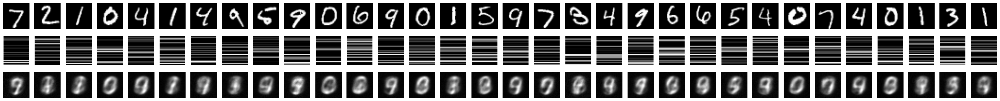

  1/938 [..............................] - ETA: 1:14 - loss: 0.0606

  3/938 [..............................] - ETA: 40s - loss: 0.0602 

  5/938 [..............................] - ETA: 41s - loss: 0.0614

  7/938 [..............................] - ETA: 40s - loss: 0.0604

  9/938 [..............................] - ETA: 40s - loss: 0.0603

 11/938 [..............................] - ETA: 38s - loss: 0.0608

 13/938 [..............................] - ETA: 38s - loss: 0.0609

 15/938 [..............................] - ETA: 37s - loss: 0.0609

 17/938 [..............................] - ETA: 37s - loss: 0.0606

 19/938 [..............................] - ETA: 38s - loss: 0.0608

 21/938 [..............................] - ETA: 37s - loss: 0.0612

 23/938 [..............................] - ETA: 37s - loss: 0.0615

 25/938 [..............................] - ETA: 37s - loss: 0.0615

 27/938 [..............................] - ETA: 37s - loss: 0.0613

 29/938 [..............................] - ETA: 36s - loss: 0.0612

 31/938 [..............................] - ETA: 36s - loss: 0.0613

 33/938 [>.............................] - ETA: 35s - loss: 0.0614

 35/938 [>.............................] - ETA: 36s - loss: 0.0613

 37/938 [>.............................] - ETA: 36s - loss: 0.0614

 39/938 [>.............................] - ETA: 36s - loss: 0.0614

 41/938 [>.............................] - ETA: 36s - loss: 0.0614

 43/938 [>.............................] - ETA: 36s - loss: 0.0615

 45/938 [>.............................] - ETA: 35s - loss: 0.0616

 47/938 [>.............................] - ETA: 35s - loss: 0.0615

 49/938 [>.............................] - ETA: 35s - loss: 0.0615

 51/938 [>.............................] - ETA: 35s - loss: 0.0613

 53/938 [>.............................] - ETA: 35s - loss: 0.0612

 55/938 [>.............................] - ETA: 35s - loss: 0.0612

 57/938 [>.............................] - ETA: 34s - loss: 0.0613

 59/938 [>.............................] - ETA: 34s - loss: 0.0614

 61/938 [>.............................] - ETA: 34s - loss: 0.0613

 63/938 [=>............................] - ETA: 34s - loss: 0.0613

 65/938 [=>............................] - ETA: 34s - loss: 0.0612

 67/938 [=>............................] - ETA: 34s - loss: 0.0612

 69/938 [=>............................] - ETA: 34s - loss: 0.0612

 71/938 [=>............................] - ETA: 34s - loss: 0.0612

 73/938 [=>............................] - ETA: 34s - loss: 0.0613

 75/938 [=>............................] - ETA: 34s - loss: 0.0616

 77/938 [=>............................] - ETA: 34s - loss: 0.0617

 79/938 [=>............................] - ETA: 34s - loss: 0.0616

 81/938 [=>............................] - ETA: 34s - loss: 0.0616

 83/938 [=>............................] - ETA: 33s - loss: 0.0617

 85/938 [=>............................] - ETA: 33s - loss: 0.0617

 87/938 [=>............................] - ETA: 33s - loss: 0.0617

 89/938 [=>............................] - ETA: 33s - loss: 0.0617

 91/938 [=>............................] - ETA: 33s - loss: 0.0617

 93/938 [=>............................] - ETA: 33s - loss: 0.0616

 95/938 [==>...........................] - ETA: 33s - loss: 0.0617

 96/938 [==>...........................] - ETA: 33s - loss: 0.0617

 98/938 [==>...........................] - ETA: 33s - loss: 0.0617

100/938 [==>...........................] - ETA: 33s - loss: 0.0617

102/938 [==>...........................] - ETA: 33s - loss: 0.0617

104/938 [==>...........................] - ETA: 33s - loss: 0.0616

106/938 [==>...........................] - ETA: 33s - loss: 0.0615

108/938 [==>...........................] - ETA: 33s - loss: 0.0614

110/938 [==>...........................] - ETA: 33s - loss: 0.0614

112/938 [==>...........................] - ETA: 32s - loss: 0.0614

114/938 [==>...........................] - ETA: 32s - loss: 0.0613

116/938 [==>...........................] - ETA: 32s - loss: 0.0612

118/938 [==>...........................] - ETA: 32s - loss: 0.0611

120/938 [==>...........................] - ETA: 32s - loss: 0.0611

122/938 [==>...........................] - ETA: 32s - loss: 0.0611

124/938 [==>...........................] - ETA: 32s - loss: 0.0611

126/938 [===>..........................] - ETA: 32s - loss: 0.0611

128/938 [===>..........................] - ETA: 32s - loss: 0.0611

130/938 [===>..........................] - ETA: 32s - loss: 0.0611

132/938 [===>..........................] - ETA: 32s - loss: 0.0611

134/938 [===>..........................] - ETA: 32s - loss: 0.0611

136/938 [===>..........................] - ETA: 32s - loss: 0.0611

138/938 [===>..........................] - ETA: 31s - loss: 0.0611

139/938 [===>..........................] - ETA: 31s - loss: 0.0611

141/938 [===>..........................] - ETA: 31s - loss: 0.0611

143/938 [===>..........................] - ETA: 31s - loss: 0.0610

145/938 [===>..........................] - ETA: 31s - loss: 0.0610

147/938 [===>..........................] - ETA: 31s - loss: 0.0610

149/938 [===>..........................] - ETA: 31s - loss: 0.0611

151/938 [===>..........................] - ETA: 31s - loss: 0.0611

153/938 [===>..........................] - ETA: 31s - loss: 0.0611

155/938 [===>..........................] - ETA: 31s - loss: 0.0611

157/938 [====>.........................] - ETA: 31s - loss: 0.0611

159/938 [====>.........................] - ETA: 31s - loss: 0.0611

161/938 [====>.........................] - ETA: 31s - loss: 0.0611

163/938 [====>.........................] - ETA: 30s - loss: 0.0611

165/938 [====>.........................] - ETA: 30s - loss: 0.0611

166/938 [====>.........................] - ETA: 30s - loss: 0.0611

168/938 [====>.........................] - ETA: 30s - loss: 0.0611

170/938 [====>.........................] - ETA: 30s - loss: 0.0610

172/938 [====>.........................] - ETA: 30s - loss: 0.0610

173/938 [====>.........................] - ETA: 30s - loss: 0.0610

175/938 [====>.........................] - ETA: 30s - loss: 0.0610

177/938 [====>.........................] - ETA: 30s - loss: 0.0609

179/938 [====>.........................] - ETA: 30s - loss: 0.0609

181/938 [====>.........................] - ETA: 30s - loss: 0.0609

183/938 [====>.........................] - ETA: 30s - loss: 0.0608

185/938 [====>.........................] - ETA: 30s - loss: 0.0608

187/938 [====>.........................] - ETA: 30s - loss: 0.0607

189/938 [=====>........................] - ETA: 30s - loss: 0.0607

191/938 [=====>........................] - ETA: 30s - loss: 0.0607

193/938 [=====>........................] - ETA: 29s - loss: 0.0607

195/938 [=====>........................] - ETA: 29s - loss: 0.0607

197/938 [=====>........................] - ETA: 29s - loss: 0.0607

199/938 [=====>........................] - ETA: 29s - loss: 0.0607

201/938 [=====>........................] - ETA: 29s - loss: 0.0607

203/938 [=====>........................] - ETA: 29s - loss: 0.0607

205/938 [=====>........................] - ETA: 29s - loss: 0.0608

206/938 [=====>........................] - ETA: 29s - loss: 0.0608

208/938 [=====>........................] - ETA: 29s - loss: 0.0608

210/938 [=====>........................] - ETA: 29s - loss: 0.0608

212/938 [=====>........................] - ETA: 29s - loss: 0.0608

213/938 [=====>........................] - ETA: 29s - loss: 0.0608

215/938 [=====>........................] - ETA: 29s - loss: 0.0608

216/938 [=====>........................] - ETA: 29s - loss: 0.0608

218/938 [=====>........................] - ETA: 29s - loss: 0.0608

220/938 [======>.......................] - ETA: 29s - loss: 0.0608

221/938 [======>.......................] - ETA: 29s - loss: 0.0608

222/938 [======>.......................] - ETA: 29s - loss: 0.0609

223/938 [======>.......................] - ETA: 29s - loss: 0.0609

224/938 [======>.......................] - ETA: 29s - loss: 0.0609

225/938 [======>.......................] - ETA: 29s - loss: 0.0609

226/938 [======>.......................] - ETA: 29s - loss: 0.0608

228/938 [======>.......................] - ETA: 29s - loss: 0.0608

230/938 [======>.......................] - ETA: 28s - loss: 0.0609

231/938 [======>.......................] - ETA: 28s - loss: 0.0609

233/938 [======>.......................] - ETA: 28s - loss: 0.0609

235/938 [======>.......................] - ETA: 28s - loss: 0.0609

237/938 [======>.......................] - ETA: 28s - loss: 0.0608

239/938 [======>.......................] - ETA: 28s - loss: 0.0608

240/938 [======>.......................] - ETA: 28s - loss: 0.0608

241/938 [======>.......................] - ETA: 28s - loss: 0.0608

242/938 [======>.......................] - ETA: 28s - loss: 0.0607

243/938 [======>.......................] - ETA: 28s - loss: 0.0607

244/938 [======>.......................] - ETA: 28s - loss: 0.0607

245/938 [======>.......................] - ETA: 28s - loss: 0.0607

246/938 [======>.......................] - ETA: 28s - loss: 0.0607

247/938 [======>.......................] - ETA: 29s - loss: 0.0607

248/938 [======>.......................] - ETA: 29s - loss: 0.0607

249/938 [======>.......................] - ETA: 29s - loss: 0.0607

250/938 [======>.......................] - ETA: 29s - loss: 0.0606

251/938 [=======>......................] - ETA: 30s - loss: 0.0606

252/938 [=======>......................] - ETA: 30s - loss: 0.0606

253/938 [=======>......................] - ETA: 30s - loss: 0.0606

254/938 [=======>......................] - ETA: 31s - loss: 0.0606

255/938 [=======>......................] - ETA: 31s - loss: 0.0606

256/938 [=======>......................] - ETA: 31s - loss: 0.0606

257/938 [=======>......................] - ETA: 31s - loss: 0.0605

259/938 [=======>......................] - ETA: 31s - loss: 0.0605

261/938 [=======>......................] - ETA: 31s - loss: 0.0605

263/938 [=======>......................] - ETA: 31s - loss: 0.0605

264/938 [=======>......................] - ETA: 31s - loss: 0.0605

265/938 [=======>......................] - ETA: 31s - loss: 0.0605

266/938 [=======>......................] - ETA: 32s - loss: 0.0605

267/938 [=======>......................] - ETA: 32s - loss: 0.0605

268/938 [=======>......................] - ETA: 32s - loss: 0.0605

269/938 [=======>......................] - ETA: 33s - loss: 0.0605

270/938 [=======>......................] - ETA: 33s - loss: 0.0605

271/938 [=======>......................] - ETA: 33s - loss: 0.0605

273/938 [=======>......................] - ETA: 33s - loss: 0.0604

275/938 [=======>......................] - ETA: 32s - loss: 0.0604

276/938 [=======>......................] - ETA: 32s - loss: 0.0604

277/938 [=======>......................] - ETA: 32s - loss: 0.0604

279/938 [=======>......................] - ETA: 32s - loss: 0.0604

281/938 [=======>......................] - ETA: 32s - loss: 0.0603

283/938 [========>.....................] - ETA: 32s - loss: 0.0603

284/938 [========>.....................] - ETA: 32s - loss: 0.0603

286/938 [========>.....................] - ETA: 32s - loss: 0.0602

288/938 [========>.....................] - ETA: 32s - loss: 0.0602

290/938 [========>.....................] - ETA: 32s - loss: 0.0602

291/938 [========>.....................] - ETA: 32s - loss: 0.0602

292/938 [========>.....................] - ETA: 32s - loss: 0.0602

294/938 [========>.....................] - ETA: 31s - loss: 0.0602

296/938 [========>.....................] - ETA: 31s - loss: 0.0601

297/938 [========>.....................] - ETA: 31s - loss: 0.0601

298/938 [========>.....................] - ETA: 31s - loss: 0.0601

300/938 [========>.....................] - ETA: 31s - loss: 0.0601

302/938 [========>.....................] - ETA: 31s - loss: 0.0601

303/938 [========>.....................] - ETA: 31s - loss: 0.0601

305/938 [========>.....................] - ETA: 31s - loss: 0.0601

306/938 [========>.....................] - ETA: 31s - loss: 0.0601

307/938 [========>.....................] - ETA: 31s - loss: 0.0601

309/938 [========>.....................] - ETA: 31s - loss: 0.0601

311/938 [========>.....................] - ETA: 31s - loss: 0.0601

313/938 [=========>....................] - ETA: 30s - loss: 0.0602

314/938 [=========>....................] - ETA: 30s - loss: 0.0602

315/938 [=========>....................] - ETA: 30s - loss: 0.0602

316/938 [=========>....................] - ETA: 30s - loss: 0.0602

317/938 [=========>....................] - ETA: 30s - loss: 0.0602

318/938 [=========>....................] - ETA: 30s - loss: 0.0602

319/938 [=========>....................] - ETA: 30s - loss: 0.0602

321/938 [=========>....................] - ETA: 30s - loss: 0.0602

322/938 [=========>....................] - ETA: 30s - loss: 0.0601

323/938 [=========>....................] - ETA: 30s - loss: 0.0601

324/938 [=========>....................] - ETA: 30s - loss: 0.0601

325/938 [=========>....................] - ETA: 30s - loss: 0.0601

326/938 [=========>....................] - ETA: 30s - loss: 0.0601

328/938 [=========>....................] - ETA: 30s - loss: 0.0601

329/938 [=========>....................] - ETA: 30s - loss: 0.0601

330/938 [=========>....................] - ETA: 30s - loss: 0.0600

331/938 [=========>....................] - ETA: 30s - loss: 0.0600

333/938 [=========>....................] - ETA: 30s - loss: 0.0600

335/938 [=========>....................] - ETA: 29s - loss: 0.0600

337/938 [=========>....................] - ETA: 29s - loss: 0.0600

339/938 [=========>....................] - ETA: 29s - loss: 0.0600

341/938 [=========>....................] - ETA: 29s - loss: 0.0600

343/938 [=========>....................] - ETA: 29s - loss: 0.0600

345/938 [==========>...................] - ETA: 29s - loss: 0.0600

347/938 [==========>...................] - ETA: 29s - loss: 0.0601

349/938 [==========>...................] - ETA: 29s - loss: 0.0600

351/938 [==========>...................] - ETA: 28s - loss: 0.0600

353/938 [==========>...................] - ETA: 28s - loss: 0.0600

355/938 [==========>...................] - ETA: 28s - loss: 0.0600

357/938 [==========>...................] - ETA: 28s - loss: 0.0600

359/938 [==========>...................] - ETA: 28s - loss: 0.0600

360/938 [==========>...................] - ETA: 28s - loss: 0.0600

362/938 [==========>...................] - ETA: 28s - loss: 0.0600

364/938 [==========>...................] - ETA: 28s - loss: 0.0600

366/938 [==========>...................] - ETA: 28s - loss: 0.0600

368/938 [==========>...................] - ETA: 27s - loss: 0.0600

370/938 [==========>...................] - ETA: 27s - loss: 0.0600

372/938 [==========>...................] - ETA: 27s - loss: 0.0600

374/938 [==========>...................] - ETA: 27s - loss: 0.0600

376/938 [===========>..................] - ETA: 27s - loss: 0.0599

378/938 [===========>..................] - ETA: 27s - loss: 0.0599

380/938 [===========>..................] - ETA: 27s - loss: 0.0599

382/938 [===========>..................] - ETA: 27s - loss: 0.0598

384/938 [===========>..................] - ETA: 26s - loss: 0.0598

386/938 [===========>..................] - ETA: 26s - loss: 0.0598

388/938 [===========>..................] - ETA: 26s - loss: 0.0598

390/938 [===========>..................] - ETA: 26s - loss: 0.0598

392/938 [===========>..................] - ETA: 26s - loss: 0.0597

394/938 [===========>..................] - ETA: 26s - loss: 0.0597

396/938 [===========>..................] - ETA: 26s - loss: 0.0597

398/938 [===========>..................] - ETA: 26s - loss: 0.0597

400/938 [===========>..................] - ETA: 25s - loss: 0.0597

402/938 [===========>..................] - ETA: 25s - loss: 0.0597

404/938 [===========>..................] - ETA: 25s - loss: 0.0597

406/938 [===========>..................] - ETA: 25s - loss: 0.0597

408/938 [============>.................] - ETA: 25s - loss: 0.0596

410/938 [============>.................] - ETA: 25s - loss: 0.0596

412/938 [============>.................] - ETA: 25s - loss: 0.0596

413/938 [============>.................] - ETA: 25s - loss: 0.0596

415/938 [============>.................] - ETA: 25s - loss: 0.0595

417/938 [============>.................] - ETA: 25s - loss: 0.0595

419/938 [============>.................] - ETA: 24s - loss: 0.0595

421/938 [============>.................] - ETA: 24s - loss: 0.0595

423/938 [============>.................] - ETA: 24s - loss: 0.0595

425/938 [============>.................] - ETA: 24s - loss: 0.0595

426/938 [============>.................] - ETA: 24s - loss: 0.0595

428/938 [============>.................] - ETA: 24s - loss: 0.0595

430/938 [============>.................] - ETA: 24s - loss: 0.0595

432/938 [============>.................] - ETA: 24s - loss: 0.0595

434/938 [============>.................] - ETA: 24s - loss: 0.0594

436/938 [============>.................] - ETA: 23s - loss: 0.0594

438/938 [=============>................] - ETA: 23s - loss: 0.0594

440/938 [=============>................] - ETA: 23s - loss: 0.0594

442/938 [=============>................] - ETA: 23s - loss: 0.0594

444/938 [=============>................] - ETA: 23s - loss: 0.0594

446/938 [=============>................] - ETA: 23s - loss: 0.0594

448/938 [=============>................] - ETA: 23s - loss: 0.0594

450/938 [=============>................] - ETA: 23s - loss: 0.0594

452/938 [=============>................] - ETA: 23s - loss: 0.0594

454/938 [=============>................] - ETA: 22s - loss: 0.0594

456/938 [=============>................] - ETA: 22s - loss: 0.0594

458/938 [=============>................] - ETA: 22s - loss: 0.0593

460/938 [=============>................] - ETA: 22s - loss: 0.0593

462/938 [=============>................] - ETA: 22s - loss: 0.0593

464/938 [=============>................] - ETA: 22s - loss: 0.0593

466/938 [=============>................] - ETA: 22s - loss: 0.0593

468/938 [=============>................] - ETA: 22s - loss: 0.0592

470/938 [==============>...............] - ETA: 22s - loss: 0.0592

472/938 [==============>...............] - ETA: 21s - loss: 0.0592

474/938 [==============>...............] - ETA: 21s - loss: 0.0592

476/938 [==============>...............] - ETA: 21s - loss: 0.0592

478/938 [==============>...............] - ETA: 21s - loss: 0.0592

480/938 [==============>...............] - ETA: 21s - loss: 0.0592

481/938 [==============>...............] - ETA: 21s - loss: 0.0591

483/938 [==============>...............] - ETA: 21s - loss: 0.0591

485/938 [==============>...............] - ETA: 21s - loss: 0.0591

487/938 [==============>...............] - ETA: 21s - loss: 0.0591

489/938 [==============>...............] - ETA: 21s - loss: 0.0591

491/938 [==============>...............] - ETA: 20s - loss: 0.0590

493/938 [==============>...............] - ETA: 20s - loss: 0.0590

495/938 [==============>...............] - ETA: 20s - loss: 0.0590

497/938 [==============>...............] - ETA: 20s - loss: 0.0590

499/938 [==============>...............] - ETA: 20s - loss: 0.0590

501/938 [===============>..............] - ETA: 20s - loss: 0.0590

503/938 [===============>..............] - ETA: 20s - loss: 0.0589

505/938 [===============>..............] - ETA: 20s - loss: 0.0589

507/938 [===============>..............] - ETA: 20s - loss: 0.0589

509/938 [===============>..............] - ETA: 19s - loss: 0.0589

511/938 [===============>..............] - ETA: 19s - loss: 0.0589

513/938 [===============>..............] - ETA: 19s - loss: 0.0589

515/938 [===============>..............] - ETA: 19s - loss: 0.0589

517/938 [===============>..............] - ETA: 19s - loss: 0.0589

519/938 [===============>..............] - ETA: 19s - loss: 0.0589

521/938 [===============>..............] - ETA: 19s - loss: 0.0589

523/938 [===============>..............] - ETA: 19s - loss: 0.0588

525/938 [===============>..............] - ETA: 19s - loss: 0.0588

527/938 [===============>..............] - ETA: 19s - loss: 0.0588

529/938 [===============>..............] - ETA: 18s - loss: 0.0588

531/938 [===============>..............] - ETA: 18s - loss: 0.0588

532/938 [================>.............] - ETA: 18s - loss: 0.0587

534/938 [================>.............] - ETA: 18s - loss: 0.0587

536/938 [================>.............] - ETA: 18s - loss: 0.0587

538/938 [================>.............] - ETA: 18s - loss: 0.0587

540/938 [================>.............] - ETA: 18s - loss: 0.0587

542/938 [================>.............] - ETA: 18s - loss: 0.0587

544/938 [================>.............] - ETA: 18s - loss: 0.0587

546/938 [================>.............] - ETA: 18s - loss: 0.0587

548/938 [================>.............] - ETA: 18s - loss: 0.0586

550/938 [================>.............] - ETA: 17s - loss: 0.0586

552/938 [================>.............] - ETA: 17s - loss: 0.0586

554/938 [================>.............] - ETA: 17s - loss: 0.0586

556/938 [================>.............] - ETA: 17s - loss: 0.0586

558/938 [================>.............] - ETA: 17s - loss: 0.0586

560/938 [================>.............] - ETA: 17s - loss: 0.0586

561/938 [================>.............] - ETA: 17s - loss: 0.0586

563/938 [=================>............] - ETA: 17s - loss: 0.0585

565/938 [=================>............] - ETA: 17s - loss: 0.0585

567/938 [=================>............] - ETA: 17s - loss: 0.0585

569/938 [=================>............] - ETA: 16s - loss: 0.0585

571/938 [=================>............] - ETA: 16s - loss: 0.0585

573/938 [=================>............] - ETA: 16s - loss: 0.0585

575/938 [=================>............] - ETA: 16s - loss: 0.0585

577/938 [=================>............] - ETA: 16s - loss: 0.0585

579/938 [=================>............] - ETA: 16s - loss: 0.0585

581/938 [=================>............] - ETA: 16s - loss: 0.0585

583/938 [=================>............] - ETA: 16s - loss: 0.0585

584/938 [=================>............] - ETA: 16s - loss: 0.0585

585/938 [=================>............] - ETA: 16s - loss: 0.0585

587/938 [=================>............] - ETA: 16s - loss: 0.0585

588/938 [=================>............] - ETA: 16s - loss: 0.0585

590/938 [=================>............] - ETA: 15s - loss: 0.0585

592/938 [=================>............] - ETA: 15s - loss: 0.0585

594/938 [=================>............] - ETA: 15s - loss: 0.0585

596/938 [==================>...........] - ETA: 15s - loss: 0.0584

597/938 [==================>...........] - ETA: 15s - loss: 0.0584

598/938 [==================>...........] - ETA: 15s - loss: 0.0584

599/938 [==================>...........] - ETA: 15s - loss: 0.0584

600/938 [==================>...........] - ETA: 15s - loss: 0.0584

601/938 [==================>...........] - ETA: 15s - loss: 0.0584

602/938 [==================>...........] - ETA: 15s - loss: 0.0584

603/938 [==================>...........] - ETA: 15s - loss: 0.0584

604/938 [==================>...........] - ETA: 15s - loss: 0.0584

605/938 [==================>...........] - ETA: 15s - loss: 0.0584

606/938 [==================>...........] - ETA: 15s - loss: 0.0584

607/938 [==================>...........] - ETA: 15s - loss: 0.0584

608/938 [==================>...........] - ETA: 15s - loss: 0.0584

609/938 [==================>...........] - ETA: 15s - loss: 0.0584

610/938 [==================>...........] - ETA: 15s - loss: 0.0584

611/938 [==================>...........] - ETA: 15s - loss: 0.0584

612/938 [==================>...........] - ETA: 15s - loss: 0.0584

613/938 [==================>...........] - ETA: 14s - loss: 0.0583

614/938 [==================>...........] - ETA: 14s - loss: 0.0583

616/938 [==================>...........] - ETA: 14s - loss: 0.0583

617/938 [==================>...........] - ETA: 14s - loss: 0.0583

618/938 [==================>...........] - ETA: 14s - loss: 0.0583

619/938 [==================>...........] - ETA: 14s - loss: 0.0583

620/938 [==================>...........] - ETA: 14s - loss: 0.0583

622/938 [==================>...........] - ETA: 14s - loss: 0.0583

623/938 [==================>...........] - ETA: 14s - loss: 0.0583

625/938 [==================>...........] - ETA: 14s - loss: 0.0583

627/938 [===================>..........] - ETA: 14s - loss: 0.0583

629/938 [===================>..........] - ETA: 14s - loss: 0.0582

631/938 [===================>..........] - ETA: 14s - loss: 0.0582

633/938 [===================>..........] - ETA: 14s - loss: 0.0582

635/938 [===================>..........] - ETA: 13s - loss: 0.0582

637/938 [===================>..........] - ETA: 13s - loss: 0.0582

639/938 [===================>..........] - ETA: 13s - loss: 0.0582

641/938 [===================>..........] - ETA: 13s - loss: 0.0582

643/938 [===================>..........] - ETA: 13s - loss: 0.0582

645/938 [===================>..........] - ETA: 13s - loss: 0.0582

647/938 [===================>..........] - ETA: 13s - loss: 0.0582

649/938 [===================>..........] - ETA: 13s - loss: 0.0582

650/938 [===================>..........] - ETA: 13s - loss: 0.0581

651/938 [===================>..........] - ETA: 13s - loss: 0.0581

653/938 [===================>..........] - ETA: 13s - loss: 0.0581

654/938 [===================>..........] - ETA: 13s - loss: 0.0581

656/938 [===================>..........] - ETA: 12s - loss: 0.0581

658/938 [====================>.........] - ETA: 12s - loss: 0.0581

660/938 [====================>.........] - ETA: 12s - loss: 0.0581

661/938 [====================>.........] - ETA: 12s - loss: 0.0581

663/938 [====================>.........] - ETA: 12s - loss: 0.0581

665/938 [====================>.........] - ETA: 12s - loss: 0.0581

666/938 [====================>.........] - ETA: 12s - loss: 0.0581

668/938 [====================>.........] - ETA: 12s - loss: 0.0581

670/938 [====================>.........] - ETA: 12s - loss: 0.0581

671/938 [====================>.........] - ETA: 12s - loss: 0.0580

672/938 [====================>.........] - ETA: 12s - loss: 0.0580

673/938 [====================>.........] - ETA: 12s - loss: 0.0580

674/938 [====================>.........] - ETA: 12s - loss: 0.0580

676/938 [====================>.........] - ETA: 12s - loss: 0.0580

677/938 [====================>.........] - ETA: 12s - loss: 0.0580

678/938 [====================>.........] - ETA: 12s - loss: 0.0580

679/938 [====================>.........] - ETA: 11s - loss: 0.0580

681/938 [====================>.........] - ETA: 11s - loss: 0.0580

683/938 [====================>.........] - ETA: 11s - loss: 0.0580

684/938 [====================>.........] - ETA: 11s - loss: 0.0579

686/938 [====================>.........] - ETA: 11s - loss: 0.0579

688/938 [=====================>........] - ETA: 11s - loss: 0.0579

689/938 [=====================>........] - ETA: 11s - loss: 0.0579

691/938 [=====================>........] - ETA: 11s - loss: 0.0579

692/938 [=====================>........] - ETA: 11s - loss: 0.0579

693/938 [=====================>........] - ETA: 11s - loss: 0.0579

694/938 [=====================>........] - ETA: 11s - loss: 0.0579

696/938 [=====================>........] - ETA: 11s - loss: 0.0579

698/938 [=====================>........] - ETA: 11s - loss: 0.0579

700/938 [=====================>........] - ETA: 10s - loss: 0.0578

702/938 [=====================>........] - ETA: 10s - loss: 0.0578

704/938 [=====================>........] - ETA: 10s - loss: 0.0578

705/938 [=====================>........] - ETA: 10s - loss: 0.0578

707/938 [=====================>........] - ETA: 10s - loss: 0.0578

709/938 [=====================>........] - ETA: 10s - loss: 0.0578

710/938 [=====================>........] - ETA: 10s - loss: 0.0578

712/938 [=====================>........] - ETA: 10s - loss: 0.0578

714/938 [=====================>........] - ETA: 10s - loss: 0.0578

716/938 [=====================>........] - ETA: 10s - loss: 0.0578

718/938 [=====================>........] - ETA: 10s - loss: 0.0577

719/938 [=====================>........] - ETA: 10s - loss: 0.0577

721/938 [======================>.......] - ETA: 10s - loss: 0.0577

722/938 [======================>.......] - ETA: 9s - loss: 0.0577 

724/938 [======================>.......] - ETA: 9s - loss: 0.0577

726/938 [======================>.......] - ETA: 9s - loss: 0.0577

728/938 [======================>.......] - ETA: 9s - loss: 0.0577

730/938 [======================>.......] - ETA: 9s - loss: 0.0577

731/938 [======================>.......] - ETA: 9s - loss: 0.0577

732/938 [======================>.......] - ETA: 9s - loss: 0.0577

734/938 [======================>.......] - ETA: 9s - loss: 0.0577

736/938 [======================>.......] - ETA: 9s - loss: 0.0577

738/938 [======================>.......] - ETA: 9s - loss: 0.0576

740/938 [======================>.......] - ETA: 9s - loss: 0.0576

742/938 [======================>.......] - ETA: 9s - loss: 0.0576

743/938 [======================>.......] - ETA: 8s - loss: 0.0576

744/938 [======================>.......] - ETA: 8s - loss: 0.0576

746/938 [======================>.......] - ETA: 8s - loss: 0.0576

747/938 [======================>.......] - ETA: 8s - loss: 0.0576

749/938 [======================>.......] - ETA: 8s - loss: 0.0576

750/938 [======================>.......] - ETA: 8s - loss: 0.0576

751/938 [=======================>......] - ETA: 8s - loss: 0.0576

752/938 [=======================>......] - ETA: 8s - loss: 0.0576

754/938 [=======================>......] - ETA: 8s - loss: 0.0576

756/938 [=======================>......] - ETA: 8s - loss: 0.0576

758/938 [=======================>......] - ETA: 8s - loss: 0.0576

760/938 [=======================>......] - ETA: 8s - loss: 0.0576

762/938 [=======================>......] - ETA: 8s - loss: 0.0576

764/938 [=======================>......] - ETA: 8s - loss: 0.0576

765/938 [=======================>......] - ETA: 7s - loss: 0.0576

767/938 [=======================>......] - ETA: 7s - loss: 0.0575

769/938 [=======================>......] - ETA: 7s - loss: 0.0575

771/938 [=======================>......] - ETA: 7s - loss: 0.0575

773/938 [=======================>......] - ETA: 7s - loss: 0.0575

775/938 [=======================>......] - ETA: 7s - loss: 0.0575

777/938 [=======================>......] - ETA: 7s - loss: 0.0575

779/938 [=======================>......] - ETA: 7s - loss: 0.0575

781/938 [=======================>......] - ETA: 7s - loss: 0.0575

783/938 [========================>.....] - ETA: 7s - loss: 0.0575

785/938 [========================>.....] - ETA: 7s - loss: 0.0575

787/938 [========================>.....] - ETA: 6s - loss: 0.0574

789/938 [========================>.....] - ETA: 6s - loss: 0.0574

791/938 [========================>.....] - ETA: 6s - loss: 0.0574

793/938 [========================>.....] - ETA: 6s - loss: 0.0574

795/938 [========================>.....] - ETA: 6s - loss: 0.0574

797/938 [========================>.....] - ETA: 6s - loss: 0.0574

799/938 [========================>.....] - ETA: 6s - loss: 0.0574

801/938 [========================>.....] - ETA: 6s - loss: 0.0574

803/938 [========================>.....] - ETA: 6s - loss: 0.0574

805/938 [========================>.....] - ETA: 6s - loss: 0.0574

807/938 [========================>.....] - ETA: 6s - loss: 0.0573

809/938 [========================>.....] - ETA: 5s - loss: 0.0573

811/938 [========================>.....] - ETA: 5s - loss: 0.0573

813/938 [=========================>....] - ETA: 5s - loss: 0.0573

815/938 [=========================>....] - ETA: 5s - loss: 0.0573

817/938 [=========================>....] - ETA: 5s - loss: 0.0573

818/938 [=========================>....] - ETA: 5s - loss: 0.0573

820/938 [=========================>....] - ETA: 5s - loss: 0.0573

822/938 [=========================>....] - ETA: 5s - loss: 0.0572

824/938 [=========================>....] - ETA: 5s - loss: 0.0572

826/938 [=========================>....] - ETA: 5s - loss: 0.0572

828/938 [=========================>....] - ETA: 5s - loss: 0.0572

830/938 [=========================>....] - ETA: 4s - loss: 0.0572

832/938 [=========================>....] - ETA: 4s - loss: 0.0572

834/938 [=========================>....] - ETA: 4s - loss: 0.0572

836/938 [=========================>....] - ETA: 4s - loss: 0.0572

838/938 [=========================>....] - ETA: 4s - loss: 0.0571

840/938 [=========================>....] - ETA: 4s - loss: 0.0571

842/938 [=========================>....] - ETA: 4s - loss: 0.0571

844/938 [=========================>....] - ETA: 4s - loss: 0.0571

846/938 [==========================>...] - ETA: 4s - loss: 0.0571

848/938 [==========================>...] - ETA: 4s - loss: 0.0571

850/938 [==========================>...] - ETA: 4s - loss: 0.0571

852/938 [==========================>...] - ETA: 3s - loss: 0.0571

854/938 [==========================>...] - ETA: 3s - loss: 0.0571

856/938 [==========================>...] - ETA: 3s - loss: 0.0570

858/938 [==========================>...] - ETA: 3s - loss: 0.0570

860/938 [==========================>...] - ETA: 3s - loss: 0.0570

862/938 [==========================>...] - ETA: 3s - loss: 0.0570

864/938 [==========================>...] - ETA: 3s - loss: 0.0570

866/938 [==========================>...] - ETA: 3s - loss: 0.0570

868/938 [==========================>...] - ETA: 3s - loss: 0.0570

870/938 [==========================>...] - ETA: 3s - loss: 0.0570

872/938 [==========================>...] - ETA: 3s - loss: 0.0570

874/938 [==========================>...] - ETA: 2s - loss: 0.0569

876/938 [===========================>..] - ETA: 2s - loss: 0.0569

878/938 [===========================>..] - ETA: 2s - loss: 0.0569

880/938 [===========================>..] - ETA: 2s - loss: 0.0569

882/938 [===========================>..] - ETA: 2s - loss: 0.0569

884/938 [===========================>..] - ETA: 2s - loss: 0.0569

886/938 [===========================>..] - ETA: 2s - loss: 0.0569

888/938 [===========================>..] - ETA: 2s - loss: 0.0569

890/938 [===========================>..] - ETA: 2s - loss: 0.0569

892/938 [===========================>..] - ETA: 2s - loss: 0.0569

894/938 [===========================>..] - ETA: 1s - loss: 0.0569

896/938 [===========================>..] - ETA: 1s - loss: 0.0568

898/938 [===========================>..] - ETA: 1s - loss: 0.0568

900/938 [===========================>..] - ETA: 1s - loss: 0.0568

902/938 [===========================>..] - ETA: 1s - loss: 0.0568

904/938 [===========================>..] - ETA: 1s - loss: 0.0568

906/938 [===========================>..] - ETA: 1s - loss: 0.0568

908/938 [============================>.] - ETA: 1s - loss: 0.0568

910/938 [============================>.] - ETA: 1s - loss: 0.0568

912/938 [============================>.] - ETA: 1s - loss: 0.0568

914/938 [============================>.] - ETA: 1s - loss: 0.0567

916/938 [============================>.] - ETA: 0s - loss: 0.0567

918/938 [============================>.] - ETA: 0s - loss: 0.0567

919/938 [============================>.] - ETA: 0s - loss: 0.0567

921/938 [============================>.] - ETA: 0s - loss: 0.0567

923/938 [============================>.] - ETA: 0s - loss: 0.0567

925/938 [============================>.] - ETA: 0s - loss: 0.0566

927/938 [============================>.] - ETA: 0s - loss: 0.0566

929/938 [============================>.] - ETA: 0s - loss: 0.0567

931/938 [============================>.] - ETA: 0s - loss: 0.0567

933/938 [============================>.] - ETA: 0s - loss: 0.0567

935/938 [============================>.] - ETA: 0s - loss: 0.0566

937/938 [============================>.] - ETA: 0s - loss: 0.0566

938/938 [==============================] - 47s 51ms/step - loss: 0.0566 - val_loss: 0.0525
batch_vals = tf.Tensor(
[[  0   0  99  63  13   0   0   0  91   0   0   0   0   0  62   0  67   1
    0   0  81   0   0 127   0   0   0 127  93   0  55   1]
 [  0   0  36 100 127 127   0  34   0   0  23  38   0  50  14  93   0  35
    0   0   0   0   0 127   0   0   0 115 127   0  58   0]
 [  0   0  37   0   0  86   0  27   0  56   0   0  27  92 127 127  76  47
    0   0   0   0 127 127   0   0   0 125 127  11 127   0]
 [  0   0  75   0  32  21   0   0   0   0   0   8   0   0 126   0  63  82
  121   0 127   0  16  83   0   0   0 127  13 127  65   0]
 [ 20   0 127   0   0   0   0  23   0   0   0   0  63   0 127   0  50  64
    0   0   4   0  13 104   0  59   0 127  11 127  83   0]
 [  0   0   0 127   0  26 127   0   0   0   0  62  54   0 109  85  16 127
    0   0 127   0   0 127   0   0   0 127  91   0  74   0]
 [  0   0 127   0  47  40   0   0   0   0   0   0  41  21  72   0   0   0
    0   0  29

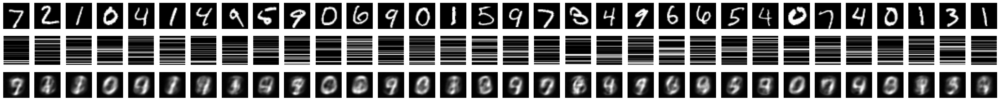

  1/938 [..............................] - ETA: 1:06 - loss: 0.0526

  2/938 [..............................] - ETA: 57s - loss: 0.0508 

  3/938 [..............................] - ETA: 1:02 - loss: 0.0507

  5/938 [..............................] - ETA: 54s - loss: 0.0498 

  6/938 [..............................] - ETA: 52s - loss: 0.0498

  8/938 [..............................] - ETA: 49s - loss: 0.0506

  9/938 [..............................] - ETA: 50s - loss: 0.0503

 10/938 [..............................] - ETA: 51s - loss: 0.0505

 11/938 [..............................] - ETA: 52s - loss: 0.0505

 12/938 [..............................] - ETA: 51s - loss: 0.0508

 14/938 [..............................] - ETA: 51s - loss: 0.0510

 15/938 [..............................] - ETA: 51s - loss: 0.0511

 17/938 [..............................] - ETA: 50s - loss: 0.0509

 19/938 [..............................] - ETA: 49s - loss: 0.0511

 20/938 [..............................] - ETA: 49s - loss: 0.0514

 22/938 [..............................] - ETA: 48s - loss: 0.0517

 23/938 [..............................] - ETA: 48s - loss: 0.0516

 24/938 [..............................] - ETA: 48s - loss: 0.0518

 26/938 [..............................] - ETA: 47s - loss: 0.0516

 28/938 [..............................] - ETA: 47s - loss: 0.0515

 29/938 [..............................] - ETA: 47s - loss: 0.0515

 30/938 [..............................] - ETA: 47s - loss: 0.0515

 31/938 [..............................] - ETA: 47s - loss: 0.0514

 33/938 [>.............................] - ETA: 46s - loss: 0.0514

 35/938 [>.............................] - ETA: 46s - loss: 0.0516

 36/938 [>.............................] - ETA: 46s - loss: 0.0515

 38/938 [>.............................] - ETA: 45s - loss: 0.0515

 40/938 [>.............................] - ETA: 44s - loss: 0.0516

 42/938 [>.............................] - ETA: 43s - loss: 0.0517

 44/938 [>.............................] - ETA: 43s - loss: 0.0518

 46/938 [>.............................] - ETA: 42s - loss: 0.0519

 48/938 [>.............................] - ETA: 42s - loss: 0.0518

 50/938 [>.............................] - ETA: 41s - loss: 0.0517

 52/938 [>.............................] - ETA: 41s - loss: 0.0516

 54/938 [>.............................] - ETA: 41s - loss: 0.0515

 56/938 [>.............................] - ETA: 41s - loss: 0.0516

 58/938 [>.............................] - ETA: 40s - loss: 0.0517

 60/938 [>.............................] - ETA: 40s - loss: 0.0518

 62/938 [>.............................] - ETA: 40s - loss: 0.0517

 64/938 [=>............................] - ETA: 40s - loss: 0.0517

 66/938 [=>............................] - ETA: 39s - loss: 0.0517

 68/938 [=>............................] - ETA: 39s - loss: 0.0517

 70/938 [=>............................] - ETA: 39s - loss: 0.0516

 72/938 [=>............................] - ETA: 39s - loss: 0.0517

 74/938 [=>............................] - ETA: 38s - loss: 0.0518

 76/938 [=>............................] - ETA: 38s - loss: 0.0521

 78/938 [=>............................] - ETA: 38s - loss: 0.0521

 80/938 [=>............................] - ETA: 38s - loss: 0.0521

 82/938 [=>............................] - ETA: 38s - loss: 0.0521

 84/938 [=>............................] - ETA: 38s - loss: 0.0522

 86/938 [=>............................] - ETA: 37s - loss: 0.0522

 88/938 [=>............................] - ETA: 37s - loss: 0.0522

 90/938 [=>............................] - ETA: 37s - loss: 0.0521

 92/938 [=>............................] - ETA: 37s - loss: 0.0521

 94/938 [==>...........................] - ETA: 37s - loss: 0.0522

 96/938 [==>...........................] - ETA: 37s - loss: 0.0522

 98/938 [==>...........................] - ETA: 36s - loss: 0.0522

100/938 [==>...........................] - ETA: 36s - loss: 0.0522

102/938 [==>...........................] - ETA: 36s - loss: 0.0522

104/938 [==>...........................] - ETA: 36s - loss: 0.0521

106/938 [==>...........................] - ETA: 36s - loss: 0.0520

108/938 [==>...........................] - ETA: 36s - loss: 0.0520

110/938 [==>...........................] - ETA: 35s - loss: 0.0520

112/938 [==>...........................] - ETA: 35s - loss: 0.0519

114/938 [==>...........................] - ETA: 35s - loss: 0.0519

116/938 [==>...........................] - ETA: 35s - loss: 0.0518

118/938 [==>...........................] - ETA: 35s - loss: 0.0518

120/938 [==>...........................] - ETA: 35s - loss: 0.0517

122/938 [==>...........................] - ETA: 35s - loss: 0.0517

124/938 [==>...........................] - ETA: 34s - loss: 0.0518

126/938 [===>..........................] - ETA: 34s - loss: 0.0518

128/938 [===>..........................] - ETA: 34s - loss: 0.0518

130/938 [===>..........................] - ETA: 34s - loss: 0.0518

132/938 [===>..........................] - ETA: 34s - loss: 0.0518

134/938 [===>..........................] - ETA: 34s - loss: 0.0518

136/938 [===>..........................] - ETA: 34s - loss: 0.0519

138/938 [===>..........................] - ETA: 34s - loss: 0.0518

140/938 [===>..........................] - ETA: 33s - loss: 0.0518

142/938 [===>..........................] - ETA: 33s - loss: 0.0518

144/938 [===>..........................] - ETA: 33s - loss: 0.0518

146/938 [===>..........................] - ETA: 33s - loss: 0.0518

148/938 [===>..........................] - ETA: 33s - loss: 0.0518

150/938 [===>..........................] - ETA: 33s - loss: 0.0519

152/938 [===>..........................] - ETA: 33s - loss: 0.0519

154/938 [===>..........................] - ETA: 33s - loss: 0.0519

156/938 [===>..........................] - ETA: 32s - loss: 0.0519

158/938 [====>.........................] - ETA: 32s - loss: 0.0519

160/938 [====>.........................] - ETA: 32s - loss: 0.0519

162/938 [====>.........................] - ETA: 32s - loss: 0.0520

164/938 [====>.........................] - ETA: 32s - loss: 0.0520

166/938 [====>.........................] - ETA: 32s - loss: 0.0520

168/938 [====>.........................] - ETA: 32s - loss: 0.0520

170/938 [====>.........................] - ETA: 32s - loss: 0.0519

172/938 [====>.........................] - ETA: 32s - loss: 0.0520

174/938 [====>.........................] - ETA: 32s - loss: 0.0519

176/938 [====>.........................] - ETA: 32s - loss: 0.0519

177/938 [====>.........................] - ETA: 32s - loss: 0.0519

179/938 [====>.........................] - ETA: 32s - loss: 0.0519

180/938 [====>.........................] - ETA: 32s - loss: 0.0518

182/938 [====>.........................] - ETA: 31s - loss: 0.0518

184/938 [====>.........................] - ETA: 31s - loss: 0.0518

186/938 [====>.........................] - ETA: 31s - loss: 0.0517

188/938 [=====>........................] - ETA: 31s - loss: 0.0517

190/938 [=====>........................] - ETA: 31s - loss: 0.0517

192/938 [=====>........................] - ETA: 31s - loss: 0.0517

194/938 [=====>........................] - ETA: 31s - loss: 0.0518

196/938 [=====>........................] - ETA: 31s - loss: 0.0518

198/938 [=====>........................] - ETA: 31s - loss: 0.0518

200/938 [=====>........................] - ETA: 30s - loss: 0.0518

202/938 [=====>........................] - ETA: 30s - loss: 0.0518

204/938 [=====>........................] - ETA: 30s - loss: 0.0519

206/938 [=====>........................] - ETA: 30s - loss: 0.0519

208/938 [=====>........................] - ETA: 30s - loss: 0.0519

210/938 [=====>........................] - ETA: 30s - loss: 0.0519

212/938 [=====>........................] - ETA: 30s - loss: 0.0519

214/938 [=====>........................] - ETA: 30s - loss: 0.0519

216/938 [=====>........................] - ETA: 30s - loss: 0.0519

218/938 [=====>........................] - ETA: 29s - loss: 0.0519

220/938 [======>.......................] - ETA: 29s - loss: 0.0520

222/938 [======>.......................] - ETA: 29s - loss: 0.0520

224/938 [======>.......................] - ETA: 29s - loss: 0.0520

226/938 [======>.......................] - ETA: 29s - loss: 0.0520

228/938 [======>.......................] - ETA: 29s - loss: 0.0520

230/938 [======>.......................] - ETA: 29s - loss: 0.0521

232/938 [======>.......................] - ETA: 29s - loss: 0.0521

234/938 [======>.......................] - ETA: 29s - loss: 0.0521

236/938 [======>.......................] - ETA: 28s - loss: 0.0521

238/938 [======>.......................] - ETA: 28s - loss: 0.0521

240/938 [======>.......................] - ETA: 28s - loss: 0.0520

241/938 [======>.......................] - ETA: 28s - loss: 0.0520

243/938 [======>.......................] - ETA: 28s - loss: 0.0520

245/938 [======>.......................] - ETA: 28s - loss: 0.0520

247/938 [======>.......................] - ETA: 28s - loss: 0.0520

249/938 [======>.......................] - ETA: 28s - loss: 0.0520

251/938 [=======>......................] - ETA: 28s - loss: 0.0519

253/938 [=======>......................] - ETA: 28s - loss: 0.0519

255/938 [=======>......................] - ETA: 28s - loss: 0.0519

257/938 [=======>......................] - ETA: 28s - loss: 0.0519

259/938 [=======>......................] - ETA: 27s - loss: 0.0519

261/938 [=======>......................] - ETA: 27s - loss: 0.0519

263/938 [=======>......................] - ETA: 27s - loss: 0.0519

265/938 [=======>......................] - ETA: 27s - loss: 0.0519

267/938 [=======>......................] - ETA: 27s - loss: 0.0519

269/938 [=======>......................] - ETA: 27s - loss: 0.0519

271/938 [=======>......................] - ETA: 27s - loss: 0.0519

273/938 [=======>......................] - ETA: 27s - loss: 0.0519

275/938 [=======>......................] - ETA: 27s - loss: 0.0519

277/938 [=======>......................] - ETA: 27s - loss: 0.0518

279/938 [=======>......................] - ETA: 27s - loss: 0.0518

280/938 [=======>......................] - ETA: 27s - loss: 0.0518

282/938 [========>.....................] - ETA: 27s - loss: 0.0518

284/938 [========>.....................] - ETA: 26s - loss: 0.0518

286/938 [========>.....................] - ETA: 26s - loss: 0.0517

288/938 [========>.....................] - ETA: 26s - loss: 0.0517

290/938 [========>.....................] - ETA: 26s - loss: 0.0517

292/938 [========>.....................] - ETA: 26s - loss: 0.0517

294/938 [========>.....................] - ETA: 26s - loss: 0.0517

296/938 [========>.....................] - ETA: 26s - loss: 0.0517

298/938 [========>.....................] - ETA: 26s - loss: 0.0516

300/938 [========>.....................] - ETA: 26s - loss: 0.0516

301/938 [========>.....................] - ETA: 26s - loss: 0.0517

303/938 [========>.....................] - ETA: 26s - loss: 0.0517

305/938 [========>.....................] - ETA: 26s - loss: 0.0517

307/938 [========>.....................] - ETA: 26s - loss: 0.0517

309/938 [========>.....................] - ETA: 25s - loss: 0.0517

311/938 [========>.....................] - ETA: 25s - loss: 0.0517

313/938 [=========>....................] - ETA: 25s - loss: 0.0518

315/938 [=========>....................] - ETA: 25s - loss: 0.0518

316/938 [=========>....................] - ETA: 25s - loss: 0.0518

317/938 [=========>....................] - ETA: 25s - loss: 0.0518

319/938 [=========>....................] - ETA: 25s - loss: 0.0518

321/938 [=========>....................] - ETA: 25s - loss: 0.0518

323/938 [=========>....................] - ETA: 25s - loss: 0.0518

325/938 [=========>....................] - ETA: 25s - loss: 0.0518

327/938 [=========>....................] - ETA: 25s - loss: 0.0518

328/938 [=========>....................] - ETA: 25s - loss: 0.0518

330/938 [=========>....................] - ETA: 25s - loss: 0.0517

332/938 [=========>....................] - ETA: 25s - loss: 0.0517

333/938 [=========>....................] - ETA: 25s - loss: 0.0517

334/938 [=========>....................] - ETA: 25s - loss: 0.0517

335/938 [=========>....................] - ETA: 25s - loss: 0.0517

337/938 [=========>....................] - ETA: 25s - loss: 0.0517

339/938 [=========>....................] - ETA: 25s - loss: 0.0517

341/938 [=========>....................] - ETA: 24s - loss: 0.0517

343/938 [=========>....................] - ETA: 24s - loss: 0.0517

344/938 [==========>...................] - ETA: 24s - loss: 0.0517

345/938 [==========>...................] - ETA: 24s - loss: 0.0518

347/938 [==========>...................] - ETA: 24s - loss: 0.0518

349/938 [==========>...................] - ETA: 24s - loss: 0.0518

351/938 [==========>...................] - ETA: 24s - loss: 0.0518

353/938 [==========>...................] - ETA: 24s - loss: 0.0518

355/938 [==========>...................] - ETA: 24s - loss: 0.0518

357/938 [==========>...................] - ETA: 24s - loss: 0.0518

359/938 [==========>...................] - ETA: 24s - loss: 0.0518

361/938 [==========>...................] - ETA: 24s - loss: 0.0518

363/938 [==========>...................] - ETA: 24s - loss: 0.0518

365/938 [==========>...................] - ETA: 23s - loss: 0.0518

367/938 [==========>...................] - ETA: 23s - loss: 0.0518

369/938 [==========>...................] - ETA: 23s - loss: 0.0518

371/938 [==========>...................] - ETA: 23s - loss: 0.0518

373/938 [==========>...................] - ETA: 23s - loss: 0.0518

374/938 [==========>...................] - ETA: 23s - loss: 0.0518

375/938 [==========>...................] - ETA: 23s - loss: 0.0518

376/938 [===========>..................] - ETA: 23s - loss: 0.0518

377/938 [===========>..................] - ETA: 23s - loss: 0.0518

379/938 [===========>..................] - ETA: 23s - loss: 0.0517

380/938 [===========>..................] - ETA: 23s - loss: 0.0517

382/938 [===========>..................] - ETA: 23s - loss: 0.0517

384/938 [===========>..................] - ETA: 23s - loss: 0.0517

385/938 [===========>..................] - ETA: 23s - loss: 0.0517

387/938 [===========>..................] - ETA: 23s - loss: 0.0517

388/938 [===========>..................] - ETA: 23s - loss: 0.0517

390/938 [===========>..................] - ETA: 23s - loss: 0.0517

391/938 [===========>..................] - ETA: 23s - loss: 0.0517

393/938 [===========>..................] - ETA: 23s - loss: 0.0517

394/938 [===========>..................] - ETA: 23s - loss: 0.0517

395/938 [===========>..................] - ETA: 23s - loss: 0.0517

397/938 [===========>..................] - ETA: 23s - loss: 0.0517

399/938 [===========>..................] - ETA: 22s - loss: 0.0517

400/938 [===========>..................] - ETA: 22s - loss: 0.0517

402/938 [===========>..................] - ETA: 22s - loss: 0.0516

404/938 [===========>..................] - ETA: 22s - loss: 0.0516

406/938 [===========>..................] - ETA: 22s - loss: 0.0516

407/938 [============>.................] - ETA: 22s - loss: 0.0516

409/938 [============>.................] - ETA: 22s - loss: 0.0516

410/938 [============>.................] - ETA: 22s - loss: 0.0516

412/938 [============>.................] - ETA: 22s - loss: 0.0516

413/938 [============>.................] - ETA: 22s - loss: 0.0516

414/938 [============>.................] - ETA: 22s - loss: 0.0515

416/938 [============>.................] - ETA: 22s - loss: 0.0515

418/938 [============>.................] - ETA: 22s - loss: 0.0515

419/938 [============>.................] - ETA: 22s - loss: 0.0515

420/938 [============>.................] - ETA: 22s - loss: 0.0515

422/938 [============>.................] - ETA: 22s - loss: 0.0515

424/938 [============>.................] - ETA: 21s - loss: 0.0515

426/938 [============>.................] - ETA: 21s - loss: 0.0515

428/938 [============>.................] - ETA: 21s - loss: 0.0515

429/938 [============>.................] - ETA: 21s - loss: 0.0515

430/938 [============>.................] - ETA: 21s - loss: 0.0515

432/938 [============>.................] - ETA: 21s - loss: 0.0515

434/938 [============>.................] - ETA: 21s - loss: 0.0515

436/938 [============>.................] - ETA: 21s - loss: 0.0515

437/938 [============>.................] - ETA: 21s - loss: 0.0515

439/938 [=============>................] - ETA: 21s - loss: 0.0515

441/938 [=============>................] - ETA: 21s - loss: 0.0515

443/938 [=============>................] - ETA: 21s - loss: 0.0515

445/938 [=============>................] - ETA: 21s - loss: 0.0515

447/938 [=============>................] - ETA: 21s - loss: 0.0515

449/938 [=============>................] - ETA: 20s - loss: 0.0515

451/938 [=============>................] - ETA: 20s - loss: 0.0515

452/938 [=============>................] - ETA: 20s - loss: 0.0515

454/938 [=============>................] - ETA: 20s - loss: 0.0515

456/938 [=============>................] - ETA: 20s - loss: 0.0515

458/938 [=============>................] - ETA: 20s - loss: 0.0515

460/938 [=============>................] - ETA: 20s - loss: 0.0515

462/938 [=============>................] - ETA: 20s - loss: 0.0515

464/938 [=============>................] - ETA: 20s - loss: 0.0515

466/938 [=============>................] - ETA: 20s - loss: 0.0515

468/938 [=============>................] - ETA: 20s - loss: 0.0514

470/938 [==============>...............] - ETA: 20s - loss: 0.0514

472/938 [==============>...............] - ETA: 19s - loss: 0.0514

474/938 [==============>...............] - ETA: 19s - loss: 0.0514

476/938 [==============>...............] - ETA: 19s - loss: 0.0514

478/938 [==============>...............] - ETA: 19s - loss: 0.0514

480/938 [==============>...............] - ETA: 19s - loss: 0.0514

481/938 [==============>...............] - ETA: 19s - loss: 0.0514

483/938 [==============>...............] - ETA: 19s - loss: 0.0514

485/938 [==============>...............] - ETA: 19s - loss: 0.0513

487/938 [==============>...............] - ETA: 19s - loss: 0.0513

489/938 [==============>...............] - ETA: 19s - loss: 0.0513

491/938 [==============>...............] - ETA: 19s - loss: 0.0513

493/938 [==============>...............] - ETA: 18s - loss: 0.0513

495/938 [==============>...............] - ETA: 18s - loss: 0.0513

497/938 [==============>...............] - ETA: 18s - loss: 0.0513

499/938 [==============>...............] - ETA: 18s - loss: 0.0513

501/938 [===============>..............] - ETA: 18s - loss: 0.0513

503/938 [===============>..............] - ETA: 18s - loss: 0.0513

505/938 [===============>..............] - ETA: 18s - loss: 0.0513

507/938 [===============>..............] - ETA: 18s - loss: 0.0513

509/938 [===============>..............] - ETA: 18s - loss: 0.0513

511/938 [===============>..............] - ETA: 18s - loss: 0.0513

513/938 [===============>..............] - ETA: 18s - loss: 0.0513

515/938 [===============>..............] - ETA: 17s - loss: 0.0513

517/938 [===============>..............] - ETA: 17s - loss: 0.0512

519/938 [===============>..............] - ETA: 17s - loss: 0.0513

521/938 [===============>..............] - ETA: 17s - loss: 0.0512

523/938 [===============>..............] - ETA: 17s - loss: 0.0512

524/938 [===============>..............] - ETA: 17s - loss: 0.0512

526/938 [===============>..............] - ETA: 17s - loss: 0.0512

528/938 [===============>..............] - ETA: 17s - loss: 0.0512

530/938 [===============>..............] - ETA: 17s - loss: 0.0512

532/938 [================>.............] - ETA: 17s - loss: 0.0512

534/938 [================>.............] - ETA: 17s - loss: 0.0512

536/938 [================>.............] - ETA: 16s - loss: 0.0512

538/938 [================>.............] - ETA: 16s - loss: 0.0511

540/938 [================>.............] - ETA: 16s - loss: 0.0511

542/938 [================>.............] - ETA: 16s - loss: 0.0511

544/938 [================>.............] - ETA: 16s - loss: 0.0511

546/938 [================>.............] - ETA: 16s - loss: 0.0511

548/938 [================>.............] - ETA: 16s - loss: 0.0511

550/938 [================>.............] - ETA: 16s - loss: 0.0511

552/938 [================>.............] - ETA: 16s - loss: 0.0511

554/938 [================>.............] - ETA: 16s - loss: 0.0511

556/938 [================>.............] - ETA: 16s - loss: 0.0511

558/938 [================>.............] - ETA: 16s - loss: 0.0511

560/938 [================>.............] - ETA: 15s - loss: 0.0511

562/938 [================>.............] - ETA: 15s - loss: 0.0511

564/938 [=================>............] - ETA: 15s - loss: 0.0511

566/938 [=================>............] - ETA: 15s - loss: 0.0511

568/938 [=================>............] - ETA: 15s - loss: 0.0511

570/938 [=================>............] - ETA: 15s - loss: 0.0511

572/938 [=================>............] - ETA: 15s - loss: 0.0511

574/938 [=================>............] - ETA: 15s - loss: 0.0511

576/938 [=================>............] - ETA: 15s - loss: 0.0511

578/938 [=================>............] - ETA: 15s - loss: 0.0511

580/938 [=================>............] - ETA: 15s - loss: 0.0511

582/938 [=================>............] - ETA: 14s - loss: 0.0511

584/938 [=================>............] - ETA: 14s - loss: 0.0511

586/938 [=================>............] - ETA: 14s - loss: 0.0511

588/938 [=================>............] - ETA: 14s - loss: 0.0511

590/938 [=================>............] - ETA: 14s - loss: 0.0511

592/938 [=================>............] - ETA: 14s - loss: 0.0511

594/938 [=================>............] - ETA: 14s - loss: 0.0511

596/938 [==================>...........] - ETA: 14s - loss: 0.0511

598/938 [==================>...........] - ETA: 14s - loss: 0.0511

600/938 [==================>...........] - ETA: 14s - loss: 0.0511

602/938 [==================>...........] - ETA: 14s - loss: 0.0511

604/938 [==================>...........] - ETA: 13s - loss: 0.0511

606/938 [==================>...........] - ETA: 13s - loss: 0.0511

608/938 [==================>...........] - ETA: 13s - loss: 0.0511

610/938 [==================>...........] - ETA: 13s - loss: 0.0510

612/938 [==================>...........] - ETA: 13s - loss: 0.0510

614/938 [==================>...........] - ETA: 13s - loss: 0.0510

616/938 [==================>...........] - ETA: 13s - loss: 0.0510

618/938 [==================>...........] - ETA: 13s - loss: 0.0510

620/938 [==================>...........] - ETA: 13s - loss: 0.0510

622/938 [==================>...........] - ETA: 13s - loss: 0.0510

624/938 [==================>...........] - ETA: 13s - loss: 0.0510

626/938 [===================>..........] - ETA: 12s - loss: 0.0510

628/938 [===================>..........] - ETA: 12s - loss: 0.0510

629/938 [===================>..........] - ETA: 12s - loss: 0.0510

631/938 [===================>..........] - ETA: 12s - loss: 0.0510

633/938 [===================>..........] - ETA: 12s - loss: 0.0510

635/938 [===================>..........] - ETA: 12s - loss: 0.0510

637/938 [===================>..........] - ETA: 12s - loss: 0.0510

639/938 [===================>..........] - ETA: 12s - loss: 0.0510

641/938 [===================>..........] - ETA: 12s - loss: 0.0510

643/938 [===================>..........] - ETA: 12s - loss: 0.0510

645/938 [===================>..........] - ETA: 12s - loss: 0.0509

647/938 [===================>..........] - ETA: 12s - loss: 0.0509

649/938 [===================>..........] - ETA: 11s - loss: 0.0510

651/938 [===================>..........] - ETA: 11s - loss: 0.0509

653/938 [===================>..........] - ETA: 11s - loss: 0.0509

655/938 [===================>..........] - ETA: 11s - loss: 0.0509

657/938 [====================>.........] - ETA: 11s - loss: 0.0509

659/938 [====================>.........] - ETA: 11s - loss: 0.0509

661/938 [====================>.........] - ETA: 11s - loss: 0.0509

663/938 [====================>.........] - ETA: 11s - loss: 0.0509

665/938 [====================>.........] - ETA: 11s - loss: 0.0509

667/938 [====================>.........] - ETA: 11s - loss: 0.0509

669/938 [====================>.........] - ETA: 11s - loss: 0.0509

671/938 [====================>.........] - ETA: 11s - loss: 0.0509

673/938 [====================>.........] - ETA: 10s - loss: 0.0509

674/938 [====================>.........] - ETA: 10s - loss: 0.0509

676/938 [====================>.........] - ETA: 10s - loss: 0.0509

678/938 [====================>.........] - ETA: 10s - loss: 0.0509

680/938 [====================>.........] - ETA: 10s - loss: 0.0509

682/938 [====================>.........] - ETA: 10s - loss: 0.0509

684/938 [====================>.........] - ETA: 10s - loss: 0.0508

685/938 [====================>.........] - ETA: 10s - loss: 0.0508

687/938 [====================>.........] - ETA: 10s - loss: 0.0508

689/938 [=====================>........] - ETA: 10s - loss: 0.0508

691/938 [=====================>........] - ETA: 10s - loss: 0.0508

693/938 [=====================>........] - ETA: 10s - loss: 0.0508

695/938 [=====================>........] - ETA: 10s - loss: 0.0508

697/938 [=====================>........] - ETA: 9s - loss: 0.0508 

699/938 [=====================>........] - ETA: 9s - loss: 0.0508

701/938 [=====================>........] - ETA: 9s - loss: 0.0508

703/938 [=====================>........] - ETA: 9s - loss: 0.0508

705/938 [=====================>........] - ETA: 9s - loss: 0.0508

707/938 [=====================>........] - ETA: 9s - loss: 0.0508

709/938 [=====================>........] - ETA: 9s - loss: 0.0508

711/938 [=====================>........] - ETA: 9s - loss: 0.0508

713/938 [=====================>........] - ETA: 9s - loss: 0.0508

715/938 [=====================>........] - ETA: 9s - loss: 0.0508

717/938 [=====================>........] - ETA: 9s - loss: 0.0507

719/938 [=====================>........] - ETA: 9s - loss: 0.0507

721/938 [======================>.......] - ETA: 8s - loss: 0.0507

723/938 [======================>.......] - ETA: 8s - loss: 0.0507

725/938 [======================>.......] - ETA: 8s - loss: 0.0507

726/938 [======================>.......] - ETA: 8s - loss: 0.0507

727/938 [======================>.......] - ETA: 8s - loss: 0.0507

728/938 [======================>.......] - ETA: 8s - loss: 0.0507

729/938 [======================>.......] - ETA: 8s - loss: 0.0507

731/938 [======================>.......] - ETA: 8s - loss: 0.0507

733/938 [======================>.......] - ETA: 8s - loss: 0.0507

734/938 [======================>.......] - ETA: 8s - loss: 0.0507

736/938 [======================>.......] - ETA: 8s - loss: 0.0507

738/938 [======================>.......] - ETA: 8s - loss: 0.0507

739/938 [======================>.......] - ETA: 8s - loss: 0.0507

741/938 [======================>.......] - ETA: 8s - loss: 0.0507

742/938 [======================>.......] - ETA: 8s - loss: 0.0507

743/938 [======================>.......] - ETA: 8s - loss: 0.0507

745/938 [======================>.......] - ETA: 8s - loss: 0.0507

747/938 [======================>.......] - ETA: 7s - loss: 0.0507

749/938 [======================>.......] - ETA: 7s - loss: 0.0507

751/938 [=======================>......] - ETA: 7s - loss: 0.0507

753/938 [=======================>......] - ETA: 7s - loss: 0.0507

755/938 [=======================>......] - ETA: 7s - loss: 0.0507

757/938 [=======================>......] - ETA: 7s - loss: 0.0507

759/938 [=======================>......] - ETA: 7s - loss: 0.0507

761/938 [=======================>......] - ETA: 7s - loss: 0.0507

763/938 [=======================>......] - ETA: 7s - loss: 0.0507

765/938 [=======================>......] - ETA: 7s - loss: 0.0507

767/938 [=======================>......] - ETA: 7s - loss: 0.0507

769/938 [=======================>......] - ETA: 7s - loss: 0.0507

771/938 [=======================>......] - ETA: 6s - loss: 0.0507

773/938 [=======================>......] - ETA: 6s - loss: 0.0507

775/938 [=======================>......] - ETA: 6s - loss: 0.0507

777/938 [=======================>......] - ETA: 6s - loss: 0.0507

779/938 [=======================>......] - ETA: 6s - loss: 0.0507

781/938 [=======================>......] - ETA: 6s - loss: 0.0507

783/938 [========================>.....] - ETA: 6s - loss: 0.0507

785/938 [========================>.....] - ETA: 6s - loss: 0.0506

786/938 [========================>.....] - ETA: 6s - loss: 0.0506

788/938 [========================>.....] - ETA: 6s - loss: 0.0506

790/938 [========================>.....] - ETA: 6s - loss: 0.0506

792/938 [========================>.....] - ETA: 6s - loss: 0.0506

794/938 [========================>.....] - ETA: 5s - loss: 0.0506

796/938 [========================>.....] - ETA: 5s - loss: 0.0506

798/938 [========================>.....] - ETA: 5s - loss: 0.0506

800/938 [========================>.....] - ETA: 5s - loss: 0.0506

802/938 [========================>.....] - ETA: 5s - loss: 0.0506

804/938 [========================>.....] - ETA: 5s - loss: 0.0506

806/938 [========================>.....] - ETA: 5s - loss: 0.0506

808/938 [========================>.....] - ETA: 5s - loss: 0.0506

810/938 [========================>.....] - ETA: 5s - loss: 0.0506

812/938 [========================>.....] - ETA: 5s - loss: 0.0506

813/938 [=========================>....] - ETA: 5s - loss: 0.0506

814/938 [=========================>....] - ETA: 5s - loss: 0.0506

815/938 [=========================>....] - ETA: 5s - loss: 0.0506

816/938 [=========================>....] - ETA: 5s - loss: 0.0506

818/938 [=========================>....] - ETA: 4s - loss: 0.0505

819/938 [=========================>....] - ETA: 4s - loss: 0.0505

820/938 [=========================>....] - ETA: 4s - loss: 0.0505

821/938 [=========================>....] - ETA: 4s - loss: 0.0505

822/938 [=========================>....] - ETA: 4s - loss: 0.0505

823/938 [=========================>....] - ETA: 4s - loss: 0.0505

825/938 [=========================>....] - ETA: 4s - loss: 0.0505

826/938 [=========================>....] - ETA: 4s - loss: 0.0505

828/938 [=========================>....] - ETA: 4s - loss: 0.0505

830/938 [=========================>....] - ETA: 4s - loss: 0.0505

832/938 [=========================>....] - ETA: 4s - loss: 0.0505

834/938 [=========================>....] - ETA: 4s - loss: 0.0505

836/938 [=========================>....] - ETA: 4s - loss: 0.0505

837/938 [=========================>....] - ETA: 4s - loss: 0.0505

839/938 [=========================>....] - ETA: 4s - loss: 0.0505

840/938 [=========================>....] - ETA: 4s - loss: 0.0505

841/938 [=========================>....] - ETA: 4s - loss: 0.0505

842/938 [=========================>....] - ETA: 4s - loss: 0.0505

843/938 [=========================>....] - ETA: 3s - loss: 0.0505

844/938 [=========================>....] - ETA: 3s - loss: 0.0505

846/938 [==========================>...] - ETA: 3s - loss: 0.0505

848/938 [==========================>...] - ETA: 3s - loss: 0.0504

850/938 [==========================>...] - ETA: 3s - loss: 0.0504

851/938 [==========================>...] - ETA: 3s - loss: 0.0504

852/938 [==========================>...] - ETA: 3s - loss: 0.0504

854/938 [==========================>...] - ETA: 3s - loss: 0.0504

856/938 [==========================>...] - ETA: 3s - loss: 0.0504

858/938 [==========================>...] - ETA: 3s - loss: 0.0504

860/938 [==========================>...] - ETA: 3s - loss: 0.0504

862/938 [==========================>...] - ETA: 3s - loss: 0.0504

864/938 [==========================>...] - ETA: 3s - loss: 0.0504

866/938 [==========================>...] - ETA: 3s - loss: 0.0504

868/938 [==========================>...] - ETA: 2s - loss: 0.0504

869/938 [==========================>...] - ETA: 2s - loss: 0.0504

871/938 [==========================>...] - ETA: 2s - loss: 0.0504

873/938 [==========================>...] - ETA: 2s - loss: 0.0504

875/938 [==========================>...] - ETA: 2s - loss: 0.0504

877/938 [===========================>..] - ETA: 2s - loss: 0.0504

879/938 [===========================>..] - ETA: 2s - loss: 0.0504

881/938 [===========================>..] - ETA: 2s - loss: 0.0503

883/938 [===========================>..] - ETA: 2s - loss: 0.0503

885/938 [===========================>..] - ETA: 2s - loss: 0.0503

886/938 [===========================>..] - ETA: 2s - loss: 0.0503

887/938 [===========================>..] - ETA: 2s - loss: 0.0503

889/938 [===========================>..] - ETA: 2s - loss: 0.0503

891/938 [===========================>..] - ETA: 1s - loss: 0.0503

893/938 [===========================>..] - ETA: 1s - loss: 0.0503

895/938 [===========================>..] - ETA: 1s - loss: 0.0503

897/938 [===========================>..] - ETA: 1s - loss: 0.0503

898/938 [===========================>..] - ETA: 1s - loss: 0.0503

899/938 [===========================>..] - ETA: 1s - loss: 0.0503

901/938 [===========================>..] - ETA: 1s - loss: 0.0503

902/938 [===========================>..] - ETA: 1s - loss: 0.0503

903/938 [===========================>..] - ETA: 1s - loss: 0.0503

905/938 [===========================>..] - ETA: 1s - loss: 0.0503

907/938 [============================>.] - ETA: 1s - loss: 0.0503

909/938 [============================>.] - ETA: 1s - loss: 0.0503

911/938 [============================>.] - ETA: 1s - loss: 0.0503

913/938 [============================>.] - ETA: 1s - loss: 0.0503

915/938 [============================>.] - ETA: 0s - loss: 0.0502

917/938 [============================>.] - ETA: 0s - loss: 0.0502

919/938 [============================>.] - ETA: 0s - loss: 0.0502

921/938 [============================>.] - ETA: 0s - loss: 0.0502

923/938 [============================>.] - ETA: 0s - loss: 0.0502

925/938 [============================>.] - ETA: 0s - loss: 0.0502

927/938 [============================>.] - ETA: 0s - loss: 0.0502

929/938 [============================>.] - ETA: 0s - loss: 0.0502

931/938 [============================>.] - ETA: 0s - loss: 0.0502

933/938 [============================>.] - ETA: 0s - loss: 0.0502

935/938 [============================>.] - ETA: 0s - loss: 0.0502

937/938 [============================>.] - ETA: 0s - loss: 0.0502

938/938 [==============================] - 42s 45ms/step - loss: 0.0502 - val_loss: 0.0482
batch_vals = tf.Tensor(
[[  0   0  99  63  13   0   0   0  91   0   0   0   0   0  62   0  67   1
    0   0  81   0   0 127   0   0   0 127  93   0  55   1]
 [  0   0  36 100 127 127   0  34   0   0  23  38   0  50  14  93   0  35
    0   0   0   0   0 127   0   0   0 115 127   0  58   0]
 [  0   0  37   0   0  86   0  27   0  56   0   0  27  92 127 127  76  47
    0   0   0   0 127 127   0   0   0 125 127  11 127   0]
 [  0   0  75   0  32  21   0   0   0   0   0   8   0   0 126   0  63  82
  121   0 127   0  16  83   0   0   0 127  13 127  65   0]
 [ 20   0 127   0   0   0   0  23   0   0   0   0  63   0 127   0  50  64
    0   0   4   0  13 104   0  59   0 127  11 127  83   0]
 [  0   0   0 127   0  26 127   0   0   0   0  62  54   0 109  85  16 127
    0   0 127   0   0 127   0   0   0 127  91   0  74   0]
 [  0   0 127   0  47  40   0   0   0   0   0   0  41  21  72   0   0   0
    0   0  29

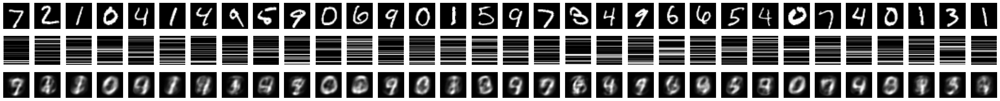

  1/938 [..............................] - ETA: 1:41 - loss: 0.0464

  2/938 [..............................] - ETA: 48s - loss: 0.0456 

  3/938 [..............................] - ETA: 48s - loss: 0.0467

  4/938 [..............................] - ETA: 51s - loss: 0.0466

  5/938 [..............................] - ETA: 51s - loss: 0.0465

  6/938 [..............................] - ETA: 51s - loss: 0.0462

  7/938 [..............................] - ETA: 51s - loss: 0.0458

  8/938 [..............................] - ETA: 50s - loss: 0.0458

  9/938 [..............................] - ETA: 50s - loss: 0.0460

 10/938 [..............................] - ETA: 50s - loss: 0.0462

 12/938 [..............................] - ETA: 49s - loss: 0.0465

 14/938 [..............................] - ETA: 48s - loss: 0.0470

 16/938 [..............................] - ETA: 46s - loss: 0.0468

 17/938 [..............................] - ETA: 46s - loss: 0.0468

 18/938 [..............................] - ETA: 46s - loss: 0.0467

 20/938 [..............................] - ETA: 46s - loss: 0.0471

 22/938 [..............................] - ETA: 45s - loss: 0.0475

 23/938 [..............................] - ETA: 45s - loss: 0.0475

 24/938 [..............................] - ETA: 46s - loss: 0.0475

 25/938 [..............................] - ETA: 46s - loss: 0.0474

 26/938 [..............................] - ETA: 46s - loss: 0.0473

 27/938 [..............................] - ETA: 46s - loss: 0.0473

 28/938 [..............................] - ETA: 46s - loss: 0.0472

 30/938 [..............................] - ETA: 46s - loss: 0.0473

 31/938 [..............................] - ETA: 46s - loss: 0.0472

 32/938 [>.............................] - ETA: 46s - loss: 0.0473

 33/938 [>.............................] - ETA: 46s - loss: 0.0472

 34/938 [>.............................] - ETA: 46s - loss: 0.0473

 35/938 [>.............................] - ETA: 46s - loss: 0.0473

 37/938 [>.............................] - ETA: 45s - loss: 0.0474

 39/938 [>.............................] - ETA: 45s - loss: 0.0473

 41/938 [>.............................] - ETA: 45s - loss: 0.0474

 43/938 [>.............................] - ETA: 45s - loss: 0.0475

 44/938 [>.............................] - ETA: 45s - loss: 0.0475

 45/938 [>.............................] - ETA: 45s - loss: 0.0477

 46/938 [>.............................] - ETA: 45s - loss: 0.0476

 47/938 [>.............................] - ETA: 45s - loss: 0.0476

 48/938 [>.............................] - ETA: 45s - loss: 0.0476

 50/938 [>.............................] - ETA: 45s - loss: 0.0476

 51/938 [>.............................] - ETA: 45s - loss: 0.0475

 52/938 [>.............................] - ETA: 45s - loss: 0.0474

 54/938 [>.............................] - ETA: 44s - loss: 0.0474

 56/938 [>.............................] - ETA: 43s - loss: 0.0474

 58/938 [>.............................] - ETA: 43s - loss: 0.0476

 60/938 [>.............................] - ETA: 42s - loss: 0.0475

 62/938 [>.............................] - ETA: 42s - loss: 0.0476

 64/938 [=>............................] - ETA: 42s - loss: 0.0475

 66/938 [=>............................] - ETA: 41s - loss: 0.0475

 68/938 [=>............................] - ETA: 41s - loss: 0.0475

 70/938 [=>............................] - ETA: 41s - loss: 0.0475

 72/938 [=>............................] - ETA: 40s - loss: 0.0475

 73/938 [=>............................] - ETA: 40s - loss: 0.0475

 74/938 [=>............................] - ETA: 41s - loss: 0.0476

 75/938 [=>............................] - ETA: 41s - loss: 0.0478

 76/938 [=>............................] - ETA: 41s - loss: 0.0479

 77/938 [=>............................] - ETA: 41s - loss: 0.0479

 79/938 [=>............................] - ETA: 41s - loss: 0.0480

 81/938 [=>............................] - ETA: 40s - loss: 0.0480

 83/938 [=>............................] - ETA: 40s - loss: 0.0480

 85/938 [=>............................] - ETA: 40s - loss: 0.0480

 87/938 [=>............................] - ETA: 40s - loss: 0.0480

 88/938 [=>............................] - ETA: 40s - loss: 0.0480

 90/938 [=>............................] - ETA: 40s - loss: 0.0480

 92/938 [=>............................] - ETA: 40s - loss: 0.0479

 94/938 [==>...........................] - ETA: 39s - loss: 0.0480

 96/938 [==>...........................] - ETA: 39s - loss: 0.0480

 97/938 [==>...........................] - ETA: 39s - loss: 0.0481

 99/938 [==>...........................] - ETA: 39s - loss: 0.0480

100/938 [==>...........................] - ETA: 39s - loss: 0.0480

101/938 [==>...........................] - ETA: 39s - loss: 0.0480

102/938 [==>...........................] - ETA: 39s - loss: 0.0480

104/938 [==>...........................] - ETA: 39s - loss: 0.0479

105/938 [==>...........................] - ETA: 39s - loss: 0.0479

106/938 [==>...........................] - ETA: 39s - loss: 0.0479

108/938 [==>...........................] - ETA: 39s - loss: 0.0478

110/938 [==>...........................] - ETA: 39s - loss: 0.0478

112/938 [==>...........................] - ETA: 39s - loss: 0.0478

114/938 [==>...........................] - ETA: 38s - loss: 0.0478

116/938 [==>...........................] - ETA: 38s - loss: 0.0477

118/938 [==>...........................] - ETA: 38s - loss: 0.0476

120/938 [==>...........................] - ETA: 38s - loss: 0.0476

122/938 [==>...........................] - ETA: 38s - loss: 0.0476

124/938 [==>...........................] - ETA: 37s - loss: 0.0477

126/938 [===>..........................] - ETA: 37s - loss: 0.0477

128/938 [===>..........................] - ETA: 37s - loss: 0.0477

130/938 [===>..........................] - ETA: 37s - loss: 0.0477

132/938 [===>..........................] - ETA: 37s - loss: 0.0477

134/938 [===>..........................] - ETA: 36s - loss: 0.0477

136/938 [===>..........................] - ETA: 36s - loss: 0.0478

138/938 [===>..........................] - ETA: 36s - loss: 0.0478

140/938 [===>..........................] - ETA: 36s - loss: 0.0477

142/938 [===>..........................] - ETA: 36s - loss: 0.0477

144/938 [===>..........................] - ETA: 35s - loss: 0.0477

146/938 [===>..........................] - ETA: 35s - loss: 0.0477

147/938 [===>..........................] - ETA: 35s - loss: 0.0477

149/938 [===>..........................] - ETA: 35s - loss: 0.0477

151/938 [===>..........................] - ETA: 35s - loss: 0.0478

153/938 [===>..........................] - ETA: 35s - loss: 0.0478

155/938 [===>..........................] - ETA: 35s - loss: 0.0478

157/938 [====>.........................] - ETA: 35s - loss: 0.0478

159/938 [====>.........................] - ETA: 34s - loss: 0.0478

161/938 [====>.........................] - ETA: 34s - loss: 0.0479

163/938 [====>.........................] - ETA: 34s - loss: 0.0479

165/938 [====>.........................] - ETA: 34s - loss: 0.0479

167/938 [====>.........................] - ETA: 34s - loss: 0.0479

169/938 [====>.........................] - ETA: 34s - loss: 0.0479

171/938 [====>.........................] - ETA: 33s - loss: 0.0479

173/938 [====>.........................] - ETA: 33s - loss: 0.0479

175/938 [====>.........................] - ETA: 33s - loss: 0.0479

177/938 [====>.........................] - ETA: 33s - loss: 0.0478

179/938 [====>.........................] - ETA: 33s - loss: 0.0478

181/938 [====>.........................] - ETA: 33s - loss: 0.0478

183/938 [====>.........................] - ETA: 33s - loss: 0.0478

185/938 [====>.........................] - ETA: 33s - loss: 0.0477

187/938 [====>.........................] - ETA: 33s - loss: 0.0477

189/938 [=====>........................] - ETA: 32s - loss: 0.0477

191/938 [=====>........................] - ETA: 32s - loss: 0.0477

193/938 [=====>........................] - ETA: 32s - loss: 0.0477

195/938 [=====>........................] - ETA: 32s - loss: 0.0477

197/938 [=====>........................] - ETA: 32s - loss: 0.0478

199/938 [=====>........................] - ETA: 32s - loss: 0.0478

201/938 [=====>........................] - ETA: 32s - loss: 0.0478

203/938 [=====>........................] - ETA: 32s - loss: 0.0478

205/938 [=====>........................] - ETA: 31s - loss: 0.0478

207/938 [=====>........................] - ETA: 31s - loss: 0.0479

209/938 [=====>........................] - ETA: 31s - loss: 0.0479

211/938 [=====>........................] - ETA: 31s - loss: 0.0479

213/938 [=====>........................] - ETA: 31s - loss: 0.0479

215/938 [=====>........................] - ETA: 31s - loss: 0.0479

217/938 [=====>........................] - ETA: 31s - loss: 0.0479

219/938 [======>.......................] - ETA: 31s - loss: 0.0479

221/938 [======>.......................] - ETA: 30s - loss: 0.0480

223/938 [======>.......................] - ETA: 30s - loss: 0.0480

225/938 [======>.......................] - ETA: 30s - loss: 0.0480

227/938 [======>.......................] - ETA: 30s - loss: 0.0480

229/938 [======>.......................] - ETA: 30s - loss: 0.0481

231/938 [======>.......................] - ETA: 30s - loss: 0.0481

233/938 [======>.......................] - ETA: 30s - loss: 0.0481

235/938 [======>.......................] - ETA: 30s - loss: 0.0481

237/938 [======>.......................] - ETA: 30s - loss: 0.0481

239/938 [======>.......................] - ETA: 29s - loss: 0.0481

241/938 [======>.......................] - ETA: 29s - loss: 0.0480

243/938 [======>.......................] - ETA: 29s - loss: 0.0480

245/938 [======>.......................] - ETA: 29s - loss: 0.0480

247/938 [======>.......................] - ETA: 29s - loss: 0.0480

249/938 [======>.......................] - ETA: 29s - loss: 0.0480

251/938 [=======>......................] - ETA: 29s - loss: 0.0480

253/938 [=======>......................] - ETA: 29s - loss: 0.0480

255/938 [=======>......................] - ETA: 28s - loss: 0.0480

257/938 [=======>......................] - ETA: 28s - loss: 0.0479

259/938 [=======>......................] - ETA: 28s - loss: 0.0479

261/938 [=======>......................] - ETA: 28s - loss: 0.0479

263/938 [=======>......................] - ETA: 28s - loss: 0.0479

265/938 [=======>......................] - ETA: 28s - loss: 0.0479

267/938 [=======>......................] - ETA: 28s - loss: 0.0479

269/938 [=======>......................] - ETA: 28s - loss: 0.0479

271/938 [=======>......................] - ETA: 28s - loss: 0.0479

273/938 [=======>......................] - ETA: 27s - loss: 0.0479

275/938 [=======>......................] - ETA: 27s - loss: 0.0479

277/938 [=======>......................] - ETA: 27s - loss: 0.0479

279/938 [=======>......................] - ETA: 27s - loss: 0.0479

281/938 [=======>......................] - ETA: 27s - loss: 0.0479

283/938 [========>.....................] - ETA: 27s - loss: 0.0479

285/938 [========>.....................] - ETA: 27s - loss: 0.0478

287/938 [========>.....................] - ETA: 27s - loss: 0.0478

289/938 [========>.....................] - ETA: 27s - loss: 0.0478

291/938 [========>.....................] - ETA: 27s - loss: 0.0478

292/938 [========>.....................] - ETA: 27s - loss: 0.0478

294/938 [========>.....................] - ETA: 27s - loss: 0.0478

296/938 [========>.....................] - ETA: 26s - loss: 0.0478

298/938 [========>.....................] - ETA: 26s - loss: 0.0478

300/938 [========>.....................] - ETA: 26s - loss: 0.0478

302/938 [========>.....................] - ETA: 26s - loss: 0.0478

304/938 [========>.....................] - ETA: 26s - loss: 0.0478

306/938 [========>.....................] - ETA: 26s - loss: 0.0478

308/938 [========>.....................] - ETA: 26s - loss: 0.0478

310/938 [========>.....................] - ETA: 26s - loss: 0.0478

311/938 [========>.....................] - ETA: 26s - loss: 0.0479

313/938 [=========>....................] - ETA: 26s - loss: 0.0479

315/938 [=========>....................] - ETA: 26s - loss: 0.0479

317/938 [=========>....................] - ETA: 25s - loss: 0.0479

319/938 [=========>....................] - ETA: 25s - loss: 0.0479

321/938 [=========>....................] - ETA: 25s - loss: 0.0479

323/938 [=========>....................] - ETA: 25s - loss: 0.0479

325/938 [=========>....................] - ETA: 25s - loss: 0.0479

327/938 [=========>....................] - ETA: 25s - loss: 0.0479

329/938 [=========>....................] - ETA: 25s - loss: 0.0479

331/938 [=========>....................] - ETA: 25s - loss: 0.0479

333/938 [=========>....................] - ETA: 25s - loss: 0.0479

335/938 [=========>....................] - ETA: 25s - loss: 0.0479

337/938 [=========>....................] - ETA: 25s - loss: 0.0479

339/938 [=========>....................] - ETA: 24s - loss: 0.0479

341/938 [=========>....................] - ETA: 24s - loss: 0.0479

343/938 [=========>....................] - ETA: 24s - loss: 0.0479

345/938 [==========>...................] - ETA: 24s - loss: 0.0479

347/938 [==========>...................] - ETA: 24s - loss: 0.0479

349/938 [==========>...................] - ETA: 24s - loss: 0.0479

351/938 [==========>...................] - ETA: 24s - loss: 0.0479

353/938 [==========>...................] - ETA: 24s - loss: 0.0479

355/938 [==========>...................] - ETA: 24s - loss: 0.0479

357/938 [==========>...................] - ETA: 24s - loss: 0.0479

359/938 [==========>...................] - ETA: 24s - loss: 0.0480

361/938 [==========>...................] - ETA: 23s - loss: 0.0480

363/938 [==========>...................] - ETA: 23s - loss: 0.0480

365/938 [==========>...................] - ETA: 23s - loss: 0.0480

367/938 [==========>...................] - ETA: 23s - loss: 0.0480

369/938 [==========>...................] - ETA: 23s - loss: 0.0480

371/938 [==========>...................] - ETA: 23s - loss: 0.0480

373/938 [==========>...................] - ETA: 23s - loss: 0.0480

374/938 [==========>...................] - ETA: 23s - loss: 0.0480

375/938 [==========>...................] - ETA: 23s - loss: 0.0480

376/938 [===========>..................] - ETA: 23s - loss: 0.0479

378/938 [===========>..................] - ETA: 23s - loss: 0.0479

380/938 [===========>..................] - ETA: 23s - loss: 0.0479

381/938 [===========>..................] - ETA: 23s - loss: 0.0479

382/938 [===========>..................] - ETA: 23s - loss: 0.0479

384/938 [===========>..................] - ETA: 23s - loss: 0.0479

386/938 [===========>..................] - ETA: 23s - loss: 0.0479

388/938 [===========>..................] - ETA: 22s - loss: 0.0479

390/938 [===========>..................] - ETA: 22s - loss: 0.0479

392/938 [===========>..................] - ETA: 22s - loss: 0.0479

394/938 [===========>..................] - ETA: 22s - loss: 0.0479

396/938 [===========>..................] - ETA: 22s - loss: 0.0479

398/938 [===========>..................] - ETA: 22s - loss: 0.0479

400/938 [===========>..................] - ETA: 22s - loss: 0.0479

402/938 [===========>..................] - ETA: 22s - loss: 0.0479

404/938 [===========>..................] - ETA: 22s - loss: 0.0478

406/938 [===========>..................] - ETA: 22s - loss: 0.0478

408/938 [============>.................] - ETA: 22s - loss: 0.0478

410/938 [============>.................] - ETA: 21s - loss: 0.0478

412/938 [============>.................] - ETA: 21s - loss: 0.0478

413/938 [============>.................] - ETA: 21s - loss: 0.0478

415/938 [============>.................] - ETA: 21s - loss: 0.0478

417/938 [============>.................] - ETA: 21s - loss: 0.0478

419/938 [============>.................] - ETA: 21s - loss: 0.0477

421/938 [============>.................] - ETA: 21s - loss: 0.0477

423/938 [============>.................] - ETA: 21s - loss: 0.0477

425/938 [============>.................] - ETA: 21s - loss: 0.0478

427/938 [============>.................] - ETA: 21s - loss: 0.0478

429/938 [============>.................] - ETA: 21s - loss: 0.0478

431/938 [============>.................] - ETA: 21s - loss: 0.0478

433/938 [============>.................] - ETA: 20s - loss: 0.0478

435/938 [============>.................] - ETA: 20s - loss: 0.0478

436/938 [============>.................] - ETA: 21s - loss: 0.0478

437/938 [============>.................] - ETA: 21s - loss: 0.0478

438/938 [=============>................] - ETA: 21s - loss: 0.0478

439/938 [=============>................] - ETA: 21s - loss: 0.0478

440/938 [=============>................] - ETA: 21s - loss: 0.0478

441/938 [=============>................] - ETA: 22s - loss: 0.0478

442/938 [=============>................] - ETA: 22s - loss: 0.0478

443/938 [=============>................] - ETA: 22s - loss: 0.0478

444/938 [=============>................] - ETA: 22s - loss: 0.0478

445/938 [=============>................] - ETA: 22s - loss: 0.0478

446/938 [=============>................] - ETA: 22s - loss: 0.0478

447/938 [=============>................] - ETA: 22s - loss: 0.0478

448/938 [=============>................] - ETA: 22s - loss: 0.0478

449/938 [=============>................] - ETA: 22s - loss: 0.0478

450/938 [=============>................] - ETA: 22s - loss: 0.0478

451/938 [=============>................] - ETA: 22s - loss: 0.0478

453/938 [=============>................] - ETA: 22s - loss: 0.0478

454/938 [=============>................] - ETA: 22s - loss: 0.0478

456/938 [=============>................] - ETA: 22s - loss: 0.0478

458/938 [=============>................] - ETA: 22s - loss: 0.0478

460/938 [=============>................] - ETA: 22s - loss: 0.0478

462/938 [=============>................] - ETA: 22s - loss: 0.0478

464/938 [=============>................] - ETA: 21s - loss: 0.0478

466/938 [=============>................] - ETA: 21s - loss: 0.0477

468/938 [=============>................] - ETA: 21s - loss: 0.0477

469/938 [==============>...............] - ETA: 21s - loss: 0.0477

471/938 [==============>...............] - ETA: 21s - loss: 0.0477

473/938 [==============>...............] - ETA: 21s - loss: 0.0477

475/938 [==============>...............] - ETA: 21s - loss: 0.0477

477/938 [==============>...............] - ETA: 21s - loss: 0.0477

479/938 [==============>...............] - ETA: 21s - loss: 0.0477

481/938 [==============>...............] - ETA: 21s - loss: 0.0477

482/938 [==============>...............] - ETA: 20s - loss: 0.0477

484/938 [==============>...............] - ETA: 20s - loss: 0.0477

486/938 [==============>...............] - ETA: 20s - loss: 0.0477

487/938 [==============>...............] - ETA: 20s - loss: 0.0477

489/938 [==============>...............] - ETA: 20s - loss: 0.0476

491/938 [==============>...............] - ETA: 20s - loss: 0.0476

493/938 [==============>...............] - ETA: 20s - loss: 0.0476

495/938 [==============>...............] - ETA: 20s - loss: 0.0476

497/938 [==============>...............] - ETA: 20s - loss: 0.0476

499/938 [==============>...............] - ETA: 20s - loss: 0.0476

500/938 [==============>...............] - ETA: 20s - loss: 0.0476

502/938 [===============>..............] - ETA: 19s - loss: 0.0476

503/938 [===============>..............] - ETA: 19s - loss: 0.0476

505/938 [===============>..............] - ETA: 19s - loss: 0.0476

507/938 [===============>..............] - ETA: 19s - loss: 0.0476

509/938 [===============>..............] - ETA: 19s - loss: 0.0476

510/938 [===============>..............] - ETA: 19s - loss: 0.0476

511/938 [===============>..............] - ETA: 19s - loss: 0.0476

512/938 [===============>..............] - ETA: 19s - loss: 0.0476

513/938 [===============>..............] - ETA: 19s - loss: 0.0476

515/938 [===============>..............] - ETA: 19s - loss: 0.0476

517/938 [===============>..............] - ETA: 19s - loss: 0.0476

519/938 [===============>..............] - ETA: 19s - loss: 0.0476

521/938 [===============>..............] - ETA: 19s - loss: 0.0476

523/938 [===============>..............] - ETA: 19s - loss: 0.0476

525/938 [===============>..............] - ETA: 18s - loss: 0.0476

527/938 [===============>..............] - ETA: 18s - loss: 0.0476

529/938 [===============>..............] - ETA: 18s - loss: 0.0476

531/938 [===============>..............] - ETA: 18s - loss: 0.0476

533/938 [================>.............] - ETA: 18s - loss: 0.0475

535/938 [================>.............] - ETA: 18s - loss: 0.0475

537/938 [================>.............] - ETA: 18s - loss: 0.0475

539/938 [================>.............] - ETA: 18s - loss: 0.0475

540/938 [================>.............] - ETA: 18s - loss: 0.0475

542/938 [================>.............] - ETA: 18s - loss: 0.0475

544/938 [================>.............] - ETA: 17s - loss: 0.0475

546/938 [================>.............] - ETA: 17s - loss: 0.0475

548/938 [================>.............] - ETA: 17s - loss: 0.0475

550/938 [================>.............] - ETA: 17s - loss: 0.0475

552/938 [================>.............] - ETA: 17s - loss: 0.0475

554/938 [================>.............] - ETA: 17s - loss: 0.0475

556/938 [================>.............] - ETA: 17s - loss: 0.0475

558/938 [================>.............] - ETA: 17s - loss: 0.0475

560/938 [================>.............] - ETA: 17s - loss: 0.0475

562/938 [================>.............] - ETA: 17s - loss: 0.0475

564/938 [=================>............] - ETA: 16s - loss: 0.0475

566/938 [=================>............] - ETA: 16s - loss: 0.0475

568/938 [=================>............] - ETA: 16s - loss: 0.0475

570/938 [=================>............] - ETA: 16s - loss: 0.0475

572/938 [=================>............] - ETA: 16s - loss: 0.0475

574/938 [=================>............] - ETA: 16s - loss: 0.0475

576/938 [=================>............] - ETA: 16s - loss: 0.0475

578/938 [=================>............] - ETA: 16s - loss: 0.0475

580/938 [=================>............] - ETA: 16s - loss: 0.0475

582/938 [=================>............] - ETA: 16s - loss: 0.0475

584/938 [=================>............] - ETA: 15s - loss: 0.0475

586/938 [=================>............] - ETA: 15s - loss: 0.0475

588/938 [=================>............] - ETA: 15s - loss: 0.0475

590/938 [=================>............] - ETA: 15s - loss: 0.0475

592/938 [=================>............] - ETA: 15s - loss: 0.0475

594/938 [=================>............] - ETA: 15s - loss: 0.0475

596/938 [==================>...........] - ETA: 15s - loss: 0.0475

598/938 [==================>...........] - ETA: 15s - loss: 0.0475

600/938 [==================>...........] - ETA: 15s - loss: 0.0475

602/938 [==================>...........] - ETA: 15s - loss: 0.0475

604/938 [==================>...........] - ETA: 14s - loss: 0.0475

606/938 [==================>...........] - ETA: 14s - loss: 0.0475

608/938 [==================>...........] - ETA: 14s - loss: 0.0475

610/938 [==================>...........] - ETA: 14s - loss: 0.0475

612/938 [==================>...........] - ETA: 14s - loss: 0.0475

614/938 [==================>...........] - ETA: 14s - loss: 0.0475

616/938 [==================>...........] - ETA: 14s - loss: 0.0475

618/938 [==================>...........] - ETA: 14s - loss: 0.0475

620/938 [==================>...........] - ETA: 14s - loss: 0.0475

621/938 [==================>...........] - ETA: 14s - loss: 0.0475

623/938 [==================>...........] - ETA: 14s - loss: 0.0475

625/938 [==================>...........] - ETA: 14s - loss: 0.0475

627/938 [===================>..........] - ETA: 13s - loss: 0.0475

629/938 [===================>..........] - ETA: 13s - loss: 0.0475

631/938 [===================>..........] - ETA: 13s - loss: 0.0474

633/938 [===================>..........] - ETA: 13s - loss: 0.0475

635/938 [===================>..........] - ETA: 13s - loss: 0.0475

637/938 [===================>..........] - ETA: 13s - loss: 0.0475

639/938 [===================>..........] - ETA: 13s - loss: 0.0474

641/938 [===================>..........] - ETA: 13s - loss: 0.0474

643/938 [===================>..........] - ETA: 13s - loss: 0.0474

645/938 [===================>..........] - ETA: 13s - loss: 0.0474

647/938 [===================>..........] - ETA: 12s - loss: 0.0474

649/938 [===================>..........] - ETA: 12s - loss: 0.0474

651/938 [===================>..........] - ETA: 12s - loss: 0.0474

653/938 [===================>..........] - ETA: 12s - loss: 0.0474

655/938 [===================>..........] - ETA: 12s - loss: 0.0474

657/938 [====================>.........] - ETA: 12s - loss: 0.0474

659/938 [====================>.........] - ETA: 12s - loss: 0.0474

661/938 [====================>.........] - ETA: 12s - loss: 0.0474

663/938 [====================>.........] - ETA: 12s - loss: 0.0474

665/938 [====================>.........] - ETA: 12s - loss: 0.0474

667/938 [====================>.........] - ETA: 12s - loss: 0.0474

669/938 [====================>.........] - ETA: 11s - loss: 0.0474

671/938 [====================>.........] - ETA: 11s - loss: 0.0474

673/938 [====================>.........] - ETA: 11s - loss: 0.0474

675/938 [====================>.........] - ETA: 11s - loss: 0.0474

677/938 [====================>.........] - ETA: 11s - loss: 0.0474

679/938 [====================>.........] - ETA: 11s - loss: 0.0474

681/938 [====================>.........] - ETA: 11s - loss: 0.0474

683/938 [====================>.........] - ETA: 11s - loss: 0.0474

685/938 [====================>.........] - ETA: 11s - loss: 0.0474

687/938 [====================>.........] - ETA: 11s - loss: 0.0474

689/938 [=====================>........] - ETA: 11s - loss: 0.0474

691/938 [=====================>........] - ETA: 10s - loss: 0.0474

693/938 [=====================>........] - ETA: 10s - loss: 0.0474

695/938 [=====================>........] - ETA: 10s - loss: 0.0474

697/938 [=====================>........] - ETA: 10s - loss: 0.0473

699/938 [=====================>........] - ETA: 10s - loss: 0.0473

701/938 [=====================>........] - ETA: 10s - loss: 0.0473

703/938 [=====================>........] - ETA: 10s - loss: 0.0473

705/938 [=====================>........] - ETA: 10s - loss: 0.0473

707/938 [=====================>........] - ETA: 10s - loss: 0.0473

709/938 [=====================>........] - ETA: 10s - loss: 0.0473

711/938 [=====================>........] - ETA: 10s - loss: 0.0473

713/938 [=====================>........] - ETA: 9s - loss: 0.0473 

714/938 [=====================>........] - ETA: 9s - loss: 0.0473

716/938 [=====================>........] - ETA: 9s - loss: 0.0473

718/938 [=====================>........] - ETA: 9s - loss: 0.0473

720/938 [======================>.......] - ETA: 9s - loss: 0.0473

722/938 [======================>.......] - ETA: 9s - loss: 0.0473

724/938 [======================>.......] - ETA: 9s - loss: 0.0473

726/938 [======================>.......] - ETA: 9s - loss: 0.0473

728/938 [======================>.......] - ETA: 9s - loss: 0.0473

730/938 [======================>.......] - ETA: 9s - loss: 0.0473

732/938 [======================>.......] - ETA: 9s - loss: 0.0473

734/938 [======================>.......] - ETA: 8s - loss: 0.0473

736/938 [======================>.......] - ETA: 8s - loss: 0.0473

738/938 [======================>.......] - ETA: 8s - loss: 0.0473

740/938 [======================>.......] - ETA: 8s - loss: 0.0473

742/938 [======================>.......] - ETA: 8s - loss: 0.0473

744/938 [======================>.......] - ETA: 8s - loss: 0.0473

746/938 [======================>.......] - ETA: 8s - loss: 0.0473

748/938 [======================>.......] - ETA: 8s - loss: 0.0473

750/938 [======================>.......] - ETA: 8s - loss: 0.0473

752/938 [=======================>......] - ETA: 8s - loss: 0.0473

754/938 [=======================>......] - ETA: 8s - loss: 0.0473

756/938 [=======================>......] - ETA: 7s - loss: 0.0473

758/938 [=======================>......] - ETA: 7s - loss: 0.0473

760/938 [=======================>......] - ETA: 7s - loss: 0.0473

762/938 [=======================>......] - ETA: 7s - loss: 0.0473

764/938 [=======================>......] - ETA: 7s - loss: 0.0473

766/938 [=======================>......] - ETA: 7s - loss: 0.0473

768/938 [=======================>......] - ETA: 7s - loss: 0.0473

770/938 [=======================>......] - ETA: 7s - loss: 0.0473

772/938 [=======================>......] - ETA: 7s - loss: 0.0473

774/938 [=======================>......] - ETA: 7s - loss: 0.0473

776/938 [=======================>......] - ETA: 7s - loss: 0.0473

778/938 [=======================>......] - ETA: 6s - loss: 0.0473

780/938 [=======================>......] - ETA: 6s - loss: 0.0473

781/938 [=======================>......] - ETA: 6s - loss: 0.0473

783/938 [========================>.....] - ETA: 6s - loss: 0.0473

785/938 [========================>.....] - ETA: 6s - loss: 0.0473

787/938 [========================>.....] - ETA: 6s - loss: 0.0473

788/938 [========================>.....] - ETA: 6s - loss: 0.0473

789/938 [========================>.....] - ETA: 6s - loss: 0.0473

791/938 [========================>.....] - ETA: 6s - loss: 0.0473

793/938 [========================>.....] - ETA: 6s - loss: 0.0473

795/938 [========================>.....] - ETA: 6s - loss: 0.0473

797/938 [========================>.....] - ETA: 6s - loss: 0.0472

798/938 [========================>.....] - ETA: 6s - loss: 0.0472

799/938 [========================>.....] - ETA: 6s - loss: 0.0472

800/938 [========================>.....] - ETA: 6s - loss: 0.0472

801/938 [========================>.....] - ETA: 6s - loss: 0.0472

802/938 [========================>.....] - ETA: 5s - loss: 0.0472

804/938 [========================>.....] - ETA: 5s - loss: 0.0472

806/938 [========================>.....] - ETA: 5s - loss: 0.0472

808/938 [========================>.....] - ETA: 5s - loss: 0.0472

810/938 [========================>.....] - ETA: 5s - loss: 0.0472

812/938 [========================>.....] - ETA: 5s - loss: 0.0472

814/938 [=========================>....] - ETA: 5s - loss: 0.0472

816/938 [=========================>....] - ETA: 5s - loss: 0.0472

818/938 [=========================>....] - ETA: 5s - loss: 0.0472

820/938 [=========================>....] - ETA: 5s - loss: 0.0472

822/938 [=========================>....] - ETA: 5s - loss: 0.0472

824/938 [=========================>....] - ETA: 5s - loss: 0.0472

825/938 [=========================>....] - ETA: 4s - loss: 0.0472

827/938 [=========================>....] - ETA: 4s - loss: 0.0472

829/938 [=========================>....] - ETA: 4s - loss: 0.0472

831/938 [=========================>....] - ETA: 4s - loss: 0.0472

833/938 [=========================>....] - ETA: 4s - loss: 0.0472

835/938 [=========================>....] - ETA: 4s - loss: 0.0472

837/938 [=========================>....] - ETA: 4s - loss: 0.0472

839/938 [=========================>....] - ETA: 4s - loss: 0.0471

840/938 [=========================>....] - ETA: 4s - loss: 0.0471

841/938 [=========================>....] - ETA: 4s - loss: 0.0471

842/938 [=========================>....] - ETA: 4s - loss: 0.0471

843/938 [=========================>....] - ETA: 4s - loss: 0.0471

844/938 [=========================>....] - ETA: 4s - loss: 0.0471

845/938 [==========================>...] - ETA: 4s - loss: 0.0471

847/938 [==========================>...] - ETA: 3s - loss: 0.0471

848/938 [==========================>...] - ETA: 3s - loss: 0.0471

850/938 [==========================>...] - ETA: 3s - loss: 0.0471

852/938 [==========================>...] - ETA: 3s - loss: 0.0471

853/938 [==========================>...] - ETA: 3s - loss: 0.0471

855/938 [==========================>...] - ETA: 3s - loss: 0.0471

856/938 [==========================>...] - ETA: 3s - loss: 0.0471

857/938 [==========================>...] - ETA: 3s - loss: 0.0471

859/938 [==========================>...] - ETA: 3s - loss: 0.0471

861/938 [==========================>...] - ETA: 3s - loss: 0.0471

863/938 [==========================>...] - ETA: 3s - loss: 0.0471

864/938 [==========================>...] - ETA: 3s - loss: 0.0471

865/938 [==========================>...] - ETA: 3s - loss: 0.0471

866/938 [==========================>...] - ETA: 3s - loss: 0.0471

867/938 [==========================>...] - ETA: 3s - loss: 0.0471

868/938 [==========================>...] - ETA: 3s - loss: 0.0471

869/938 [==========================>...] - ETA: 3s - loss: 0.0471

870/938 [==========================>...] - ETA: 2s - loss: 0.0471

871/938 [==========================>...] - ETA: 2s - loss: 0.0471

872/938 [==========================>...] - ETA: 2s - loss: 0.0471

873/938 [==========================>...] - ETA: 2s - loss: 0.0471

874/938 [==========================>...] - ETA: 2s - loss: 0.0471

876/938 [===========================>..] - ETA: 2s - loss: 0.0471

878/938 [===========================>..] - ETA: 2s - loss: 0.0471

880/938 [===========================>..] - ETA: 2s - loss: 0.0471

882/938 [===========================>..] - ETA: 2s - loss: 0.0471

883/938 [===========================>..] - ETA: 2s - loss: 0.0471

885/938 [===========================>..] - ETA: 2s - loss: 0.0471

887/938 [===========================>..] - ETA: 2s - loss: 0.0471

889/938 [===========================>..] - ETA: 2s - loss: 0.0471

891/938 [===========================>..] - ETA: 2s - loss: 0.0471

893/938 [===========================>..] - ETA: 1s - loss: 0.0470

895/938 [===========================>..] - ETA: 1s - loss: 0.0470

897/938 [===========================>..] - ETA: 1s - loss: 0.0470

898/938 [===========================>..] - ETA: 1s - loss: 0.0470

900/938 [===========================>..] - ETA: 1s - loss: 0.0470

902/938 [===========================>..] - ETA: 1s - loss: 0.0470

904/938 [===========================>..] - ETA: 1s - loss: 0.0470

906/938 [===========================>..] - ETA: 1s - loss: 0.0470

908/938 [============================>.] - ETA: 1s - loss: 0.0470

910/938 [============================>.] - ETA: 1s - loss: 0.0470

912/938 [============================>.] - ETA: 1s - loss: 0.0470

914/938 [============================>.] - ETA: 1s - loss: 0.0470

916/938 [============================>.] - ETA: 0s - loss: 0.0470

918/938 [============================>.] - ETA: 0s - loss: 0.0470

920/938 [============================>.] - ETA: 0s - loss: 0.0470

922/938 [============================>.] - ETA: 0s - loss: 0.0470

924/938 [============================>.] - ETA: 0s - loss: 0.0469

926/938 [============================>.] - ETA: 0s - loss: 0.0469

927/938 [============================>.] - ETA: 0s - loss: 0.0470

929/938 [============================>.] - ETA: 0s - loss: 0.0470

931/938 [============================>.] - ETA: 0s - loss: 0.0470

933/938 [============================>.] - ETA: 0s - loss: 0.0470

935/938 [============================>.] - ETA: 0s - loss: 0.0470

937/938 [============================>.] - ETA: 0s - loss: 0.0470

938/938 [==============================] - 46s 49ms/step - loss: 0.0470 - val_loss: 0.0458
batch_vals = tf.Tensor(
[[  0   0  99  63  13   0   0   0  91   0   0   0   0   0  62   0  67   1
    0   0  81   0   0 127   0   0   0 127  93   0  55   1]
 [  0   0  36 100 127 127   0  34   0   0  23  38   0  50  14  93   0  35
    0   0   0   0   0 127   0   0   0 115 127   0  58   0]
 [  0   0  37   0   0  86   0  27   0  56   0   0  27  92 127 127  76  47
    0   0   0   0 127 127   0   0   0 125 127  11 127   0]
 [  0   0  75   0  32  21   0   0   0   0   0   8   0   0 126   0  63  82
  121   0 127   0  16  83   0   0   0 127  13 127  65   0]
 [ 20   0 127   0   0   0   0  23   0   0   0   0  63   0 127   0  50  64
    0   0   4   0  13 104   0  59   0 127  11 127  83   0]
 [  0   0   0 127   0  26 127   0   0   0   0  62  54   0 109  85  16 127
    0   0 127   0   0 127   0   0   0 127  91   0  74   0]
 [  0   0 127   0  47  40   0   0   0   0   0   0  41  21  72   0   0   0
    0   0  29

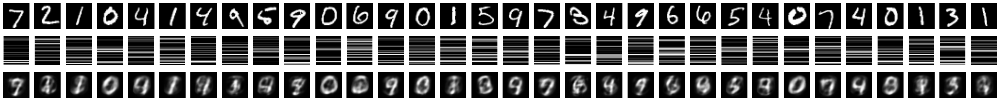

  1/938 [..............................] - ETA: 1:06 - loss: 0.0438

  3/938 [..............................] - ETA: 35s - loss: 0.0434 

  5/938 [..............................] - ETA: 35s - loss: 0.0432

  7/938 [..............................] - ETA: 35s - loss: 0.0433

  9/938 [..............................] - ETA: 35s - loss: 0.0438

 11/938 [..............................] - ETA: 35s - loss: 0.0440

 13/938 [..............................] - ETA: 35s - loss: 0.0443

 14/938 [..............................] - ETA: 36s - loss: 0.0443

 16/938 [..............................] - ETA: 37s - loss: 0.0442

 18/938 [..............................] - ETA: 37s - loss: 0.0444

 20/938 [..............................] - ETA: 37s - loss: 0.0447

 22/938 [..............................] - ETA: 37s - loss: 0.0450

 24/938 [..............................] - ETA: 37s - loss: 0.0452

 26/938 [..............................] - ETA: 37s - loss: 0.0451

 28/938 [..............................] - ETA: 37s - loss: 0.0449

 30/938 [..............................] - ETA: 36s - loss: 0.0448

 32/938 [>.............................] - ETA: 36s - loss: 0.0449

 34/938 [>.............................] - ETA: 36s - loss: 0.0449

 36/938 [>.............................] - ETA: 36s - loss: 0.0450

 38/938 [>.............................] - ETA: 36s - loss: 0.0449

 40/938 [>.............................] - ETA: 36s - loss: 0.0449

 42/938 [>.............................] - ETA: 36s - loss: 0.0450

 44/938 [>.............................] - ETA: 35s - loss: 0.0452

 46/938 [>.............................] - ETA: 35s - loss: 0.0452

 48/938 [>.............................] - ETA: 35s - loss: 0.0452

 50/938 [>.............................] - ETA: 35s - loss: 0.0452

 52/938 [>.............................] - ETA: 35s - loss: 0.0451

 54/938 [>.............................] - ETA: 35s - loss: 0.0450

 56/938 [>.............................] - ETA: 35s - loss: 0.0450

 58/938 [>.............................] - ETA: 35s - loss: 0.0452

 60/938 [>.............................] - ETA: 35s - loss: 0.0452

 62/938 [>.............................] - ETA: 35s - loss: 0.0452

 64/938 [=>............................] - ETA: 34s - loss: 0.0451

 66/938 [=>............................] - ETA: 35s - loss: 0.0451

 68/938 [=>............................] - ETA: 34s - loss: 0.0451

 70/938 [=>............................] - ETA: 34s - loss: 0.0451

 72/938 [=>............................] - ETA: 34s - loss: 0.0451

 74/938 [=>............................] - ETA: 34s - loss: 0.0453

 76/938 [=>............................] - ETA: 34s - loss: 0.0455

 78/938 [=>............................] - ETA: 34s - loss: 0.0455

 80/938 [=>............................] - ETA: 34s - loss: 0.0455

 82/938 [=>............................] - ETA: 34s - loss: 0.0455

 84/938 [=>............................] - ETA: 34s - loss: 0.0456

 86/938 [=>............................] - ETA: 34s - loss: 0.0456

 88/938 [=>............................] - ETA: 33s - loss: 0.0456

 90/938 [=>............................] - ETA: 33s - loss: 0.0456

 92/938 [=>............................] - ETA: 33s - loss: 0.0455

 94/938 [==>...........................] - ETA: 33s - loss: 0.0456

 96/938 [==>...........................] - ETA: 33s - loss: 0.0456

 98/938 [==>...........................] - ETA: 33s - loss: 0.0456

100/938 [==>...........................] - ETA: 33s - loss: 0.0456

102/938 [==>...........................] - ETA: 33s - loss: 0.0456

104/938 [==>...........................] - ETA: 33s - loss: 0.0455

106/938 [==>...........................] - ETA: 33s - loss: 0.0455

108/938 [==>...........................] - ETA: 33s - loss: 0.0454

110/938 [==>...........................] - ETA: 32s - loss: 0.0454

112/938 [==>...........................] - ETA: 32s - loss: 0.0454

114/938 [==>...........................] - ETA: 32s - loss: 0.0453

116/938 [==>...........................] - ETA: 32s - loss: 0.0453

118/938 [==>...........................] - ETA: 32s - loss: 0.0453

120/938 [==>...........................] - ETA: 32s - loss: 0.0452

122/938 [==>...........................] - ETA: 32s - loss: 0.0452

124/938 [==>...........................] - ETA: 32s - loss: 0.0453

126/938 [===>..........................] - ETA: 32s - loss: 0.0453

128/938 [===>..........................] - ETA: 32s - loss: 0.0453

130/938 [===>..........................] - ETA: 32s - loss: 0.0453

132/938 [===>..........................] - ETA: 31s - loss: 0.0453

134/938 [===>..........................] - ETA: 31s - loss: 0.0453

135/938 [===>..........................] - ETA: 31s - loss: 0.0454

137/938 [===>..........................] - ETA: 31s - loss: 0.0454

139/938 [===>..........................] - ETA: 31s - loss: 0.0454

141/938 [===>..........................] - ETA: 31s - loss: 0.0454

143/938 [===>..........................] - ETA: 31s - loss: 0.0453

145/938 [===>..........................] - ETA: 31s - loss: 0.0453

147/938 [===>..........................] - ETA: 31s - loss: 0.0453

149/938 [===>..........................] - ETA: 31s - loss: 0.0454

151/938 [===>..........................] - ETA: 31s - loss: 0.0454

153/938 [===>..........................] - ETA: 31s - loss: 0.0454

155/938 [===>..........................] - ETA: 30s - loss: 0.0454

157/938 [====>.........................] - ETA: 30s - loss: 0.0454

159/938 [====>.........................] - ETA: 30s - loss: 0.0454

161/938 [====>.........................] - ETA: 30s - loss: 0.0455

163/938 [====>.........................] - ETA: 30s - loss: 0.0455

165/938 [====>.........................] - ETA: 30s - loss: 0.0455

167/938 [====>.........................] - ETA: 30s - loss: 0.0455

169/938 [====>.........................] - ETA: 30s - loss: 0.0455

171/938 [====>.........................] - ETA: 30s - loss: 0.0455

173/938 [====>.........................] - ETA: 30s - loss: 0.0455

175/938 [====>.........................] - ETA: 30s - loss: 0.0455

177/938 [====>.........................] - ETA: 30s - loss: 0.0455

179/938 [====>.........................] - ETA: 29s - loss: 0.0454

181/938 [====>.........................] - ETA: 29s - loss: 0.0454

183/938 [====>.........................] - ETA: 29s - loss: 0.0454

185/938 [====>.........................] - ETA: 29s - loss: 0.0454

187/938 [====>.........................] - ETA: 29s - loss: 0.0454

189/938 [=====>........................] - ETA: 29s - loss: 0.0453

190/938 [=====>........................] - ETA: 29s - loss: 0.0453

192/938 [=====>........................] - ETA: 29s - loss: 0.0454

194/938 [=====>........................] - ETA: 29s - loss: 0.0454

195/938 [=====>........................] - ETA: 29s - loss: 0.0454

196/938 [=====>........................] - ETA: 29s - loss: 0.0454

198/938 [=====>........................] - ETA: 29s - loss: 0.0454

199/938 [=====>........................] - ETA: 29s - loss: 0.0454

200/938 [=====>........................] - ETA: 29s - loss: 0.0454

202/938 [=====>........................] - ETA: 29s - loss: 0.0455

204/938 [=====>........................] - ETA: 29s - loss: 0.0455

206/938 [=====>........................] - ETA: 29s - loss: 0.0455

208/938 [=====>........................] - ETA: 29s - loss: 0.0456

210/938 [=====>........................] - ETA: 28s - loss: 0.0456

212/938 [=====>........................] - ETA: 28s - loss: 0.0456

214/938 [=====>........................] - ETA: 28s - loss: 0.0456

216/938 [=====>........................] - ETA: 28s - loss: 0.0456

218/938 [=====>........................] - ETA: 28s - loss: 0.0456

220/938 [======>.......................] - ETA: 28s - loss: 0.0456

222/938 [======>.......................] - ETA: 28s - loss: 0.0457

224/938 [======>.......................] - ETA: 28s - loss: 0.0457

226/938 [======>.......................] - ETA: 28s - loss: 0.0457

228/938 [======>.......................] - ETA: 28s - loss: 0.0457

230/938 [======>.......................] - ETA: 28s - loss: 0.0457

232/938 [======>.......................] - ETA: 28s - loss: 0.0458

234/938 [======>.......................] - ETA: 27s - loss: 0.0458

236/938 [======>.......................] - ETA: 27s - loss: 0.0458

238/938 [======>.......................] - ETA: 27s - loss: 0.0458

240/938 [======>.......................] - ETA: 27s - loss: 0.0457

242/938 [======>.......................] - ETA: 27s - loss: 0.0457

244/938 [======>.......................] - ETA: 27s - loss: 0.0457

246/938 [======>.......................] - ETA: 27s - loss: 0.0457

248/938 [======>.......................] - ETA: 27s - loss: 0.0457

250/938 [======>.......................] - ETA: 27s - loss: 0.0457

252/938 [=======>......................] - ETA: 27s - loss: 0.0457

254/938 [=======>......................] - ETA: 27s - loss: 0.0457

256/938 [=======>......................] - ETA: 27s - loss: 0.0456

258/938 [=======>......................] - ETA: 26s - loss: 0.0456

260/938 [=======>......................] - ETA: 26s - loss: 0.0456

262/938 [=======>......................] - ETA: 26s - loss: 0.0456

264/938 [=======>......................] - ETA: 26s - loss: 0.0456

266/938 [=======>......................] - ETA: 26s - loss: 0.0456

267/938 [=======>......................] - ETA: 26s - loss: 0.0456

268/938 [=======>......................] - ETA: 26s - loss: 0.0456

269/938 [=======>......................] - ETA: 26s - loss: 0.0456

270/938 [=======>......................] - ETA: 26s - loss: 0.0457

271/938 [=======>......................] - ETA: 26s - loss: 0.0457

273/938 [=======>......................] - ETA: 26s - loss: 0.0457

275/938 [=======>......................] - ETA: 26s - loss: 0.0457

277/938 [=======>......................] - ETA: 26s - loss: 0.0457

279/938 [=======>......................] - ETA: 26s - loss: 0.0456

280/938 [=======>......................] - ETA: 26s - loss: 0.0456

282/938 [========>.....................] - ETA: 26s - loss: 0.0456

284/938 [========>.....................] - ETA: 26s - loss: 0.0456

286/938 [========>.....................] - ETA: 26s - loss: 0.0455

287/938 [========>.....................] - ETA: 26s - loss: 0.0455

289/938 [========>.....................] - ETA: 26s - loss: 0.0455

291/938 [========>.....................] - ETA: 26s - loss: 0.0455

293/938 [========>.....................] - ETA: 26s - loss: 0.0455

295/938 [========>.....................] - ETA: 25s - loss: 0.0455

297/938 [========>.....................] - ETA: 25s - loss: 0.0455

298/938 [========>.....................] - ETA: 25s - loss: 0.0455

300/938 [========>.....................] - ETA: 25s - loss: 0.0455

301/938 [========>.....................] - ETA: 25s - loss: 0.0455

302/938 [========>.....................] - ETA: 25s - loss: 0.0455

304/938 [========>.....................] - ETA: 25s - loss: 0.0456

305/938 [========>.....................] - ETA: 25s - loss: 0.0455

307/938 [========>.....................] - ETA: 25s - loss: 0.0455

309/938 [========>.....................] - ETA: 25s - loss: 0.0456

311/938 [========>.....................] - ETA: 25s - loss: 0.0456

313/938 [=========>....................] - ETA: 25s - loss: 0.0456

315/938 [=========>....................] - ETA: 25s - loss: 0.0457

317/938 [=========>....................] - ETA: 25s - loss: 0.0457

318/938 [=========>....................] - ETA: 25s - loss: 0.0457

319/938 [=========>....................] - ETA: 25s - loss: 0.0457

320/938 [=========>....................] - ETA: 25s - loss: 0.0457

321/938 [=========>....................] - ETA: 25s - loss: 0.0457

322/938 [=========>....................] - ETA: 25s - loss: 0.0457

324/938 [=========>....................] - ETA: 25s - loss: 0.0456

326/938 [=========>....................] - ETA: 24s - loss: 0.0456

328/938 [=========>....................] - ETA: 24s - loss: 0.0456

330/938 [=========>....................] - ETA: 24s - loss: 0.0456

332/938 [=========>....................] - ETA: 24s - loss: 0.0456

333/938 [=========>....................] - ETA: 24s - loss: 0.0456

335/938 [=========>....................] - ETA: 24s - loss: 0.0456

336/938 [=========>....................] - ETA: 24s - loss: 0.0456

337/938 [=========>....................] - ETA: 24s - loss: 0.0456

338/938 [=========>....................] - ETA: 24s - loss: 0.0456

340/938 [=========>....................] - ETA: 24s - loss: 0.0456

342/938 [=========>....................] - ETA: 24s - loss: 0.0456

343/938 [=========>....................] - ETA: 24s - loss: 0.0456

345/938 [==========>...................] - ETA: 24s - loss: 0.0457

346/938 [==========>...................] - ETA: 24s - loss: 0.0457

347/938 [==========>...................] - ETA: 24s - loss: 0.0457

348/938 [==========>...................] - ETA: 24s - loss: 0.0457

349/938 [==========>...................] - ETA: 24s - loss: 0.0457

351/938 [==========>...................] - ETA: 24s - loss: 0.0457

353/938 [==========>...................] - ETA: 24s - loss: 0.0457

355/938 [==========>...................] - ETA: 24s - loss: 0.0457

357/938 [==========>...................] - ETA: 23s - loss: 0.0457

359/938 [==========>...................] - ETA: 23s - loss: 0.0457

361/938 [==========>...................] - ETA: 23s - loss: 0.0457

363/938 [==========>...................] - ETA: 23s - loss: 0.0457

365/938 [==========>...................] - ETA: 23s - loss: 0.0457

367/938 [==========>...................] - ETA: 23s - loss: 0.0457

369/938 [==========>...................] - ETA: 23s - loss: 0.0457

371/938 [==========>...................] - ETA: 23s - loss: 0.0457

373/938 [==========>...................] - ETA: 23s - loss: 0.0457

375/938 [==========>...................] - ETA: 23s - loss: 0.0457

377/938 [===========>..................] - ETA: 23s - loss: 0.0457

379/938 [===========>..................] - ETA: 23s - loss: 0.0457

381/938 [===========>..................] - ETA: 22s - loss: 0.0457

383/938 [===========>..................] - ETA: 22s - loss: 0.0457

385/938 [===========>..................] - ETA: 22s - loss: 0.0457

387/938 [===========>..................] - ETA: 22s - loss: 0.0457

389/938 [===========>..................] - ETA: 22s - loss: 0.0456

391/938 [===========>..................] - ETA: 22s - loss: 0.0456

393/938 [===========>..................] - ETA: 22s - loss: 0.0456

395/938 [===========>..................] - ETA: 22s - loss: 0.0456

397/938 [===========>..................] - ETA: 22s - loss: 0.0456

399/938 [===========>..................] - ETA: 22s - loss: 0.0456

401/938 [===========>..................] - ETA: 22s - loss: 0.0456

402/938 [===========>..................] - ETA: 22s - loss: 0.0456

404/938 [===========>..................] - ETA: 21s - loss: 0.0456

406/938 [===========>..................] - ETA: 21s - loss: 0.0456

407/938 [============>.................] - ETA: 21s - loss: 0.0456

409/938 [============>.................] - ETA: 21s - loss: 0.0456

411/938 [============>.................] - ETA: 21s - loss: 0.0456

412/938 [============>.................] - ETA: 21s - loss: 0.0456

414/938 [============>.................] - ETA: 21s - loss: 0.0456

416/938 [============>.................] - ETA: 21s - loss: 0.0455

418/938 [============>.................] - ETA: 21s - loss: 0.0455

420/938 [============>.................] - ETA: 21s - loss: 0.0455

422/938 [============>.................] - ETA: 21s - loss: 0.0455

424/938 [============>.................] - ETA: 21s - loss: 0.0455

426/938 [============>.................] - ETA: 21s - loss: 0.0456

428/938 [============>.................] - ETA: 21s - loss: 0.0456

430/938 [============>.................] - ETA: 20s - loss: 0.0456

432/938 [============>.................] - ETA: 20s - loss: 0.0456

434/938 [============>.................] - ETA: 20s - loss: 0.0456

436/938 [============>.................] - ETA: 20s - loss: 0.0456

438/938 [=============>................] - ETA: 20s - loss: 0.0456

440/938 [=============>................] - ETA: 20s - loss: 0.0455

442/938 [=============>................] - ETA: 20s - loss: 0.0455

444/938 [=============>................] - ETA: 20s - loss: 0.0456

446/938 [=============>................] - ETA: 20s - loss: 0.0456

448/938 [=============>................] - ETA: 20s - loss: 0.0456

450/938 [=============>................] - ETA: 20s - loss: 0.0456

452/938 [=============>................] - ETA: 19s - loss: 0.0456

454/938 [=============>................] - ETA: 19s - loss: 0.0456

456/938 [=============>................] - ETA: 19s - loss: 0.0456

458/938 [=============>................] - ETA: 19s - loss: 0.0456

460/938 [=============>................] - ETA: 19s - loss: 0.0456

462/938 [=============>................] - ETA: 19s - loss: 0.0456

464/938 [=============>................] - ETA: 19s - loss: 0.0456

466/938 [=============>................] - ETA: 19s - loss: 0.0456

468/938 [=============>................] - ETA: 19s - loss: 0.0455

470/938 [==============>...............] - ETA: 19s - loss: 0.0455

472/938 [==============>...............] - ETA: 19s - loss: 0.0455

474/938 [==============>...............] - ETA: 18s - loss: 0.0455

476/938 [==============>...............] - ETA: 18s - loss: 0.0455

478/938 [==============>...............] - ETA: 18s - loss: 0.0455

480/938 [==============>...............] - ETA: 18s - loss: 0.0455

481/938 [==============>...............] - ETA: 18s - loss: 0.0455

483/938 [==============>...............] - ETA: 18s - loss: 0.0455

485/938 [==============>...............] - ETA: 18s - loss: 0.0455

487/938 [==============>...............] - ETA: 18s - loss: 0.0455

489/938 [==============>...............] - ETA: 18s - loss: 0.0455

491/938 [==============>...............] - ETA: 18s - loss: 0.0455

493/938 [==============>...............] - ETA: 18s - loss: 0.0455

495/938 [==============>...............] - ETA: 18s - loss: 0.0455

497/938 [==============>...............] - ETA: 17s - loss: 0.0454

499/938 [==============>...............] - ETA: 17s - loss: 0.0454

501/938 [===============>..............] - ETA: 17s - loss: 0.0454

503/938 [===============>..............] - ETA: 17s - loss: 0.0454

505/938 [===============>..............] - ETA: 17s - loss: 0.0454

507/938 [===============>..............] - ETA: 17s - loss: 0.0454

509/938 [===============>..............] - ETA: 17s - loss: 0.0455

511/938 [===============>..............] - ETA: 17s - loss: 0.0455

513/938 [===============>..............] - ETA: 17s - loss: 0.0454

515/938 [===============>..............] - ETA: 17s - loss: 0.0454

516/938 [===============>..............] - ETA: 17s - loss: 0.0454

518/938 [===============>..............] - ETA: 17s - loss: 0.0455

520/938 [===============>..............] - ETA: 17s - loss: 0.0455

522/938 [===============>..............] - ETA: 16s - loss: 0.0455

524/938 [===============>..............] - ETA: 16s - loss: 0.0454

526/938 [===============>..............] - ETA: 16s - loss: 0.0454

528/938 [===============>..............] - ETA: 16s - loss: 0.0454

530/938 [===============>..............] - ETA: 16s - loss: 0.0454

532/938 [================>.............] - ETA: 16s - loss: 0.0454

534/938 [================>.............] - ETA: 16s - loss: 0.0454

535/938 [================>.............] - ETA: 16s - loss: 0.0454

537/938 [================>.............] - ETA: 16s - loss: 0.0454

539/938 [================>.............] - ETA: 16s - loss: 0.0454

541/938 [================>.............] - ETA: 16s - loss: 0.0454

543/938 [================>.............] - ETA: 16s - loss: 0.0454

545/938 [================>.............] - ETA: 15s - loss: 0.0454

547/938 [================>.............] - ETA: 15s - loss: 0.0454

549/938 [================>.............] - ETA: 15s - loss: 0.0454

551/938 [================>.............] - ETA: 15s - loss: 0.0454

553/938 [================>.............] - ETA: 15s - loss: 0.0454

555/938 [================>.............] - ETA: 15s - loss: 0.0454

557/938 [================>.............] - ETA: 15s - loss: 0.0454

559/938 [================>.............] - ETA: 15s - loss: 0.0454

561/938 [================>.............] - ETA: 15s - loss: 0.0454

563/938 [=================>............] - ETA: 15s - loss: 0.0453

565/938 [=================>............] - ETA: 15s - loss: 0.0454

567/938 [=================>............] - ETA: 15s - loss: 0.0454

569/938 [=================>............] - ETA: 14s - loss: 0.0454

571/938 [=================>............] - ETA: 14s - loss: 0.0454

573/938 [=================>............] - ETA: 14s - loss: 0.0454

575/938 [=================>............] - ETA: 14s - loss: 0.0454

577/938 [=================>............] - ETA: 14s - loss: 0.0454

579/938 [=================>............] - ETA: 14s - loss: 0.0454

581/938 [=================>............] - ETA: 14s - loss: 0.0454

583/938 [=================>............] - ETA: 14s - loss: 0.0454

585/938 [=================>............] - ETA: 14s - loss: 0.0454

587/938 [=================>............] - ETA: 14s - loss: 0.0454

589/938 [=================>............] - ETA: 14s - loss: 0.0454

591/938 [=================>............] - ETA: 14s - loss: 0.0454

592/938 [=================>............] - ETA: 13s - loss: 0.0454

594/938 [=================>............] - ETA: 13s - loss: 0.0454

596/938 [==================>...........] - ETA: 13s - loss: 0.0454

598/938 [==================>...........] - ETA: 13s - loss: 0.0454

600/938 [==================>...........] - ETA: 13s - loss: 0.0454

602/938 [==================>...........] - ETA: 13s - loss: 0.0454

604/938 [==================>...........] - ETA: 13s - loss: 0.0454

606/938 [==================>...........] - ETA: 13s - loss: 0.0454

608/938 [==================>...........] - ETA: 13s - loss: 0.0454

610/938 [==================>...........] - ETA: 13s - loss: 0.0454

612/938 [==================>...........] - ETA: 13s - loss: 0.0454

614/938 [==================>...........] - ETA: 13s - loss: 0.0454

616/938 [==================>...........] - ETA: 12s - loss: 0.0454

618/938 [==================>...........] - ETA: 12s - loss: 0.0454

620/938 [==================>...........] - ETA: 12s - loss: 0.0454

622/938 [==================>...........] - ETA: 12s - loss: 0.0454

624/938 [==================>...........] - ETA: 12s - loss: 0.0454

626/938 [===================>..........] - ETA: 12s - loss: 0.0454

628/938 [===================>..........] - ETA: 12s - loss: 0.0454

630/938 [===================>..........] - ETA: 12s - loss: 0.0454

632/938 [===================>..........] - ETA: 12s - loss: 0.0454

634/938 [===================>..........] - ETA: 12s - loss: 0.0454

636/938 [===================>..........] - ETA: 12s - loss: 0.0454

638/938 [===================>..........] - ETA: 12s - loss: 0.0454

640/938 [===================>..........] - ETA: 11s - loss: 0.0453

642/938 [===================>..........] - ETA: 11s - loss: 0.0453

644/938 [===================>..........] - ETA: 11s - loss: 0.0453

646/938 [===================>..........] - ETA: 11s - loss: 0.0454

648/938 [===================>..........] - ETA: 11s - loss: 0.0453

650/938 [===================>..........] - ETA: 11s - loss: 0.0453

651/938 [===================>..........] - ETA: 11s - loss: 0.0453

652/938 [===================>..........] - ETA: 11s - loss: 0.0453

654/938 [===================>..........] - ETA: 11s - loss: 0.0453

656/938 [===================>..........] - ETA: 11s - loss: 0.0453

658/938 [====================>.........] - ETA: 11s - loss: 0.0453

660/938 [====================>.........] - ETA: 11s - loss: 0.0453

662/938 [====================>.........] - ETA: 11s - loss: 0.0453

663/938 [====================>.........] - ETA: 11s - loss: 0.0453

664/938 [====================>.........] - ETA: 11s - loss: 0.0453

665/938 [====================>.........] - ETA: 11s - loss: 0.0453

667/938 [====================>.........] - ETA: 10s - loss: 0.0453

669/938 [====================>.........] - ETA: 10s - loss: 0.0453

670/938 [====================>.........] - ETA: 10s - loss: 0.0453

672/938 [====================>.........] - ETA: 10s - loss: 0.0453

674/938 [====================>.........] - ETA: 10s - loss: 0.0453

675/938 [====================>.........] - ETA: 10s - loss: 0.0453

676/938 [====================>.........] - ETA: 10s - loss: 0.0453

677/938 [====================>.........] - ETA: 10s - loss: 0.0453

679/938 [====================>.........] - ETA: 10s - loss: 0.0453

681/938 [====================>.........] - ETA: 10s - loss: 0.0453

682/938 [====================>.........] - ETA: 10s - loss: 0.0453

683/938 [====================>.........] - ETA: 10s - loss: 0.0453

685/938 [====================>.........] - ETA: 10s - loss: 0.0453

686/938 [====================>.........] - ETA: 10s - loss: 0.0453

687/938 [====================>.........] - ETA: 10s - loss: 0.0453

688/938 [=====================>........] - ETA: 10s - loss: 0.0453

690/938 [=====================>........] - ETA: 10s - loss: 0.0453

691/938 [=====================>........] - ETA: 10s - loss: 0.0453

692/938 [=====================>........] - ETA: 9s - loss: 0.0453 

693/938 [=====================>........] - ETA: 9s - loss: 0.0453

694/938 [=====================>........] - ETA: 9s - loss: 0.0453

695/938 [=====================>........] - ETA: 9s - loss: 0.0453

697/938 [=====================>........] - ETA: 9s - loss: 0.0453

698/938 [=====================>........] - ETA: 9s - loss: 0.0453

700/938 [=====================>........] - ETA: 9s - loss: 0.0453

701/938 [=====================>........] - ETA: 9s - loss: 0.0453

703/938 [=====================>........] - ETA: 9s - loss: 0.0453

704/938 [=====================>........] - ETA: 9s - loss: 0.0453

705/938 [=====================>........] - ETA: 9s - loss: 0.0453

706/938 [=====================>........] - ETA: 9s - loss: 0.0453

707/938 [=====================>........] - ETA: 9s - loss: 0.0453

709/938 [=====================>........] - ETA: 9s - loss: 0.0453

710/938 [=====================>........] - ETA: 9s - loss: 0.0453

712/938 [=====================>........] - ETA: 9s - loss: 0.0453

714/938 [=====================>........] - ETA: 9s - loss: 0.0453

716/938 [=====================>........] - ETA: 9s - loss: 0.0453

718/938 [=====================>........] - ETA: 9s - loss: 0.0453

719/938 [=====================>........] - ETA: 8s - loss: 0.0453

721/938 [======================>.......] - ETA: 8s - loss: 0.0453

723/938 [======================>.......] - ETA: 8s - loss: 0.0452

724/938 [======================>.......] - ETA: 8s - loss: 0.0453

725/938 [======================>.......] - ETA: 8s - loss: 0.0453

726/938 [======================>.......] - ETA: 8s - loss: 0.0452

728/938 [======================>.......] - ETA: 8s - loss: 0.0452

729/938 [======================>.......] - ETA: 8s - loss: 0.0453

731/938 [======================>.......] - ETA: 8s - loss: 0.0453

732/938 [======================>.......] - ETA: 8s - loss: 0.0453

733/938 [======================>.......] - ETA: 8s - loss: 0.0453

734/938 [======================>.......] - ETA: 8s - loss: 0.0453

736/938 [======================>.......] - ETA: 8s - loss: 0.0452

737/938 [======================>.......] - ETA: 8s - loss: 0.0452

738/938 [======================>.......] - ETA: 8s - loss: 0.0452

740/938 [======================>.......] - ETA: 8s - loss: 0.0452

742/938 [======================>.......] - ETA: 8s - loss: 0.0452

744/938 [======================>.......] - ETA: 7s - loss: 0.0452

746/938 [======================>.......] - ETA: 7s - loss: 0.0453

748/938 [======================>.......] - ETA: 7s - loss: 0.0453

750/938 [======================>.......] - ETA: 7s - loss: 0.0453

752/938 [=======================>......] - ETA: 7s - loss: 0.0453

754/938 [=======================>......] - ETA: 7s - loss: 0.0453

756/938 [=======================>......] - ETA: 7s - loss: 0.0453

757/938 [=======================>......] - ETA: 7s - loss: 0.0453

759/938 [=======================>......] - ETA: 7s - loss: 0.0453

761/938 [=======================>......] - ETA: 7s - loss: 0.0453

763/938 [=======================>......] - ETA: 7s - loss: 0.0453

765/938 [=======================>......] - ETA: 7s - loss: 0.0453

767/938 [=======================>......] - ETA: 7s - loss: 0.0453

768/938 [=======================>......] - ETA: 6s - loss: 0.0453

769/938 [=======================>......] - ETA: 6s - loss: 0.0453

771/938 [=======================>......] - ETA: 6s - loss: 0.0453

773/938 [=======================>......] - ETA: 6s - loss: 0.0453

775/938 [=======================>......] - ETA: 6s - loss: 0.0453

777/938 [=======================>......] - ETA: 6s - loss: 0.0453

778/938 [=======================>......] - ETA: 6s - loss: 0.0453

779/938 [=======================>......] - ETA: 6s - loss: 0.0453

781/938 [=======================>......] - ETA: 6s - loss: 0.0453

783/938 [========================>.....] - ETA: 6s - loss: 0.0453

785/938 [========================>.....] - ETA: 6s - loss: 0.0452

787/938 [========================>.....] - ETA: 6s - loss: 0.0452

789/938 [========================>.....] - ETA: 6s - loss: 0.0452

791/938 [========================>.....] - ETA: 6s - loss: 0.0453

793/938 [========================>.....] - ETA: 5s - loss: 0.0452

795/938 [========================>.....] - ETA: 5s - loss: 0.0452

796/938 [========================>.....] - ETA: 5s - loss: 0.0452

798/938 [========================>.....] - ETA: 5s - loss: 0.0452

800/938 [========================>.....] - ETA: 5s - loss: 0.0452

802/938 [========================>.....] - ETA: 5s - loss: 0.0452

803/938 [========================>.....] - ETA: 5s - loss: 0.0452

805/938 [========================>.....] - ETA: 5s - loss: 0.0452

807/938 [========================>.....] - ETA: 5s - loss: 0.0452

809/938 [========================>.....] - ETA: 5s - loss: 0.0452

810/938 [========================>.....] - ETA: 5s - loss: 0.0452

812/938 [========================>.....] - ETA: 5s - loss: 0.0452

814/938 [=========================>....] - ETA: 5s - loss: 0.0452

816/938 [=========================>....] - ETA: 5s - loss: 0.0452

818/938 [=========================>....] - ETA: 4s - loss: 0.0452

820/938 [=========================>....] - ETA: 4s - loss: 0.0452

822/938 [=========================>....] - ETA: 4s - loss: 0.0452

823/938 [=========================>....] - ETA: 4s - loss: 0.0452

824/938 [=========================>....] - ETA: 4s - loss: 0.0452

826/938 [=========================>....] - ETA: 4s - loss: 0.0452

828/938 [=========================>....] - ETA: 4s - loss: 0.0452

830/938 [=========================>....] - ETA: 4s - loss: 0.0452

831/938 [=========================>....] - ETA: 4s - loss: 0.0452

832/938 [=========================>....] - ETA: 4s - loss: 0.0452

833/938 [=========================>....] - ETA: 4s - loss: 0.0452

835/938 [=========================>....] - ETA: 4s - loss: 0.0452

837/938 [=========================>....] - ETA: 4s - loss: 0.0452

839/938 [=========================>....] - ETA: 4s - loss: 0.0451

841/938 [=========================>....] - ETA: 4s - loss: 0.0451

843/938 [=========================>....] - ETA: 3s - loss: 0.0451

845/938 [==========================>...] - ETA: 3s - loss: 0.0451

847/938 [==========================>...] - ETA: 3s - loss: 0.0451

849/938 [==========================>...] - ETA: 3s - loss: 0.0451

851/938 [==========================>...] - ETA: 3s - loss: 0.0451

853/938 [==========================>...] - ETA: 3s - loss: 0.0451

855/938 [==========================>...] - ETA: 3s - loss: 0.0451

857/938 [==========================>...] - ETA: 3s - loss: 0.0451

859/938 [==========================>...] - ETA: 3s - loss: 0.0451

861/938 [==========================>...] - ETA: 3s - loss: 0.0451

862/938 [==========================>...] - ETA: 3s - loss: 0.0451

863/938 [==========================>...] - ETA: 3s - loss: 0.0451

864/938 [==========================>...] - ETA: 3s - loss: 0.0451

865/938 [==========================>...] - ETA: 3s - loss: 0.0451

866/938 [==========================>...] - ETA: 3s - loss: 0.0451

867/938 [==========================>...] - ETA: 2s - loss: 0.0451

868/938 [==========================>...] - ETA: 2s - loss: 0.0451

869/938 [==========================>...] - ETA: 2s - loss: 0.0451

870/938 [==========================>...] - ETA: 2s - loss: 0.0451

871/938 [==========================>...] - ETA: 2s - loss: 0.0451

872/938 [==========================>...] - ETA: 2s - loss: 0.0451

873/938 [==========================>...] - ETA: 2s - loss: 0.0451

874/938 [==========================>...] - ETA: 2s - loss: 0.0451

875/938 [==========================>...] - ETA: 2s - loss: 0.0451

876/938 [===========================>..] - ETA: 2s - loss: 0.0451

878/938 [===========================>..] - ETA: 2s - loss: 0.0451

880/938 [===========================>..] - ETA: 2s - loss: 0.0451

882/938 [===========================>..] - ETA: 2s - loss: 0.0451

884/938 [===========================>..] - ETA: 2s - loss: 0.0451

886/938 [===========================>..] - ETA: 2s - loss: 0.0451

888/938 [===========================>..] - ETA: 2s - loss: 0.0451

890/938 [===========================>..] - ETA: 2s - loss: 0.0451

892/938 [===========================>..] - ETA: 1s - loss: 0.0451

894/938 [===========================>..] - ETA: 1s - loss: 0.0451

896/938 [===========================>..] - ETA: 1s - loss: 0.0451

898/938 [===========================>..] - ETA: 1s - loss: 0.0451

900/938 [===========================>..] - ETA: 1s - loss: 0.0451

902/938 [===========================>..] - ETA: 1s - loss: 0.0451

904/938 [===========================>..] - ETA: 1s - loss: 0.0451

906/938 [===========================>..] - ETA: 1s - loss: 0.0451

908/938 [============================>.] - ETA: 1s - loss: 0.0450

910/938 [============================>.] - ETA: 1s - loss: 0.0450

912/938 [============================>.] - ETA: 1s - loss: 0.0450

914/938 [============================>.] - ETA: 1s - loss: 0.0450

916/938 [============================>.] - ETA: 0s - loss: 0.0450

918/938 [============================>.] - ETA: 0s - loss: 0.0450

920/938 [============================>.] - ETA: 0s - loss: 0.0450

921/938 [============================>.] - ETA: 0s - loss: 0.0450

923/938 [============================>.] - ETA: 0s - loss: 0.0450

925/938 [============================>.] - ETA: 0s - loss: 0.0450

927/938 [============================>.] - ETA: 0s - loss: 0.0450

929/938 [============================>.] - ETA: 0s - loss: 0.0450

931/938 [============================>.] - ETA: 0s - loss: 0.0450

933/938 [============================>.] - ETA: 0s - loss: 0.0450

935/938 [============================>.] - ETA: 0s - loss: 0.0450

937/938 [============================>.] - ETA: 0s - loss: 0.0450

938/938 [==============================] - 43s 46ms/step - loss: 0.0450 - val_loss: 0.0442
batch_vals = tf.Tensor(
[[  0   0  99  63  13   0   0   0  91   0   0   0   0   0  62   0  67   1
    0   0  81   0   0 127   0   0   0 127  93   0  55   1]
 [  0   0  36 100 127 127   0  34   0   0  23  38   0  50  14  93   0  35
    0   0   0   0   0 127   0   0   0 115 127   0  58   0]
 [  0   0  37   0   0  86   0  27   0  56   0   0  27  92 127 127  76  47
    0   0   0   0 127 127   0   0   0 125 127  11 127   0]
 [  0   0  75   0  32  21   0   0   0   0   0   8   0   0 126   0  63  82
  121   0 127   0  16  83   0   0   0 127  13 127  65   0]
 [ 20   0 127   0   0   0   0  23   0   0   0   0  63   0 127   0  50  64
    0   0   4   0  13 104   0  59   0 127  11 127  83   0]
 [  0   0   0 127   0  26 127   0   0   0   0  62  54   0 109  85  16 127
    0   0 127   0   0 127   0   0   0 127  91   0  74   0]
 [  0   0 127   0  47  40   0   0   0   0   0   0  41  21  72   0   0   0
    0   0  29

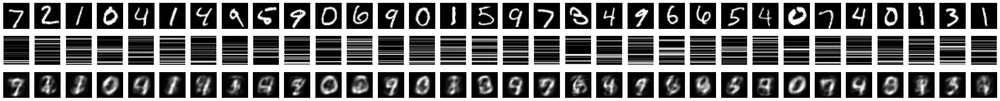

In [3]:
# A simple autoencoder with only one hidden layer.
# Testing quantization of the latent space (wrong way).

import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.utils import Sequence
from skimage.io import imread
from sklearn.model_selection import train_test_split
from skimage.transform import resize
from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

# This variable controls the number of hidden neurons. Notice that the output of a neuron is a floating point number.
LATENT_SPACE_LENGTH = 32

img_width, img_height = 28, 28
img_length = img_height * img_width

# Generate the NumPy arrays with the data.
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
# DATASET = 'fashion_mnist'
# DATA_URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
with np.load(path) as data:
    x_train = data['x_train']
    y_train = data['x_train']
    x_test = data['x_test']
    y_test = data['y_test']

# Pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_DS = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Define how to use the datasets, preprocess, etc.

def process_x(image, label):
    # The input images are reshaped (to have only one dimension) and normalized to [0, 1].
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    processed_img = tf.cast(processed_img, tf.float32) / 255.
    # The input dataset has been labeled, but labels are ignored in the rest of the pipeline.
    return processed_img, label

def process_y(image, label):
    # The output images are already in 1D. Notice that in autoencoder, the objective is to generate the same output than the input.
    return image, image

BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(process_x)
train_DS = train_DS.map(process_y)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(process_x)
test_DS = test_DS.map(process_y)
test_DS = test_DS.batch(BATCH_SIZE)

class Quantization_8bits(keras.layers.Layer):

    def __init__(self, units=32, **kwargs):
        super(Quantization_8bits, self).__init__(**kwargs)
        self.quantized_vals = 0

    def call(self, inputs):
        outputs = inputs
        outputs = tf.saturate_cast(tf.round(outputs * 255.), tf.int8)
        self.quantized_vals = outputs
        outputs = tf.cast(outputs, tf.float32) / 255.0
        return outputs

    def get_vals(self):
        return self.quantized_vals

# Define the autoencoder.
input_layer = keras.Input(shape=(img_length,), name="inputs")
hidden_layer = layers.Dense(LATENT_SPACE_LENGTH, activation="relu")(input_layer)
quantization_layer = Quantization_8bits(units=LATENT_SPACE_LENGTH, name="quantization")(hidden_layer)
output_layer = layers.Dense(img_length, activation="sigmoid", name="outputs")(quantization_layer)

autoencoder = keras.Model(input_layer, output_layer)

# To see the latents (content of the hidden layer), we define a new "model" with only the encoder.
encoder = keras.Model(input_layer, hidden_layer)

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="mse", run_eagerly=True)

autoencoder.summary()

# Train.
EPOCHS = 1
ITERATIONS = 5
plt.gray()
for i in range(ITERATIONS):

    autoencoder.fit(train_DS, epochs=EPOCHS, validation_data=test_DS)

    batch_vals = autoencoder.get_layer("quantization").get_vals()
    print("batch_vals =", batch_vals)
    counter = 0
    for j in range(BATCH_SIZE):
        try:
            vals = batch_vals[j].numpy() + 512
            #print(vals)
            print(entropy(vals, base=2))
            if counter > 10:
              break
            counter += 1
        except:
            pass

    #print("2", autoencoder.get_layer("hidden").variables[1])

    # Show the learning.
    plt.figure(figsize=(40,4))

    n = len(train_DS)
    if n > 32:
        n = 32

    # Show the originals (using the pipeline).
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(3, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                #plt.gray()
                plt.axis("off")
            except:
                pass

    # See the latent space (as images).
    latent_imgs = encoder.predict(test_DS)
    #print("type latent", type(latent_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(resize(latent_imgs[i], (LATENT_SPACE_LENGTH, img_width)))
        plt.axis("off")

    # See the reconstructions.
    reconstructed_imgs = autoencoder.predict(test_DS)
    #print(type(reconstructed_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + 2*n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.axis("off")

    plt.show()

Quantization is not differentiable, and for this reason the autoencoder cannot be optimized efficiently.

##  3. Simulating the quantization noise during training
Let's see now what happens if during training, the quantization noise is simulated by adding uniform noise (but quantization is not performed). During the inference, the latents are truely quantized using 256 quantization levels (8 bits).

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 784)]             0         
                                                                 
 dense_5 (Dense)             (None, 32)                25120     
                                                                 
 add_noise (AddNoise)        (None, 32)                0         
                                                                 
 outputs (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inp

<Figure size 640x480 with 0 Axes>

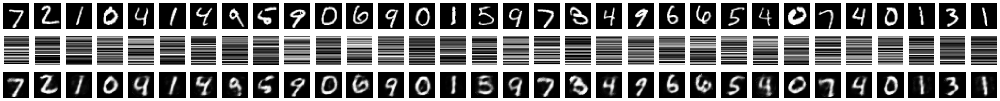

313/313 [==============================] - 2s 6ms/step
batch_vals = tf.Tensor(
[[ 441 2795 2354 1275 1312 1481   39 1808 1003  898 1486 1156 2047 3439
     0  288 2300 1152 1384 1966 3531 1860 1459    0  574  201 1067  991
     0 1935  414 1067]
 [2364 4136 1401 2753 3911 1856  243 2292 1407 1720 2725 3514 5527 2752
     0  858 1040 3322 1996  570 1945 3553 1729 1714 1734 1265 1548 2819
     0 3098 2335 4104]
 [2589 4326 1338 1893 4045 2778 1552 1249 1150 1937 2266 2502 4167 2546
     0 1031 1383 2894 3200 2761 2913 4146 2633 1902 1317  384  702 5383
     0 1999 1570 2283]
 [1212  910 1892 1200 1181 1033 1420  228 3602  825 2593 2725 1545 1511
     0 1705 3226 1589 1855 2019    0 2135 3102 1108 1120 1409 1315 3163
     0 1689 1943 2363]
 [2043 3557 1533 1326 2575 1677  960    0  933 3164  953 2700 1041 2451
     0 1296 3462 3365 1864 1589 1900 2649 4425 1872    0 3284 1644 2667
     0 2191 2167 2611]
 [1112 3469 2845 3215 2175 3250 2054 3527  263 1344 2662 5825 2663 1028
     0 2065 59

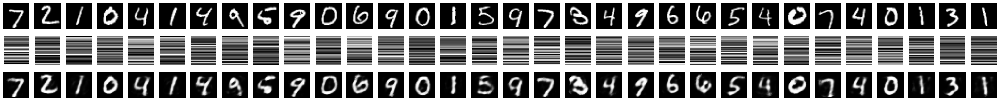

313/313 [==============================] - 3s 9ms/step
batch_vals = tf.Tensor(
[[ 560 3167 2758 1536 1475 1859  242 1969 1225 1145 1786 1222 2319 3632
     0  499 2529 1254 1482 2262 3754 2118 1623  160  800  307 1213 1071
     0 2314  477 1093]
 [2669 4494 1699 3057 4286 2086  609 2723 1659 1972 3062 3739 5878 2996
     0 1111 1187 3723 2223  698 2291 3858 2136 2049 2091 1475 1811 3011
     0 3367 2701 4510]
 [2825 4734 1742 2184 4524 3265 2079 1492 1475 2301 2670 2702 4512 2843
     0 1224 1628 3234 3434 3184 3342 4401 3031 2094 1732  491  843 5793
     0 2180 1755 2493]
 [1258 1052 2287 1324 1304 1378 1639  258 3939 1021 2972 2835 1765 1772
     0 1960 3601 1670 2068 2348  143 2407 3419 1170 1411 1507 1517 3371
     0 1923 2179 2579]
 [2288 3939 1833 1567 2924 1998 1236    0 1184 3516 1266 2920 1176 2613
     0 1518 3858 3794 2005 1757 2158 2932 4877 2120    0 3480 1860 2779
     0 2357 2568 2959]
 [1237 3842 3384 3596 2432 3587 2352 3925  515 1593 3018 6293 2940 1297
     0 2283 64

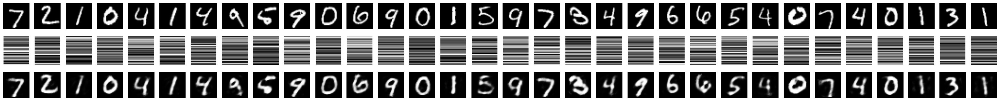

313/313 [==============================] - 3s 8ms/step
batch_vals = tf.Tensor(
[[ 666 3255 2959 1724 1498 1950  382 2105 1346 1327 1949 1210 2410 3823
     0  612 2547 1336 1592 2435 3927 2258 1651  239  925  398 1325 1058
     0 2387  434 1149]
 [2820 4597 1839 3265 4437 2063  844 2977 1871 2168 3187 3763 5964 3157
     0 1178 1055 3955 2369  821 2486 4007 2291 2133 2280 1621 2023 3030
     0 3325 2785 4856]
 [2986 4858 1933 2366 4726 3447 2444 1628 1715 2558 2853 2737 4587 3054
     0 1290 1594 3434 3599 3453 3588 4543 3194 2140 1979  583  998 5932
     0 2115 1718 2739]
 [1337 1043 2437 1483 1283 1412 1822  315 4195 1157 3181 2830 1792 1932
     0 2096 3587 1613 2265 2570  225 2532 3566 1241 1562 1632 1710 3404
     0 1957 2194 2736]
 [2398 4005 1923 1763 3089 2009 1441    0 1436 3740 1377 2931 1115 2753
     0 1634 3891 3917 2154 1807 2336 3077 5029 2270    0 3631 2031 2720
     0 2245 2675 3306]
 [1368 3881 3696 3907 2465 3663 2589 4178  763 1822 3253 6492 2988 1476
     0 2422 64

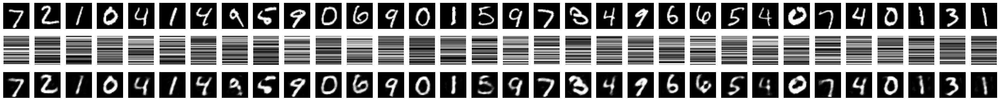

313/313 [==============================] - 3s 8ms/step
batch_vals = tf.Tensor(
[[ 706 3247 3039 1798 1513 2009  435 2178 1444 1407 2010 1195 2437 3914
     0  698 2499 1370 1639 2515 3966 2309 1687  273  973  447 1403 1034
     0 2363  440 1160]
 [2915 4587 1895 3331 4573 2059  955 3057 2047 2227 3199 3761 5933 3235
     0 1194  938 4085 2424  866 2524 4026 2414 2121 2328 1643 2142 2923
     0 3186 2845 5058]
 [3108 4813 2065 2417 4877 3539 2609 1685 1891 2639 2917 2727 4570 3163
     0 1329 1525 3492 3696 3581 3659 4539 3275 2151 2067  599 1068 5904
     0 1976 1659 2856]
 [1397  989 2523 1533 1266 1427 1870  285 4325 1191 3248 2780 1759 1997
     0 2145 3499 1565 2330 2659  213 2547 3661 1278 1583 1673 1775 3334
     0 1928 2183 2777]
 [2406 3987 1931 1782 3204 2041 1504    0 1551 3796 1415 2910 1004 2768
     0 1649 3854 3954 2229 1758 2343 3070 5160 2316    0 3648 2099 2599
     0 2082 2779 3441]
 [1468 3813 3848 4042 2498 3743 2686 4282  938 1866 3352 6594 3008 1551
     0 2457 64

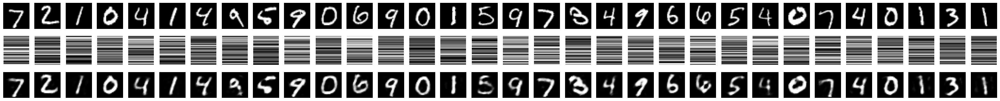

In [5]:
# A simple autoencoder with only one hidden layer.
# Testing quantization of the latent space (right way).

import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.utils import Sequence
from skimage.io import imread
from sklearn.model_selection import train_test_split
from skimage.transform import resize
from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

# This variable controls the number of hidden neurons. Notice that the output of a neuron is a floating point number.
LATENT_SPACE_LENGTH = 32

img_width, img_height = 28, 28
img_length = img_height * img_width

# Generate the NumPy arrays with the data.
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
# DATASET = 'fashion_mnist'
# DATA_URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
with np.load(path) as data:
    x_train = data['x_train']
    y_train = data['x_train']
    x_test = data['x_test']
    y_test = data['y_test']

# Pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_DS = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Define how to use the datasets, preprocess, etc.

def process_x(image, label):
    # The input images are reshaped (to have only one dimension) and normalized to [0, 1].
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    processed_img = tf.cast(processed_img, tf.float32) / 255.
    # The input dataset has been labeled, but labels are ignored in the rest of the pipeline.
    return processed_img, label

def process_y(image, label):
    # The output images are already in 1D. Notice that in autoencoder, the objective is to generate the same output than the input.
    return image, image

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(process_x)
train_DS = train_DS.map(process_y)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(process_x)
test_DS = test_DS.map(process_y)
test_DS = test_DS.batch(BATCH_SIZE)

class AddNoise(keras.layers.Layer):

    def __init__(self, units=32, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        outputs = inputs
        outputs += tf.random.uniform(shape=tf.shape(inputs), minval=-.5, maxval=.5)
        return outputs

class Quantization_8bits(keras.layers.Layer):

    def __init__(self, units=32, **kwargs):
        super().__init__(**kwargs)
        self.quantized_vals = 0

    def call(self, inputs):
        outputs = inputs
        #print("a1", tf.reduce_min(outputs))
        #print("a2", tf.reduce_max(outputs))
        #outputs = tf.keras.activations.sigmoid(outputs - 0.5)#(outputs + 0.5)
        #print("d1", tf.reduce_min(outputs))
        #print("d2", tf.reduce_max(outputs))
        #output = outputs - 0.5
        outputs = tf.saturate_cast(tf.round(outputs * 255.), tf.int16)
        self.quantized_vals = outputs
        outputs = tf.cast(outputs, tf.float32) / 255.0
        return outputs

    def get_vals(self):
        return self.quantized_vals

# Define the autoencoder.
input_layer = keras.Input(
    shape=(img_length,),
    name="inputs")
hidden_layer = layers.Dense(
    LATENT_SPACE_LENGTH,
    activation="relu")(input_layer)
noisy_layer = AddNoise(
    units=LATENT_SPACE_LENGTH,
    name="add_noise"
    )(hidden_layer)
output_layer = layers.Dense(
    img_length,
    activation="sigmoid",
    name="outputs")(noisy_layer)

autoencoder = keras.Model(
    input_layer,
    output_layer)

# To see the latents (content of the hidden layer), we define a new "model" with only the encoder.
encoder = keras.Model(
    input_layer,
    hidden_layer)

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="mse", run_eagerly=True)

autoencoder.summary()

input_layer_2 = keras.Input(shape=(img_length,), name="inputs_2")
hidden_layer_2 = layers.Dense( LATENT_SPACE_LENGTH, activation="relu")(input_layer_2)
quantization_layer = Quantization_8bits(units=LATENT_SPACE_LENGTH, name="quantization")(hidden_layer_2)
output_layer_2 = layers.Dense(img_length, activation="sigmoid", name="outputs_2")(quantization_layer)

autoencoder_2 = keras.Model(input_layer_2, output_layer_2)

autoencoder_2.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="mse", run_eagerly=True)

autoencoder_2.summary()

# Train.
EPOCHS = 1
ITERATIONS = 5
plt.gray()
for i in range(ITERATIONS):

    autoencoder.fit(
        train_DS,
        epochs=EPOCHS,
        validation_data=test_DS)

    #print("2", autoencoder.get_layer("hidden").variables[1])

    # Show the learning.
    plt.figure(figsize=(40,4))

    n = len(train_DS)
    if n > 32:
        n = 32

    # Show the originals (using the pipeline).
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(3, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                #plt.gray()
                plt.axis("off")
            except:
                pass

    # See the latent space (as images).
    latent_imgs = encoder.predict(test_DS)
    #print("type latent", type(latent_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(resize(latent_imgs[i], (LATENT_SPACE_LENGTH, img_width)))
        plt.axis("off")

    # See the reconstructions.
    autoencoder_2.set_weights(autoencoder.get_weights())
    reconstructed_imgs = autoencoder_2.predict(test_DS)
    #print(type(reconstructed_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + 2*n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.axis("off")

    batch_vals = autoencoder_2.get_layer("quantization").get_vals()
    print("batch_vals =", batch_vals)
    for j in range(BATCH_SIZE):
        try:
            vals = batch_vals[j].numpy() + 512
            #print(vals)
            print(entropy(vals, base=2))
        except:
            pass

    plt.show()

##  4. Considering RD tradeoff
So far, the autoencoder has tried to minimize the distortion ($D%) without considering the number of bits that the encoding of the latent space requires. When we use an entropy encoder, where the length of the code-stream depends on the statistics of the symbols of the latent space, it is required to optimize also considering the length of the code-stream. Now $R$ should also be minimized.

Unfortunately, $D$ and $R$ cannot be minimized at the same time becase one of them are inversely related with the other (for example, if $R$ is minimized, $D$ grows). For this reason, we need to define a cost function that controls such trade-off between both optimization objectives. Such cost function is usually defined as the Lagrangian
\begin{equation}
  J = R + \lambda D,
\end{equation}
where the Lagrange multiplier $\lambda$ controls a point in the R-D curve.

Sumarizing, now we optimize the autoencoder by minimizing $J$. $R$ is estimated using the entropy of the latent space.

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.
rate:  tf.Tensor(1.8302125710533468, shape=(), dtype=float64)
distortion:  tf.Tensor(0.47133, shape=(), dtype=float32)
Epoch 1/5


Instructions for updating:
Use fn_output_signature instead


469/469 [==============================] - 14s 26ms/step - loss: 665.1360 - distortion_loss: 0.1322 - rate_loss: 3.9207 - distortion_pass_through_loss: 0.1322 - rate_pass_through_loss: 3.9210 - val_loss: 525.9345 - val_distortion_loss: 0.1043 - val_rate_loss: 4.3688 - val_distortion_pass_through_loss: 0.1043 - val_rate_pass_through_loss: 4.3693
Epoch 2/5
469/469 [==============================] - 9s 19ms/step - loss: 490.5453 - distortion_loss: 0.0972 - rate_loss: 4.4604 - distortion_pass_through_loss: 0.0972 - rate_pass_through_loss: 4.4605 - val_loss: 464.7522 - val_distortion_loss: 0.0920 - val_rate_loss: 4.5221 - val_distortion_pass_through_loss: 0.0921 - val_rate_pass_through_loss: 4.5221
Epoch 3/5
469/469 [==============================] - 10s 22ms/step - loss: 447.7841 - distortion_loss: 0.0886 - rate_loss: 4.5482 - distortion_pass_through_loss: 0.0886 - rate_pass_through_loss: 4.5482 - val_loss: 435.2564 - val_distortion_loss: 0.0861 - val_rate_loss: 4.5719 - val_distortion_pas

<Figure size 640x480 with 0 Axes>

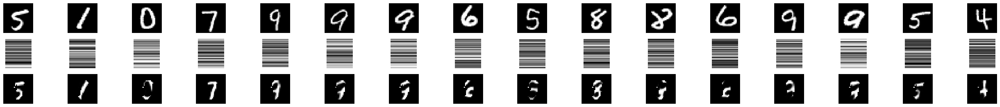

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
#from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_SPACE_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

train_DS, test_DS = tfds.load(
    DATASET,
    split=["train", "test"],
    shuffle_files=True,
    as_supervised=True,
    with_info=False,
)

def encode(latent_dims):
  """Creates the analysis (encoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Input(
            shape=(img_length,), name="inputs"),
      tf.keras.layers.Dense(
          latent_dims, use_bias=True, activation="relu", name="latent"),
  ], name="analysis_transform")

def decode():
  """Creates the synthesis (decoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Dense(
          img_length, use_bias=True, activation="sigmoid", name="outputs"),
  ], name="synthesis_transform")


def estimate_rate(x):
    def entropy(row):
        _, _, count = tf.unique_with_counts(row)
        prob = count / tf.reduce_sum(count)
        _2 = tf.ones_like(prob)*2
        log_2 = tf.cast(tf.math.log(_2), tf.float64)
        #print(log_2.dtype, prob.dtype, tf.math.log(prob).dtype)
        #return -tf.reduce_sum(prob * tf.math.log(prob))
        return -tf.reduce_sum(prob * tf.math.log(prob)/log_2)

    #     rev = tf.map_fn(row_entropy, new_f_w_t,dtype=tf.float32)
    #entropy_batch = []
    #for j in range(len(batch)):
    #    entropy_batch.append(entropy(batch, base=2))
    #new_f_w_t = tf.histogram_fixed_width_bins(x, value_ranges, nbins)
    #rev = tf.map_fn(row_entropy, new_f_w_t,dtype=tf.float32)
    value_ranges = [0.0, 32.0]
    nbins = 256
    #print("estimate_rate.max(x)=",
    #      tf.reduce_max(x, axis = 1, keepdims = True),
    #      "estimate_rate.min(x)=",
    #      tf.reduce_min(x, axis = 1, keepdims = True))
    histograms = tf.cast(tf.histogram_fixed_width_bins(x, value_ranges, nbins), tf.float32)
    entropies = tf.map_fn(fn=entropy, elems=histograms, dtype=tf.float64)
    rate = tf.reduce_sum(entropies)
    #print("----------------___", histograms.dtype, entropies.dtype, rate.dtype)

    rate /= (tf.cast(tf.size(entropies), tf.float64))
    #tf.print("rate=", rate)
    return rate

class Trainer(tf.keras.Model):

    def __init__(self, latent_dims):
        super().__init__()
        self.encode = encode(latent_dims)
        self.decode = decode()

    def call(self, x):
        """Computes rate and distortion losses."""
        # Ensure inputs are floats in the range (0, 1).
        #tf.print("x=", x) # <- produces 0
        #print("max x", tf.reduce_max(x))

        x = tf.cast(x, self.compute_dtype) / 255.
        x = tf.reshape(x, (-1, 28*28))

        # Compute latent space representation y, perturb it and model its entropy,
        # then compute the reconstructed pixel-level representation x_hat.
        y = self.encode(x)
        #print("size(y)=", tf.size(y))
        #print("len(y)=", len(y))
        #print("shape(y)", tf.shape(y))
        #print("size(x)=", tf.size(x))
        #tf.print("x=", x)
        #tf.print("y=", y)

        rate = estimate_rate(y)
        x_hat = self.decode(y)
        #print("Autoencoder.call.max(y)=", tf.reduce_max(y))
        #print("Autoencoder.call.max(x)=", tf.reduce_max(x))
        #print("Autoencoder.call.max(x_hat)=", tf.reduce_max(x_hat))

        # Average number of bits per MNIST digit.
        rate = tf.reduce_mean(rate)

        # Mean absolute difference across pixels.
        distortion = tf.reduce_mean(abs(x - x_hat))

        return dict(rate=rate, distortion=distortion)

(example_batch, _), = test_DS.batch(32).take(1)
trainer = Trainer(10)
example_output = trainer(example_batch)

print("rate: ", example_output["rate"])
print("distortion: ", example_output["distortion"])

def pass_through_loss(_, x):
  # Since rate and distortion are unsupervised, the loss doesn't need a target.
  return x

def configure_training(lmbda, latent_dims=32):
    trainer = Trainer(latent_dims)
    trainer.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        # Just pass through rate and distortion as losses/metrics.
        loss=dict(rate=pass_through_loss, distortion=pass_through_loss),
        metrics=dict(rate=pass_through_loss, distortion=pass_through_loss),
        loss_weights=dict(rate=1., distortion=lmbda),)
    return trainer

def add_rd_targets(image, label):
    # Training is unsupervised, so labels aren't necessary here. However, we
    # need to add "dummy" targets for rate and distortion.
    #tf.print(image) <- produce 0
    #tf.print(label) <- produce labels
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    #processed_img = tf.cast(processed_img, tf.float32) / 255.
    #tf.print(processed_img)
    return processed_img, dict(rate=0., distortion=0.)

def train(lmbda, epochs=5):
    trainer = configure_training(lmbda)
    #print("-----------")
    #tf.print(train_DS.take(16))
    #print("-----------")
    trainer.fit(
        train_DS.map(add_rd_targets).batch(128).prefetch(8),
        epochs=epochs,
        validation_data=test_DS.map(add_rd_targets).batch(128).cache(),
        #validation_data=train_DS.map(add_rd_targets).batch(128).cache(),
        validation_freq=1,
        verbose=1,
    )
    return trainer

trainer = train(lmbda=5000)
trainer.summary()

class Compressor(tf.keras.Model):
    def __init__(self, analysis_transform):
        super().__init__()
        self.analysis_transform = analysis_transform

    def call(self, x):
        # Ensure inputs are floats in the range (0, 1).
        x = tf.cast(x, self.compute_dtype) / 255.
        x = tf.reshape(x, (-1, 28*28))
        y = self.analysis_transform(x)
        #tf.print(y)
        #print("size(y)=", tf.size(y))
        # Also return the exact information content of each digit.
        rate = estimate_rate(y)
        rate = tf.reduce_mean(rate)
        return y, rate

class Decompressor(tf.keras.Model):
    def __init__(self, synthesis_transform):
        super().__init__()
        self.synthesis_transform = synthesis_transform

    def call(self, y):
        #tf.print(y)
        #print("Decompressor.call.max(y)", tf.reduce_max(y)) # Returns > 0
        x_hat = self.synthesis_transform(y)
        #print("Decompressor.call.max(x_hat)", tf.reduce_max(x_hat))
        # Scale and cast back to 8-bit integer.
        #tf.print(x_hat)
        #print("Decompressor.call.x_hat", tf.reduce_max(x_hat)) # Returns 0
        return tf.saturate_cast(tf.round(x_hat * 255.), tf.uint8)

def make_mnist_codec(trainer, **kwargs):
    # The entropy model must be created with `compression=True` and the same
    # instance must be shared between compressor and decompressor.
    compressor = Compressor(trainer.encode)
    decompressor = Decompressor(trainer.decode)
    return compressor, decompressor

compressor, decompressor = make_mnist_codec(trainer)

(originals, _), = test_DS.batch(16).skip(3).take(1)
y, entropies = compressor(originals)
print("shape(y)=", tf.shape(y), "max(y)=", tf.reduce_max(y), "entropies=", entropies)
reconstructed_imgs = decompressor(y)
print("shape(recons)=", tf.shape(reconstructed_imgs), "max(recons)=", tf.reduce_max(reconstructed_imgs))
n = len(reconstructed_imgs)
plt.gray()
plt.figure(figsize=(40,4))
for i in range(n):
    ax = plt.subplot(3, n, i + 1 )
    plt.imshow(tf.reshape(originals[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(resize(y[i],(LATENT_SPACE_LENGTH, img_width)))
    #plt.imshow(tf.reshape(reconstructed_imgs[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + 2*n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(tf.reshape(reconstructed_imgs[i], (img_height, img_width)))
    plt.axis("off")
plt.show()

##  5. Adding some convolutional layers
Now, the dense ANN learns on shapes, not on pixels.

estimate_rate.max(x)= tf.Tensor(
[[0.12126047]
 [0.19227521]
 [0.09153694]
 [0.03179629]
 [0.0737468 ]
 [0.13733278]
 [0.11378455]
 [0.06277204]
 [0.18928654]
 [0.07634889]
 [0.08127543]
 [0.09366124]
 [0.11365341]
 [0.14210086]
 [0.09373613]
 [0.13816562]
 [0.17234913]
 [0.11739926]
 [0.0793857 ]
 [0.08413077]
 [0.10362995]
 [0.06417105]
 [0.14050676]
 [0.15298878]
 [0.07291046]
 [0.13904484]
 [0.04592123]
 [0.08259705]
 [0.0613023 ]
 [0.1077286 ]
 [0.0868566 ]
 [0.12036367]], shape=(32, 1), dtype=float32) estimate_rate.min(x)= tf.Tensor(
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]], shape=(32, 1), dtype=float32)
rate:  tf.Tensor(0.13190501069698535, shape=(), dtype=float64)
distortion:  tf.Tensor(0.14677787, shape=(), dtype=float32)
Epoch 1/5
estimate_rate.max(x)= Tensor("trainer_3/Max:0", shape=(None, 1), dtype=float32) estimate_rate.min

<Figure size 640x480 with 0 Axes>

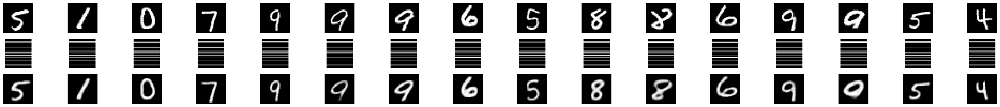

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
#from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_SPACE_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

train_DS, test_DS = tfds.load(
    DATASET,
    split=["train", "test"],
    shuffle_files=True,
    as_supervised=True,
    with_info=False,
)

def encode(latent_dims):
  """Creates the analysis (encoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Conv2D(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2D(
          50, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(
          500, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          latent_dims, use_bias=True, activation="relu", name="latent"),
  ], name="analysis_transform")

def decode():
  """Creates the synthesis (decoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Dense(
          500, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          2450, use_bias=True, activation="leaky_relu", name="fc_2"),
      tf.keras.layers.Reshape((7, 7, 50)),
      tf.keras.layers.Conv2DTranspose(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2DTranspose(
          1, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
  ], name="synthesis_transform")

def estimate_rate(x):
    def entropy(row):
        _, _, count = tf.unique_with_counts(row)
        prob = count / tf.reduce_sum(count)
        _2 = tf.ones_like(prob)*2
        log_2 = tf.cast(tf.math.log(_2), tf.float64)
        return -tf.reduce_sum(prob * tf.math.log(prob)/log_2)

    value_ranges = [0.0, 32.0]
    nbins = 256
    print("estimate_rate.max(x)=",
          tf.reduce_max(x, axis = 1, keepdims = True),
          "estimate_rate.min(x)=",
          tf.reduce_min(x, axis = 1, keepdims = True))
    histograms = tf.cast(tf.histogram_fixed_width_bins(x, value_ranges, nbins), tf.float32)
    entropies = tf.map_fn(fn=entropy, elems=histograms, dtype=tf.float64)
    rate = tf.reduce_sum(entropies)

    rate /= (tf.cast(tf.size(entropies), tf.float64))
    return rate

class Trainer(tf.keras.Model):

    def __init__(self, latent_dims):
        super().__init__()
        self.encode = encode(latent_dims)
        self.decode = decode()

    def call(self, x):
        """Computes rate and distortion losses."""
        # Ensure inputs are floats in the range (0, 1).
        x = tf.cast(x, self.compute_dtype) / 255.
        x = tf.reshape(x, (-1, 28, 28, 1))

        # Compute latent space representation y, perturb it and model its entropy,
        # then compute the reconstructed pixel-level representation x_hat.
        y = self.encode(x)

        rate = estimate_rate(y)
        x_hat = self.decode(y)

        # Average number of bits per MNIST digit.
        rate = tf.reduce_mean(rate)

        # Mean absolute difference across pixels.
        distortion = tf.reduce_mean(abs(x - x_hat))

        return dict(rate=rate, distortion=distortion)

(example_batch, _), = test_DS.batch(32).take(1)
trainer = Trainer(10)
example_output = trainer(example_batch)

print("rate: ", example_output["rate"])
print("distortion: ", example_output["distortion"])

def pass_through_loss(_, x):
  # Since rate and distortion are unsupervised, the loss doesn't need a target.
  return x

def configure_training(lmbda, latent_dims=32):
    trainer = Trainer(latent_dims)
    trainer.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        # Just pass through rate and distortion as losses/metrics.
        loss=dict(rate=pass_through_loss, distortion=pass_through_loss),
        metrics=dict(rate=pass_through_loss, distortion=pass_through_loss),
        loss_weights=dict(rate=1., distortion=lmbda),)
    return trainer

def add_rd_targets(image, label):
    # Training is unsupervised, so labels aren't necessary here. However, we
    # need to add "dummy" targets for rate and distortion.
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    #processed_img = tf.cast(processed_img, tf.float32) / 255.
    return processed_img, dict(rate=0., distortion=0.)

def train(lmbda, epochs=5):
    trainer = configure_training(lmbda)
    trainer.fit(
        train_DS.map(add_rd_targets).batch(128).prefetch(8),
        epochs=epochs,
        validation_data=test_DS.map(add_rd_targets).batch(128).cache(),
        validation_freq=1,
        verbose=1,
    )
    return trainer

trainer = train(lmbda=500)
trainer.summary()

class Compressor(tf.keras.Model):
    def __init__(self, analysis_transform):
        super().__init__()
        self.analysis_transform = analysis_transform

    def call(self, x):
        # Ensure inputs are floats in the range (0, 1).
        x = tf.cast(x, self.compute_dtype) / 255.
        #x = tf.reshape(x, (-1, 28*28))
        y = self.analysis_transform(x)
        # Also return the exact information content of each digit.
        rate = estimate_rate(y)
        rate = tf.reduce_mean(rate)
        return y, rate

class Decompressor(tf.keras.Model):
    def __init__(self, synthesis_transform):
        super().__init__()
        self.synthesis_transform = synthesis_transform

    def call(self, y):
        x_hat = self.synthesis_transform(y)
        # Scale and cast back to 8-bit integer.
        return tf.saturate_cast(tf.round(x_hat * 255.), tf.uint8)

def make_mnist_codec(trainer, **kwargs):
    # The entropy model must be created with `compression=True` and the same
    # instance must be shared between compressor and decompressor.
    compressor = Compressor(trainer.encode)
    decompressor = Decompressor(trainer.decode)
    return compressor, decompressor

compressor, decompressor = make_mnist_codec(trainer)
(originals, _), = test_DS.batch(16).skip(3).take(1)
y, entropies = compressor(originals)
print("shape(y)=", tf.shape(y), "max(y)=", tf.reduce_max(y), "entropies=", entropies)
reconstructed_imgs = decompressor(y)
print("shape(recons)=", tf.shape(reconstructed_imgs), "max(recons)=", tf.reduce_max(reconstructed_imgs))
n = len(reconstructed_imgs)
plt.gray()
plt.figure(figsize=(40,4))
for i in range(n):
    ax = plt.subplot(3, n, i + 1 )
    plt.imshow(tf.reshape(originals[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(resize(y[i],(LATENT_SPACE_LENGTH, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + 2*n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(tf.reshape(reconstructed_imgs[i], (img_height, img_width)))
    plt.axis("off")
plt.show()

tf.Tensor([16 32], shape=(2,), dtype=int32)
tf.Tensor(
[[ 5.44110119e-01  2.07380310e-01  7.35643208e-02  4.64345515e-02
  -1.30158985e+00 -9.53856528e-01  8.41728568e-01  1.93968678e+00
   6.51257753e-01  1.10488665e+00  1.37462270e+00  1.14875197e+00
   1.08213139e+00  5.51049232e-01  7.00961426e-02  7.07385004e-01
   8.88570964e-01 -4.64327276e-01  1.20843327e+00 -7.90115952e-01
  -7.30490386e-01 -7.20753789e-01  3.65275264e-01 -1.69507593e-01
   2.03180790e-01 -9.02322948e-01 -6.50457859e-01  2.41527677e+00
   5.70346892e-01  8.77035379e-01  3.68764579e-01 -5.76170444e-01]
 [-6.61703765e-01 -1.02277565e+00  6.10901177e-01 -2.56390393e-01
   2.10671735e+00 -4.59748507e-02 -2.06909806e-01  6.32463574e-01
   4.22659993e-01  5.16539104e-02 -7.37364292e-01 -1.11440849e+00
   4.85859185e-01 -1.43682110e+00  1.78831708e+00  4.78447080e-01
  -1.37648273e+00  7.93998539e-01 -2.13322544e+00 -1.73031583e-01
  -1.74873459e+00 -4.69266385e-01 -1.55762172e+00 -8.94169569e-01
   2.19927981e-01  1

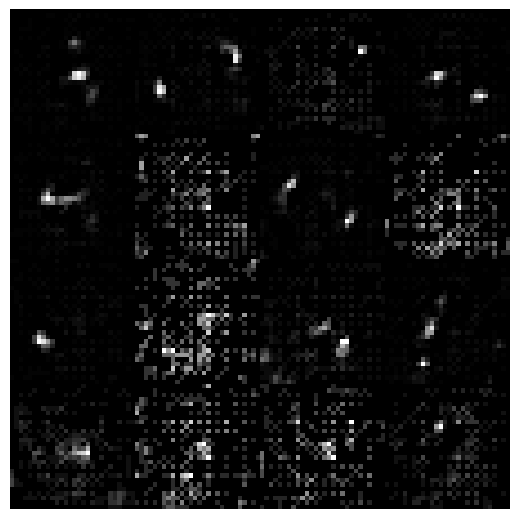

In [ ]:
import os

print(tf.shape(y))

#latent = tf.constant([os.urandom(8) for _ in range(16)])
#tf.print(latent)
latent = tf.random.stateless_normal(shape=[16, LATENT_SPACE_LENGTH], seed=[1, 2])
print(latent)
#input()
samples = decompressor(latent)

fig, axes = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(5, 5))
axes = axes.ravel()
for i in range(len(axes)):
  axes[i].imshow(tf.squeeze(samples[i]))
  axes[i].axis("off")
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)


##  6. Variational Autoencoding
A VAE is an autoencoder that learns a latent variable model for its input data. So instead of letting the neural network learn an arbitrary function, it is learning the parameters of a probability distribution modeling the data. Now, if you sample points from this distribution, you can generate new input data samples: a VAE is a "generative model". See https://blog.keras.io/building-autoencoders-in-keras.html.

In [ ]:
# Based on https://keras.io/examples/generative/vae/ and
# https://www.tensorflow.org/tutorials/generative/data_compression

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

EPOCHS = 1
#EPOCHS = 30
LAMBDA = 1.0

def estimate_rate(x):
    def entropy(row):
        _, _, count = tf.unique_with_counts(row)
        prob = count / tf.reduce_sum(count)
        _2 = tf.ones_like(prob)*2
        log_2 = tf.cast(tf.math.log(_2), tf.float64)
        return -tf.reduce_sum(prob * tf.math.log(prob)/log_2)

    value_ranges = [0.0, 32.0]
    nbins = 256
    print("estimate_rate.max(x)=",
          tf.reduce_max(x, axis = 1, keepdims = True),
          "estimate_rate.min(x)=",
          tf.reduce_min(x, axis = 1, keepdims = True))
    histograms = tf.cast(tf.histogram_fixed_width_bins(x, value_ranges, nbins), tf.float32)
    entropies = tf.map_fn(fn=entropy, elems=histograms, dtype=tf.float64)
    rate = tf.reduce_sum(entropies)

    rate /= (tf.cast(tf.size(entropies), tf.float64))
    return tf.cast(rate, tf.float32)

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            z_mean_entropy = estimate_rate(z_mean)
            z_log_var_entropy = estimate_rate(z_log_var)
            total_entropy = (z_mean_entropy + z_log_var_entropy)/2.0  # Both have the same length
            tf.print("\ntotal_entropy=", total_entropy)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = total_entropy + LAMBDA*(reconstruction_loss + kl_loss)
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()
x = np.concatenate([x_train, x_test], axis=0)
x = np.expand_dims(x, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x=x, epochs=EPOCHS, batch_size=128)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 28, 28, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 14, 14, 32)           320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 7, 7, 64)             18496     ['conv2d[0][0]']              
                                                                                                  
 flatten_2 (Flatten)         (None, 3136)                 0         ['conv2d_1[0][0]']            
                                                                                            

1/1 [==============================] - 0s 23ms/step


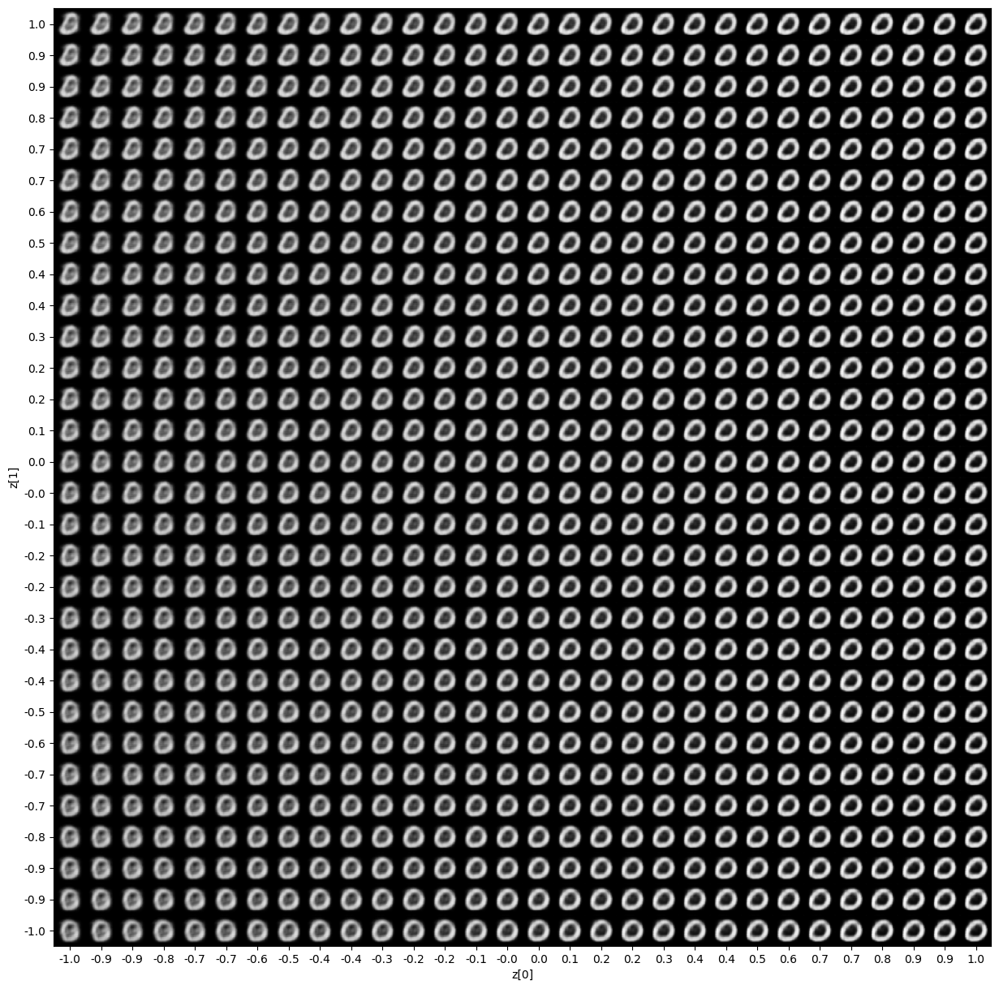

In [ ]:
import matplotlib.pyplot as plt

def plot_latent_space(vae, n=30, figsize=15):
    # display a n*n 2D manifold of digits
    digit_size = 28
    scale = 1.0
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = vae.decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent_space(vae)


In [ ]:
z_mean, z_log_var, z = encoder.predict(x[0:16])
y = decoder.predict(z)

1/1 [==============================] - 0s 45ms/step


<Figure size 640x480 with 0 Axes>

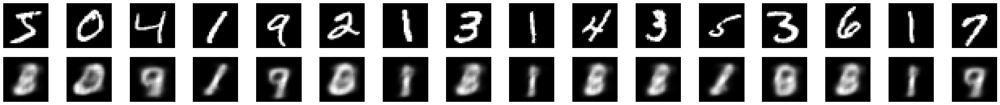

In [ ]:
n = len(y)
plt.gray()
plt.figure(figsize=(40,4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1 )
    plt.imshow(tf.reshape(x[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(2, n, i + 1 + n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(tf.reshape(y[i], (img_height, img_width)))
    plt.axis("off")
plt.show()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 28, 28, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 14, 14, 32)           320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 7, 7, 64)             18496     ['conv2d[0][0]']              
                                                                                                  
 flatten (Flatten)           (None, 3136)                 0         ['conv2d_1[0][0]']            
                                                                                            

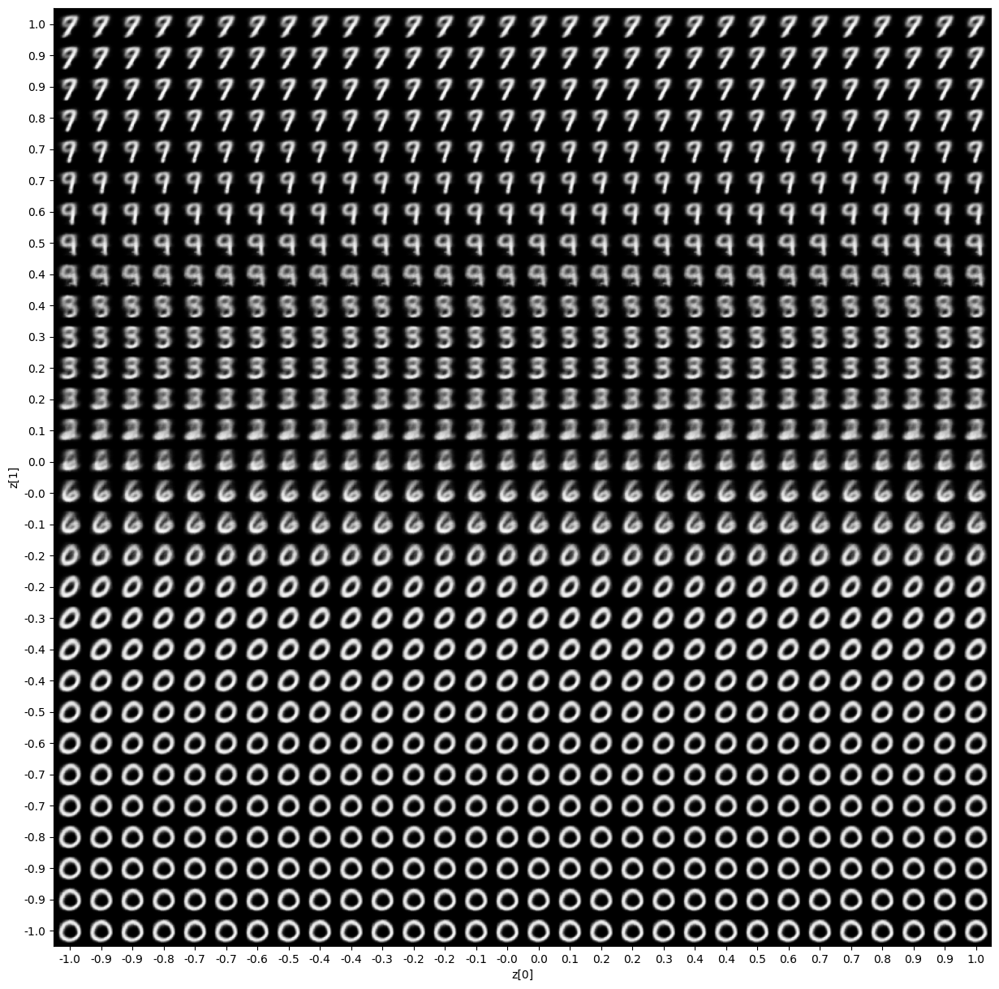

In [ ]:
# https://keras.io/examples/generative/vae/

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

#EPOCHS = 5
EPOCHS = 20

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
mnist_digits = np.concatenate([x_train, x_test], axis=0)
mnist_digits = np.expand_dims(mnist_digits, -1).astype("float32") / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(mnist_digits, epochs=EPOCHS, batch_size=128)

import matplotlib.pyplot as plt

def plot_latent_space(vae, n=30, figsize=15):
    # display a n*n 2D manifold of digits
    digit_size = 28
    scale = 1.0
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = vae.decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent_space(vae)


In [ ]:
z_mean, z_log_var, z = encoder.predict(x[0:16])
y = decoder.predict(z)
print("sampling (one for each encoded image):")
print(tf.shape(z))
tf.print(z)
print("means:")
print(tf.shape(z_mean))
tf.print(z_mean)
print("log variances:")
print(tf.shape(z_log_var))
tf.print(z_log_var)
n = len(y)
plt.gray()
plt.figure(figsize=(40,4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1 )
    plt.imshow(tf.reshape(x[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(2, n, i + 1 + n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(tf.reshape(y[i], (img_height, img_width)))
    plt.axis("off")
plt.show()

TypeError: ignored

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.
estimate_rate.max(x)= tf.Tensor(
[[0.11496494]
 [0.17050481]
 [0.1391384 ]
 [0.06377632]
 [0.13897702]
 [0.12260421]
 [0.19845898]
 [0.08344051]
 [0.13090433]
 [0.08065937]
 [0.11805144]
 [0.22687122]
 [0.08976179]
 [0.08211483]
 [0.10073219]
 [0.15336171]
 [0.13451475]
 [0.1381234 ]
 [0.09355614]
 [0.17389928]
 [0.07869896]
 [0.07550429]
 [0.1090425 ]
 [0.14850593]
 [0.12198829]
 [0.1418529 ]
 [0.06332226]
 [0.14681184]
 [0.08639282]
 [0.06536258]
 [0.19157758]
 [0.10220147]], shape=(32, 1), dtype=float32) estimate_rate.min(x)= tf.Tensor(
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]], shape=(32, 1), dtype=float32)
rate:  tf.Tensor(0.23680213485757068, shape=(), dtype=float64)
distortion:  tf.Tensor(0.14686167, shape=(), dty

Instructions for updating:
Use fn_output_signature instead


estimate_rate.max(x)= Tensor("trainer_1/Max:0", shape=(None, 1), dtype=float32) estimate_rate.min(x)= Tensor("trainer_1/Min:0", shape=(None, 1), dtype=float32)
estimate_rate.max(x)= Tensor("trainer_1/Max:0", shape=(None, 1), dtype=float32) estimate_rate.min(x)= Tensor("trainer_1/Min:0", shape=(None, 1), dtype=float32)
469/469 [==============================] - 54s 109ms/step - loss: 626.6483 - distortion_loss: 0.1253 - rate_loss: 3.3171e-04 - distortion_pass_through_loss: 0.1253 - rate_pass_through_loss: 3.3153e-04 - val_loss: 628.5710 - val_distortion_loss: 0.1257 - val_rate_loss: 0.0000e+00 - val_distortion_pass_through_loss: 0.1257 - val_rate_pass_through_loss: 0.0000e+00
Epoch 2/5
469/469 [==============================] - 44s 93ms/step - loss: 294.1802 - distortion_loss: 0.0584 - rate_loss: 1.9412 - distortion_pass_through_loss: 0.0584 - rate_pass_through_loss: 1.9415 - val_loss: 192.6854 - val_distortion_loss: 0.0380 - val_rate_loss: 2.5299 - val_distortion_pass_through_loss: 0.0

<Figure size 640x480 with 0 Axes>

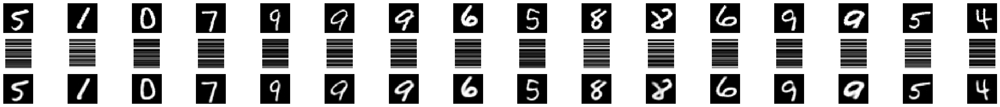

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
#from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_SPACE_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

train_DS, test_DS = tfds.load(
    DATASET,
    split=["train", "test"],
    shuffle_files=True,
    as_supervised=True,
    with_info=False,
)

def encode(latent_dims):
  """Creates the analysis (encoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Conv2D(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2D(
          50, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(
          500, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          latent_dims, use_bias=True, activation="relu", name="latent"),
  ], name="analysis_transform")

def decode():
  """Creates the synthesis (decoder) transform."""
  return tf.keras.Sequential([
      tf.keras.layers.Dense(
          500, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          2450, use_bias=True, activation="leaky_relu", name="fc_2"),
      tf.keras.layers.Reshape((7, 7, 50)),
      tf.keras.layers.Conv2DTranspose(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2DTranspose(
          1, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
  ], name="synthesis_transform")

def estimate_rate(x):
    def entropy(row):
        _, _, count = tf.unique_with_counts(row)
        prob = count / tf.reduce_sum(count)
        _2 = tf.ones_like(prob)*2
        log_2 = tf.cast(tf.math.log(_2), tf.float64)
        return -tf.reduce_sum(prob * tf.math.log(prob)/log_2)

    value_ranges = [0.0, 32.0]
    nbins = 256
    print("estimate_rate.max(x)=",
          tf.reduce_max(x, axis = 1, keepdims = True),
          "estimate_rate.min(x)=",
          tf.reduce_min(x, axis = 1, keepdims = True))
    histograms = tf.cast(tf.histogram_fixed_width_bins(x, value_ranges, nbins), tf.float32)
    entropies = tf.map_fn(fn=entropy, elems=histograms, dtype=tf.float64)
    rate = tf.reduce_sum(entropies)

    rate /= (tf.cast(tf.size(entropies), tf.float64))
    return rate

class Trainer(tf.keras.Model):

    def __init__(self, latent_dims):
        super().__init__()
        self.encode = encode(latent_dims)
        self.decode = decode()

    def call(self, x):
        """Computes rate and distortion losses."""
        # Ensure inputs are floats in the range (0, 1).
        x = tf.cast(x, self.compute_dtype) / 255.
        x = tf.reshape(x, (-1, 28, 28, 1))

        # Compute latent space representation y, perturb it and model its entropy,
        # then compute the reconstructed pixel-level representation x_hat.
        y = self.encode(x)

        rate = estimate_rate(y)
        x_hat = self.decode(y)

        # Average number of bits per MNIST digit.
        rate = tf.reduce_mean(rate)

        # Mean absolute difference across pixels.
        distortion = tf.reduce_mean(abs(x - x_hat))

        return dict(rate=rate, distortion=distortion)

(example_batch, _), = test_DS.batch(32).take(1)
trainer = Trainer(10)
example_output = trainer(example_batch)

print("rate: ", example_output["rate"])
print("distortion: ", example_output["distortion"])

def pass_through_loss(_, x):
  # Since rate and distortion are unsupervised, the loss doesn't need a target.
  return x

def configure_training(lmbda, latent_dims=50):
    trainer = Trainer(latent_dims)
    trainer.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        # Just pass through rate and distortion as losses/metrics.
        loss=dict(rate=pass_through_loss, distortion=pass_through_loss),
        metrics=dict(rate=pass_through_loss, distortion=pass_through_loss),
        loss_weights=dict(rate=1., distortion=lmbda),)
    return trainer

def add_rd_targets(image, label):
    # Training is unsupervised, so labels aren't necessary here. However, we
    # need to add "dummy" targets for rate and distortion.
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    #processed_img = tf.cast(processed_img, tf.float32) / 255.
    return processed_img, dict(rate=0., distortion=0.)

def train(lmbda, epochs=5):
    trainer = configure_training(lmbda)
    trainer.fit(
        train_DS.map(add_rd_targets).batch(128).prefetch(8),
        epochs=epochs,
        validation_data=test_DS.map(add_rd_targets).batch(128).cache(),
        validation_freq=1,
        verbose=1,
    )
    return trainer

trainer = train(lmbda=5000)

class Compressor(tf.keras.Model):
    def __init__(self, analysis_transform):
        super().__init__()
        self.analysis_transform = analysis_transform

    def call(self, x):
        # Ensure inputs are floats in the range (0, 1).
        x = tf.cast(x, self.compute_dtype) / 255.
        #x = tf.reshape(x, (-1, 28*28))
        y = self.analysis_transform(x)
        # Also return the exact information content of each digit.
        rate = estimate_rate(y)
        rate = tf.reduce_mean(rate)
        return y, rate

class Decompressor(tf.keras.Model):
    def __init__(self, synthesis_transform):
        super().__init__()
        self.synthesis_transform = synthesis_transform

    def call(self, y):
        x_hat = self.synthesis_transform(y)
        # Scale and cast back to 8-bit integer.
        return tf.saturate_cast(tf.round(x_hat * 255.), tf.uint8)

def make_mnist_codec(trainer, **kwargs):
    # The entropy model must be created with `compression=True` and the same
    # instance must be shared between compressor and decompressor.
    compressor = Compressor(trainer.encode)
    decompressor = Decompressor(trainer.decode)
    return compressor, decompressor

compressor, decompressor = make_mnist_codec(trainer)
(originals, _), = test_DS.batch(16).skip(3).take(1)
y, entropies = compressor(originals)
print("shape(y)=", tf.shape(y), "max(y)=", tf.reduce_max(y), "entropies=", entropies)
reconstructed_imgs = decompressor(y)
print("shape(recons)=", tf.shape(reconstructed_imgs), "max(recons)=", tf.reduce_max(reconstructed_imgs))
n = len(reconstructed_imgs)
plt.gray()
plt.figure(figsize=(40,4))
for i in range(n):
    ax = plt.subplot(3, n, i + 1 )
    plt.imshow(tf.reshape(originals[i], (img_height, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(resize(y[i],(LATENT_SPACE_LENGTH, img_width)))
    plt.axis("off")
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + 2*n)
    #tf.print(reconstructed_imgs[i])
    plt.imshow(tf.reshape(reconstructed_imgs[i], (img_height, img_width)))
    plt.axis("off")
plt.show()

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_SPACE_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

# Generate the NumPy arrays with the data.
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
with np.load(path) as data:
    x_train = data['x_train']
    y_train = data['x_train']
    x_test = data['x_test']
    y_test = data['x_test']

# Generate the pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_DS = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Define how to use the datasets, preprocess, etc.

def process_x(image, label):
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    processed_img = tf.cast(processed_img, tf.float32) / 255.
    return processed_img, label

def process_y(image, label):
    # The last layer of the network is a dense layer and TensorFlow imposes 1D.
    return image, tf.reshape(image, (img_height * img_width, 1))

BATCH_SIZE = 1024
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(process_x)
train_DS = train_DS.map(process_y)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(process_x)
test_DS = test_DS.map(process_y)
test_DS = test_DS.batch(BATCH_SIZE)

class NoisyDense(keras.layers.Layer):

    def __init__(self, units=32, input_dim=32, activation="relu", **kwargs):
        super(NoisyDense, self).__init__(**kwargs)
        w_init = tf.random_normal_initializer()
        self.w = tf.Variable(
            initial_value=w_init(shape=(input_dim, units), dtype="float32"),
            trainable=True,
        )
        b_init = tf.zeros_initializer()
        self.b = tf.Variable(
            initial_value=b_init(shape=(units,), dtype="float32"), trainable=True
        )
        self.quantized_vals = 0

    #@tf.function
    def call(self, inputs):
        outputs = tf.matmul(inputs, self.w) + self.b
        #noise = tf.random.uniform(shape=tf.shape(weighted_sums), minval=-.5, maxval=.5)
        #quantized_sums_01 = weighted_sums
        #quantized_sums_01 = noise + weighted_sums
        #print(tf.reduce_max(weighted_sums))
        #outputs = tf.keras.activations.tanh(outputs)
        outputs = tf.saturate_cast(tf.round(outputs * 255.), tf.int16)
        #quantized_sums_8b = tf.saturate_cast(tf.round(weighted_sums * 255.), tf.int16)
        self.quantized_vals = outputs
        #print(len(self.quantized_vals))
        outputs = tf.cast(outputs, tf.float32) / 255.0
        #activations = tf.keras.activations.relu(quantized_sums_01)
        #activations = quantized_sums_01
        #print(len(activations))
        #tf.print(activations)
        #print(type(activations))
        #print("act[0][0] =",activations[0][0])
        #print(activations.numpy())
        #activations_entropy = entropy(tf.make_ndarray(activations), base=2)
        #self.codestream_length = activations_entropy * tf.size(activations)
        return outputs

    def get_vals(self):
        return self.quantized_vals

# Define the autoencoder.
input_layer = keras.Input(
    shape=(img_length,),
    name="inputs")
hidden_layer = NoisyDense(
    units=LATENT_SPACE_LENGTH,
    input_dim = img_length,
    activation="relu",
    name="hidden"
    )(input_layer)
output_layer = layers.Dense(
    img_length,
    activation="sigmoid",
    name="outputs")(hidden_layer)

autoencoder = keras.Model(
    input_layer,
    output_layer)

# To see the latents (content of the hidden layer), we define a new "model" with only the encoder.
encoder = keras.Model(
    input_layer,
    hidden_layer)

autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy", run_eagerly=True
)

autoencoder.summary()

# Train.
EPOCHS = 1
ITERATIONS = 1
plt.gray()
for i in range(ITERATIONS):

    autoencoder.fit(
        train_DS,
        epochs=EPOCHS,
        validation_data=test_DS)

    batch_vals = autoencoder.get_layer("hidden").get_vals()
    print("batch_vals =", batch_vals)
    for j in range(BATCH_SIZE):
        vals = batch_vals[j].numpy() + 512
        #print(vals)
        print(entropy(vals, base=2))

    #print("2", autoencoder.get_layer("hidden").variables[1])

    # Show the learning.
    plt.figure(figsize=(40,4))

    n = len(train_DS)
    if n > 32:
        n = 32

    # Show the originals (using the pipeline).
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(3, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                #plt.gray()
                plt.axis("off")
            except:
                pass

    # See the latent space (as images).
    latent_imgs = encoder.predict(test_DS)
    print("type latent", type(latent_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(resize(latent_imgs[i],(LATENT_SPACE_LENGTH, img_width)))
        plt.axis("off")

    # See the reconstructions.
    reconstructed_imgs = autoencoder.predict(test_DS)
    print(type(reconstructed_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + 2*n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.axis("off")

    plt.show()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 784)]             0         
                                                                 
 hidden (NoisyDense)         (None, 32)                25120     
                                                                 
 outputs (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


 1/59 [..............................] - ETA: 24s - loss: 0.6951

 3/59 [>.............................] - ETA: 2s - loss: 0.6918 

 4/59 [=>............................] - ETA: 2s - loss: 0.6902

 5/59 [=>............................] - ETA: 2s - loss: 0.6887

 6/59 [==>...........................] - ETA: 2s - loss: 0.6870

 8/59 [===>..........................] - ETA: 2s - loss: 0.6838

 9/59 [===>..........................] - ETA: 2s - loss: 0.6821

10/59 [====>.........................] - ETA: 2s - loss: 0.6806

11/59 [====>.........................] - ETA: 2s - loss: 0.6788

13/59 [=====>........................] - ETA: 2s - loss: 0.6755

15/59 [======>.......................] - ETA: 2s - loss: 0.6724

16/59 [=======>......................] - ETA: 2s - loss: 0.6709

17/59 [=======>......................] - ETA: 2s - loss: 0.6694

18/59 [========>.....................] - ETA: 2s - loss: 0.6679

19/59 [========>.....................] - ETA: 2s - loss: 0.6664

20/59 [=========>....................] - ETA: 2s - loss: 0.6648

21/59 [=========>....................] - ETA: 2s - loss: 0.6633

22/59 [==========>...................] - ETA: 2s - loss: 0.6618

24/59 [===========>..................] - ETA: 2s - loss: 0.6587

25/59 [===========>..................] - ETA: 1s - loss: 0.6572

26/59 [============>.................] - ETA: 1s - loss: 0.6558

27/59 [============>.................] - ETA: 1s - loss: 0.6544

29/59 [=============>................] - ETA: 1s - loss: 0.6514

30/59 [==============>...............] - ETA: 1s - loss: 0.6501

31/59 [==============>...............] - ETA: 1s - loss: 0.6488

32/59 [===============>..............] - ETA: 1s - loss: 0.6473

33/59 [===============>..............] - ETA: 1s - loss: 0.6459

34/59 [================>.............] - ETA: 1s - loss: 0.6445

36/59 [=================>............] - ETA: 1s - loss: 0.6417

37/59 [=================>............] - ETA: 1s - loss: 0.6402

38/59 [==================>...........] - ETA: 1s - loss: 0.6388

39/59 [==================>...........] - ETA: 1s - loss: 0.6374

40/59 [===================>..........] - ETA: 1s - loss: 0.6361

41/59 [===================>..........] - ETA: 1s - loss: 0.6348

42/59 [====================>.........] - ETA: 0s - loss: 0.6334

44/59 [=====================>........] - ETA: 0s - loss: 0.6307

45/59 [=====================>........] - ETA: 0s - loss: 0.6294

46/59 [======================>.......] - ETA: 0s - loss: 0.6281

47/59 [======================>.......] - ETA: 0s - loss: 0.6268

48/59 [=======================>......] - ETA: 0s - loss: 0.6254

49/59 [=======================>......] - ETA: 0s - loss: 0.6242

50/59 [========================>.....] - ETA: 0s - loss: 0.6229

51/59 [========================>.....] - ETA: 0s - loss: 0.6216

52/59 [=========================>....] - ETA: 0s - loss: 0.6203

54/59 [==========================>...] - ETA: 0s - loss: 0.6178

55/59 [==========================>...] - ETA: 0s - loss: 0.6165

56/59 [===========================>..] - ETA: 0s - loss: 0.6153

57/59 [===========================>..] - ETA: 0s - loss: 0.6142

58/59 [============================>.] - ETA: 0s - loss: 0.6130

59/59 [==============================] - 4s 69ms/step - loss: 0.6122 - val_loss: 0.5364
batch_vals = tf.Tensor(
[[-227  -54 -198 ...  -78 -109   90]
 [-129   61  -87 ... -161  -69  183]
 [-298 -112 -147 ...    8  -28   31]
 ...
 [-123  -94 -177 ...  -62   35  167]
 [   2   60   27 ...   15  -26   92]
 [-213  260 -232 ... -139   27  187]], shape=(784, 32), dtype=int16)
4.964053615479085
4.953822957500762
4.956203189996381
4.967565345773513
4.935346622947427
4.929915430929695
4.9537187806039205
4.931319049889374
4.9648187259435765
4.924679438161524
4.950585467475881
4.959119584372758
4.9798064592292715
4.964839736169424
4.941508603765153
4.962767480736713
4.9778760659209675
4.9509406096879855
4.979170922504154
4.95593356203261
4.912569371362498
4.936262107853731
4.9584478122406965
4.937981625502251
4.960092795396887
4.953271555557389
4.963814986924336
4.939700416608131
4.947546158991954
4.9543961615091625
4.943349735759893
4.9352281156379245
4.96041725045754
4.955284827429245
4.957730804

InvalidArgumentError: ignored

<Figure size 640x480 with 0 Axes>

##  Quantizing only during the inference
During the training we add uniform noise between $[-0.5, 0.5]$ to the latent space in order to simulate the distortion generated by the quantization during the generation of the predictions (see [End-to-end Optimized Image Compression](https://arxiv.org/abs/1611.01704)).

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 784)]             0         
                                                                 
 hidden (NoisyDense)         (None, 32)                25120     
                                                                 
 outputs (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


1875/1875 [==============================] - 43s 23ms/step - loss: 0.1663 - val_loss: 0.1202
batch_vals = tf.Tensor(
[[ 1.01197660e-02  3.32026720e+00  5.11237335e+00  3.04806519e+00
   5.65704918e+00  5.29227686e+00  6.10570574e+00  1.47642136e+00
  -5.44740391e+00  2.51628757e-01 -2.87226033e+00  6.20641804e+00
  -3.18526649e+00 -3.98571920e+00  4.08064938e+00  6.03701878e+00
  -5.42504311e+00 -4.65883791e-01 -4.43387449e-01  2.21872926e-02
   4.39980173e+00 -2.44898152e+00 -1.69116855e+00  5.50499964e+00
  -6.05605650e+00  6.07677603e+00  1.28075540e-01  6.79508305e+00
  -4.35084152e+00  3.14115882e+00 -5.82200050e+00 -5.37006187e+00]
 [-5.80395937e+00  4.67301512e+00  1.06025887e+01 -3.40862799e+00
   6.99427366e-01  4.07718563e+00  5.58964920e+00 -2.23483610e+00
  -2.61778951e+00 -2.90002394e+00 -7.61230516e+00 -3.33743751e-01
   8.71368504e+00 -6.24955368e+00 -2.18955946e+00  2.41685128e+00
   3.15734434e+00 -3.45657539e+00 -3.82320452e+00  6.85275602e+00
   9.87592506e+00  6.905

<Figure size 640x480 with 0 Axes>

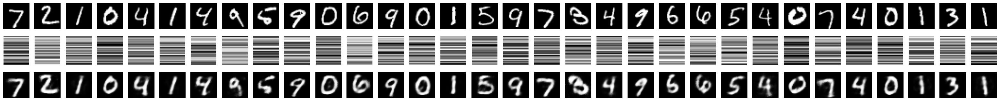

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
from scipy.stats import entropy
#tf.compat.v1.enable_eager_execution()

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_SPACE_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

# Generate the NumPy arrays with the data.
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
with np.load(path) as data:
    x_train = data['x_train']
    y_train = data['x_train']
    x_test = data['x_test']
    y_test = data['x_test']

# Generate the pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_DS = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Define how to use the datasets, preprocess, etc.

def process_x(image, label):
    processed_img = tf.reshape(image, (img_height * img_width, 1))
    processed_img = tf.cast(processed_img, tf.float32) / 255.
    return processed_img, label

def process_y(image, label):
    # The last layer of the network is a dense layer and TensorFlow imposes 1D.
    return image, tf.reshape(image, (img_height * img_width, 1))

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(process_x)
train_DS = train_DS.map(process_y)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(process_x)
test_DS = test_DS.map(process_y)
test_DS = test_DS.batch(BATCH_SIZE)

class NoisyDense(keras.layers.Layer):

    def __init__(self, units=32, input_dim=32, activation="relu", **kwargs):
        super(NoisyDense, self).__init__(**kwargs)
        w_init = tf.random_normal_initializer()
        self.w = tf.Variable(
            initial_value=w_init(shape=(input_dim, units), dtype="float32"),
            trainable=True,
        )
        b_init = tf.zeros_initializer()
        self.b = tf.Variable(
            initial_value=b_init(shape=(units,), dtype="float32"), trainable=True
        )
        self.quantized_vals = 0

    #@tf.function
    def call(self, inputs):
        outputs = tf.matmul(inputs, self.w) + self.b
        noise = tf.random.uniform(shape=tf.shape(outputs), minval=-.5, maxval=.5)
        #quantized_sums_01 = weighted_sums
        outputs += noise
        #print(tf.reduce_max(weighted_sums))
        #outputs = tf.keras.activations.tanh(outputs)
        #outputs = tf.saturate_cast(tf.round(outputs * 255.), tf.int16)
        #quantized_sums_8b = tf.saturate_cast(tf.round(weighted_sums * 255.), tf.int16)
        self.quantized_vals = outputs
        #print(len(self.quantized_vals))
        #outputs = tf.cast(outputs, tf.float32) / 255.0
        #activations = tf.keras.activations.relu(quantized_sums_01)
        #activations = quantized_sums_01
        #print(len(activations))
        #tf.print(activations)
        #print(type(activations))
        #print("act[0][0] =",activations[0][0])
        #print(activations.numpy())
        #activations_entropy = entropy(tf.make_ndarray(activations), base=2)
        #self.codestream_length = activations_entropy * tf.size(activations)
        return outputs

    def get_vals(self):
        return self.quantized_vals

# Define the autoencoder.
input_layer = keras.Input(
    shape=(img_length,),
    name="inputs")
hidden_layer = NoisyDense(
    units=LATENT_SPACE_LENGTH,
    input_dim = img_length,
    activation="relu",
    name="hidden"
    )(input_layer)
output_layer = layers.Dense(
    img_length,
    activation="sigmoid",
    name="outputs")(hidden_layer)

autoencoder = keras.Model(
    input_layer,
    output_layer)

# To see the latents (content of the hidden layer), we define a new "model" with only the encoder.
encoder = keras.Model(
    input_layer,
    hidden_layer)

autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy", run_eagerly=True
)

autoencoder.summary()

# Train.
EPOCHS = 1
ITERATIONS = 1
plt.gray()
for i in range(ITERATIONS):

    autoencoder.fit(
        train_DS,
        epochs=EPOCHS,
        validation_data=test_DS)

    batch_vals = autoencoder.get_layer("hidden").get_vals()
    print("batch_vals =", batch_vals)
    for j in range(BATCH_SIZE):
        try:
            vals = batch_vals[j].numpy() + 512
            print(entropy(vals, base=2))
        except:
            pass
        #print(vals)

    #print("2", autoencoder.get_layer("hidden").variables[1])

    # Show the learning.
    plt.figure(figsize=(40,4))

    n = len(train_DS)
    if n > 32:
        n = 32

    # Show the originals (using the pipeline).
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(3, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                #plt.gray()
                plt.axis("off")
            except:
                pass

    # See the latent space (as images).
    latent_imgs = encoder.predict(test_DS)
    print("type latent", type(latent_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(resize(latent_imgs[i],(LATENT_SPACE_LENGTH, img_width)))
        plt.axis("off")

    # See the reconstructions.
    reconstructed_imgs = autoencoder.predict(test_DS)
    print(type(reconstructed_imgs))
    for i in range(n):
        ax = plt.subplot(3, n, i + 1 + 2*n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.axis("off")

    plt.show()

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize
import tensorflow_compression as tfc

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

LATENT_LENGTH = 32

img_width = 28
img_height = 28
img_length = img_height * img_width

training_DS, test_DS = tfds.load(
    "mnist",
    split=["train", "test"],
    shuffle_files=True,
    as_supervised=True,
    with_info=False,
)

# Define the autoencoder.
def analyze(latent_length):
  return tf.keras.Sequential([
      tf.keras.layers.Conv2D(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2D(
          50, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(
          img_length, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          latent_length, use_bias=True, activation=None, name="fc_2"),
  ], name="analysis_transform")

def synthesize():
  return tf.keras.Sequential([
      tf.keras.layers.Dense(
          500, use_bias=True, activation="leaky_relu", name="fc_1"),
      tf.keras.layers.Dense(
          2450, use_bias=True, activation="leaky_relu", name="fc_2"),
      tf.keras.layers.Reshape((7, 7, 50)),
      tf.keras.layers.Conv2DTranspose(
          20, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_1"),
      tf.keras.layers.Conv2DTranspose(
          1, 5, use_bias=True, strides=2, padding="same",
          activation="leaky_relu", name="conv_2"),
  ], name="synthesis_transform")

class MNISTCompressionTrainer(tf.keras.Model):
  """Model that trains a compressor/decompressor for MNIST."""

  def __init__(self, latent_dims):
    super().__init__()
    self.analysis_transform = analyze(latent_dims)
    self.synthesis_transform = synthesize()
    self.prior_log_scales = tf.Variable(tf.zeros((latent_dims,)))

  @property
  def prior(self):
    return tfc.NoisyLogistic(loc=0., scale=tf.exp(self.prior_log_scales))

  def call(self, x, training):
    """Computes rate and distortion losses."""
    # Ensure inputs are floats in the range (0, 1).
    x = tf.cast(x, self.compute_dtype) / 255.
    x = tf.reshape(x, (-1, 28, 28, 1))

    # Compute latent space representation y, perturb it and model its entropy,
    # then compute the reconstructed pixel-level representation x_hat.
    y = self.analysis_transform(x)
    entropy_model = tfc.ContinuousBatchedEntropyModel(
        self.prior, coding_rank=1, compression=False)
    y_tilde, rate = entropy_model(y, training=training)
    x_tilde = self.synthesis_transform(y_tilde)

    # Average number of bits per MNIST digit.
    rate = tf.reduce_mean(rate)

    # Mean absolute difference across pixels.
    distortion = tf.reduce_mean(abs(x - x_tilde))

    return dict(rate=rate, distortion=distortion)

def pass_through_loss(_, x):
  # Since rate and distortion are unsupervised, the loss doesn't need a target.
  return x

def make_mnist_compression_trainer(lmbda, latent_dims=50):
  trainer = MNISTCompressionTrainer(latent_dims)
  trainer.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    # Just pass through rate and distortion as losses/metrics.
    loss=dict(rate=pass_through_loss, distortion=pass_through_loss),
    metrics=dict(rate=pass_through_loss, distortion=pass_through_loss),
    loss_weights=dict(rate=1., distortion=lmbda),
  )
  return trainer

def add_rd_targets(image, label):
  # Training is unsupervised, so labels aren't necessary here. However, we
  # need to add "dummy" targets for rate and distortion.
  return image, dict(rate=0., distortion=0.)

def train_mnist_model(lmbda):
  trainer = make_mnist_compression_trainer(lmbda)
  trainer.fit(
      training_DS.map(add_rd_targets).batch(128).prefetch(8),
      epochs=1,
      validation_data=test_DS.map(add_rd_targets).batch(128).cache(),
      validation_freq=1,
      verbose=1,
  )
  return trainer

trainer = train_mnist_model(lmbda=2000)
trainer.summary()

class MNISTCompressor(tf.keras.Model):
  """Compresses MNIST images to strings."""

  def __init__(self, analysis_transform, entropy_model):
    super().__init__()
    self.analysis_transform = analysis_transform
    self.entropy_model = entropy_model

  def call(self, x):
    # Ensure inputs are floats in the range (0, 1).
    x = tf.cast(x, self.compute_dtype) / 255.
    y = self.analysis_transform(x)
    # Also return the exact information content of each digit.
    _, bits = self.entropy_model(y, training=False)
    return self.entropy_model.compress(y), bits

class MNISTDecompressor(tf.keras.Model):
  """Decompresses MNIST images from strings."""

  def __init__(self, entropy_model, synthesis_transform):
    super().__init__()
    self.entropy_model = entropy_model
    self.synthesis_transform = synthesis_transform

  def call(self, string):
    y_hat = self.entropy_model.decompress(string, ())
    x_hat = self.synthesis_transform(y_hat)
    # Scale and cast back to 8-bit integer.
    return tf.saturate_cast(tf.round(x_hat * 255.), tf.uint8)

def make_mnist_codec(trainer, **kwargs):
  # The entropy model must be created with `compression=True` and the same
  # instance must be shared between compressor and decompressor.
  entropy_model = tfc.ContinuousBatchedEntropyModel(
      trainer.prior, coding_rank=1, compression=True, **kwargs)
  compressor = MNISTCompressor(trainer.analysis_transform, entropy_model)
  decompressor = MNISTDecompressor(entropy_model, trainer.synthesis_transform)
  return compressor, decompressor

compressor, decompressor = make_mnist_codec(trainer)

(originals, _), = test_DS.batch(16).skip(3).take(1)
strings, entropies = compressor(originals)

print(f"String representation of first digit in hexadecimal: 0x{strings[0].numpy().hex()}")
print(f"Number of bits actually needed to represent it: {entropies[0]:0.2f}")
reconstructions = decompressor(strings)
print(type(reconstructions))


def display_digits(originals, strings, entropies, reconstructions):
  """Visualizes 16 digits together with their reconstructions."""
  fig, axes = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(12.5, 5))
  axes = axes.ravel()
  for i in range(len(axes)):
    image = tf.concat([
        tf.squeeze(originals[i]),
        tf.zeros((28, 14), tf.uint8),
        tf.squeeze(reconstructions[i]),
    ], 1)
    axes[i].imshow(image)
    axes[i].text(
        .5, .5, f"→ 0x{strings[i].numpy().hex()} →\n{entropies[i]:0.2f} bits",
        ha="center", va="top", color="white", fontsize="small",
        transform=axes[i].transAxes)
    axes[i].axis("off")
  plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)

#display_digits(originals, strings, entropies, reconstructions)

#input()

# Show the learning.
plt.figure(figsize=(40,4))

n = len(originals)
if n > 32:
    n = 32

# Show the originals (using the pipeline).
for i in range(n):
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(originals[i])
    plt.axis("off")

# See the latent space (as images).
#latent_imgs = encoder.predict(test_DS)
#for i in range(n):
#    ax = plt.subplot(3, n, i + 1 + n)
#    plt.imshow(resize(latent_imgs[i],(LATENT_SPACE_LENGTH, img_width)))
#    plt.axis("off")

# See the reconstructions.
for i in range(n):
    ax = plt.subplot(3, n, i + 1 + 1*n)
    plt.imshow(reconstructions[i])
    plt.axis("off")

plt.show()

ModuleNotFoundError: ignored

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_compression as tfc
import tensorflow_datasets as tfds

In [ ]:
while True:
    time.sleep(1)

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize

LATENT_SPACE_LENGTH = 32

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'mnist'
#DATASET = 'fashion_mnist'
#URL = "https://github.com/zalandoresearch/fashion-mnist/blob/master/data/fashion/train-images-idx3-ubyte.gz"

img_width = 28
img_height = 28
img_length = img_height * img_width

# Generate the NumPy arrays with the data.
DATA_URL = f'https://storage.googleapis.com/tensorflow/tf-keras-datasets/{DATASET}.npz'
path = tf.keras.utils.get_file(f'{DATASET}.npz', DATA_URL)
with np.load(path) as data:
    train_examples = data['x_train']
    train_labels = data['y_train']
    test_examples = data['x_test']
    test_labels = data['y_test']

print(type(train_examples), type(train_labels))
print(len(train_examples), len(test_labels))

# Generate the pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((train_examples, train_labels))
test_DS = tf.data.Dataset.from_tensor_slices((test_examples, test_labels))

print(type(train_DS))

# Define how to use the datasets, preprocess, etc.

def normalize_img(image, label):
    processed_img = tf.cast(image, tf.float32) / 255.
    print(processed_img.shape)
    return processed_img, label

def get_image(image, label):
    return image, tf.reshape(image, (img_height * img_width, 1))

BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(normalize_img)
train_DS = train_DS.map(get_image)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(normalize_img)
test_DS = test_DS.map(get_image)
test_DS = test_DS.batch(BATCH_SIZE)

# Define the autoencoder.
img_pixels = img_height * img_width
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(img_height, img_width)),
  tf.keras.layers.Dense(LATENT_SPACE_LENGTH, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

# Train.
EPOCHS = 1
ITERATIONS = 5
for i in range(ITERATIONS):

    model.fit(
        train_DS,
        epochs=EPOCHS,
        validation_data=test_DS)

    # Predict.
    reconstructed_imgs = model.predict(test_DS)

    # Show the predictions.
    plt.figure(figsize=(40,4))

    n = len(train_DS)
    if n > 32:
        n = 32

    ## original
    for images in test_DS.take(1):
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    # latent (as an image)
    '''
    for i in range(n):
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(resize(latents[i],(HIDDEN_SIZE, img_width)))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    '''

    ## reconstruction
    for i in range(n):
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.gray()
        plt.axis("off")

    plt.show()

## Using 3 hidden layer

    Input -> hidden_0 -> latent -> hidden_1 -> Output
    28x28    10x10       32        10x10       28x28

## Ignore the rest

In [ ]:
# Autoencoding example (feeding pipeline (tf.data.Dataset) with NumPy arrays)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
from skimage.transform import resize

# Generate the NumPy arrays with the data.
DATA_URL = 'https://storage.googleapis.com/tensorflow/tf-keras-datasets/mnist.npz'
path = tf.keras.utils.get_file('mnist.npz', DATA_URL)
with np.load(path) as data:
    train_examples = data['x_train']
    train_labels = data['y_train']
    test_examples = data['x_test']
    test_labels = data['y_test']

print(type(train_examples), type(train_labels))
print(len(train_examples), len(test_labels))

# Generate the pipelines.
train_DS = tf.data.Dataset.from_tensor_slices((train_examples, train_labels))
test_DS = tf.data.Dataset.from_tensor_slices((test_examples, test_labels))

print(type(train_DS))

# Define how to use the datasets, preprocess, etc.

def normalize_img(image, label):
    processed_img = tf.cast(image, tf.float32) / 255.
    print(processed_img.shape)
    return processed_img, label

def get_image(image, label):
    return image, tf.reshape(image, (28*28, 1))

BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 100
train_DS = train_DS.map(normalize_img)
train_DS = train_DS.map(get_image)
train_DS = train_DS.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_DS = test_DS.map(normalize_img)
test_DS = test_DS.map(get_image)
test_DS = test_DS.batch(BATCH_SIZE)

# Define the autoencoder.
img_pixels = 28*28
HIDDEN_SIZE = 32
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

# Train.
EPOCHS = 10
model.fit(
    train_DS,
    epochs=EPOCHS,
    validation_data=test_DS)

# Predict.
reconstructed_imgs = model.predict(test_DS)

# Show the predictions.
img_width = 28
img_height = 28
plt.figure(figsize=(40,4))

n = len(train_DS)
if n > 32:
    n = 32

## original
for images in test_DS.take(1):
    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        try:
            image = images[0][i].numpy()
            image *= 255
            image = image.astype("uint8").reshape(img_height, img_width)
            plt.imshow(image)
            plt.gray()
            plt.axis("off")
        except:
            pass

## reconstruction
for i in range(n):
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
    plt.gray()
    plt.axis("off")

plt.show()

In [ ]:
!pip install -q tensorflow-datasets
#!pip install tfds-nightly

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

In [ ]:
EPOCHS = 10
BATCH_SIZE = 64


# Configure the size of the hidden layer.
HIDDEN_SIZE = 32

In [ ]:
# Load the datasets (notice that we will use x_train = y_train and x_test = y_test)
(x_train, _), (x_test, _) = mnist.load_data()
print(x_train.shape, x_test.shape, type(x_train))

In [ ]:
# Gray-scale images ranges betwen [0, 255]. Neurons must work with values between [0, 1]
x_train = x_train.astype("float32") / 255.
x_test = x_test.astype("float32") / 255.

In [ ]:
img_height = x_train[0].shape[0]
img_width = x_train[0].shape[1]
img_pixels = img_width*img_height
print("The shape of the images is:", img_height, "x", img_width)

In [ ]:
# Our layers will be 1D. The images must be reshaped.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print(x_train.shape, x_test.shape)

In [ ]:
# Define the network (2 layers), connecting them sequentially:
# flatten(input_image, 28*28) -> hidden_layer(HIDDEN_SIZE) -> output_layer(28*28)
input_layer = keras.Input(shape=(img_pixels,))
hidden_layer = layers.Dense(HIDDEN_SIZE, activation="relu")(input_layer)
output_layer = layers.Dense(img_pixels, activation="sigmoid")(hidden_layer)
autoencoder = keras.Model(input_layer, output_layer)

In [ ]:
# Compile the network.
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")

In [ ]:
autoencoder.summary()

In [ ]:
# Train the network.
autoencoder.fit(x=x_train, y=x_train,
                epochs=EPOCHS, batch_size=BATCH_SIZE, shuffle=True,
                validation_data=(x_test, x_test))

In [ ]:
# Apply the autoencoder to the test dataset.
reconstructed_imgs = autoencoder.predict(x_test)

In [ ]:
# Show some reconstructions.
n = 10
plt.figure(figsize=(40,4))
for i in range(n):
  # original
  ax = plt.subplot(2, n, i+1)
  plt.imshow(x_test[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # reconstruction
  ax = plt.subplot(2, n, i+1+n)
  plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
# To see the latents (content of the hidden layer), we define a new "model" with only the encoder.
encoder = keras.Model(input_layer, hidden_layer)

In [ ]:
latents = encoder.predict(x_test)

In [ ]:
from skimage.transform import resize
n = 10
plt.figure(figsize=(40,4))
for i in range(n):
  # original
  ax = plt.subplot(2, n, i+1)
  plt.imshow(x_test[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # latent (as an image)
  ax = plt.subplot(2, n, i+1+n)
  plt.imshow(resize(latents[i],(HIDDEN_SIZE, img_width)))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

#### Images of any shape and the training dataset does not fit in memory

In [ ]:
!pip install -q tensorflow-datasets
#!pip install tfds-nightly

In [ ]:
import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

In [ ]:
# Show available datasets in TensorFlow.
#tfds.list_builders()

In [ ]:
EPOCHS = 10
BATCH_SIZE = 64 # -1 -> All the dataset in memory!

# https://www.tensorflow.org/datasets/catalog/
DATASET = 'clic'  # 7.48 GiB :-()

In [ ]:
train_DS = tfds.load(
    name=DATASET,
    split='train',
    batch_size=BATCH_SIZE,
    shuffle_files=True) # During training, it's important to shuffle the data well - poorly shuffled data can result in lower training accuracy (https://www.tensorflow.org/datasets/performances).

test_DS = tfds.load(
    name=DATASET,
    split="test",
    batch_size=BATCH_SIZE)

In [ ]:
#....

In [ ]:
train_DS

In [ ]:
# Clustering example

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
(ds_train, ds_test), ds_info = tfds.load(
    'mnist',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

print(ds_train, len(ds_train))

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  #print(image)
  return tf.cast(image, tf.float32) / 255., label

ds_train = ds_train.map(
    normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.cache()
ds_train = ds_train.shuffle(ds_info.splits['train'].num_examples)
ds_train = ds_train.batch(32)
ds_train = ds_train.prefetch(tf.data.AUTOTUNE)
print(ds_train, len(ds_train))

ds_test = ds_test.map(
    normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(32)
ds_test = ds_test.cache()
ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(28*28)
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy()],
)

model.summary()

model.fit(
    ds_train,
    epochs=6,
    validation_data=ds_test,
)

reconstructed_imgs = model.predict(ds_test)
# Show some reconstructions.
n = 10

img_width = 28
img_height = 28

plt.figure(figsize=(40,4))
for i in range(n):
  # original
  ax = plt.subplot(2, n, i+1)
  #plt.imshow(np.squeeze(ds_test)[i].reshape(img_height, img_width))
  plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # reconstruction
  ax = plt.subplot(2, n, i+1+n)
  plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
# Autoencoding example (using a data pipeline)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

(ds_train, ds_test), ds_info = tfds.load(
    'mnist',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True, # Images are labeled
    with_info=True
)
print(ds_train, len(ds_train))

def normalize_img2(image, label):
    """Normalizes images: `uint8` -> `float32`."""
    #print(image['image'].shape)
    #print(image)
    #return image, label
    return tf.cast(image, tf.float32) / 255., label

def get_image(image, label):
    return image, tf.reshape(image, (28*28, 1))

ds_train = ds_train.map(
    normalize_img2, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.cache()
ds_train = ds_train.shuffle(ds_info.splits['train'].num_examples)
ds_train = ds_train.batch(32)
ds_train = ds_train.prefetch(tf.data.AUTOTUNE)
#ds_train = ds_train.map(lambda x: x[0])

print(ds_train, len(ds_train))

ds_test = ds_test.map(
    normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(32)
ds_test = ds_test.cache()
ds_test = ds_test.prefetch(tf.data.AUTOTUNE)
#ds_test = ds_test.map(lambda x: x[0], ds_test)

print(ds_test, len(ds_test))

#x_test = list(map(lambda x: x[0], ds_test))
# = ds_test["image"]

img_pixels = 28*28

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

model.fit(
    ds_train,
    epochs=EPOCHS,
    validation_data=ds_test)

reconstructed_imgs = model.predict(ds_test)

n = 10
plt.figure(figsize=(40,4))

# original
for images in ds_test.take(1):
    print(len(images))
    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        image = images[0][i].numpy()
        image *= 255
        image = image.astype("uint8").reshape(28, 28)
        plt.imshow(image)
        plt.gray()
        plt.axis("off")

# reconstruction
for i in range(n):
  ax = plt.subplot(2, n, i + 1 + n)
  plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

plt.show()

In [ ]:
# Autoencoding example (iterative)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

img_pixels = 28*28
HIDDEN_SIZE = 32
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  #print(image)
  return tf.cast(image, tf.float32) / 255., label

def get_image(image, label):
    return image, tf.reshape(image, (28*28, 1))

img_width = 28
img_height = 28
ITERATIONS = 20
for i in range(ITERATIONS):

    (ds_train, ds_test), ds_info = tfds.load(
        'mnist',
        split=['train', 'test'],
        shuffle_files=True,
        as_supervised=True, # Images are labeled
        with_info=True)

    ds_train = ds_train.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.cache()
    ds_train = ds_train.shuffle(
        ds_info.splits['train'].num_examples,
        reshuffle_each_iteration=True)
    ds_train = ds_train.batch(32)
    ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

    ds_test = ds_test.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.batch(32)
    ds_test = ds_test.cache()
    #ds_test = ds_test.shuffle(ds_info.splits['test[:10%]'].num_examples,
    #    reshuffle_each_iteration=True)
    ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

    print("len(train_DS) =", len(ds_train))
    print("len(test_DS) =", len(ds_test))

    n = len(ds_train)
    if n > 10:
        n = 10
    for images in ds_train.take(1):
        print(len(images))
        for i in range(min(len(ds_train), n)):
            ax = plt.subplot(2, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    EPOCHS = 1
    model.fit(
        ds_train,
        epochs=EPOCHS,
        validation_data=ds_test)

    reconstructed_imgs = model.predict(ds_test)

    plt.figure(figsize=(40,4))
    #plt.figure()

    # original
    for images in ds_test.take(1):
        #print(len(images))
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    # reconstruction
    for i in range(n):
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.gray()
        #ax.get_xaxis().set_visible(False)
        #ax.get_yaxis().set_visible(False)
        plt.axis("off")

    plt.show()

In [ ]:
# Autoencoding example (iterative, minimal)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

img_pixels = 28*28
HIDDEN_SIZE = 32
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  #print(image)
  return tf.cast(image, tf.float32) / 255., label

def get_image(image, label):
    return image, tf.reshape(image, (28*28, 1))

img_width = 28
img_height = 28
ITERATIONS = 20
for i in range(ITERATIONS):

    (ds_train, ds_test), ds_info = tfds.load(
        'mnist',
        split=['train[:1000]', 'test'],
        shuffle_files=True,
        as_supervised=True, # Images are labeled
        with_info=True)

    ds_train = ds_train.map(normalize_img)
    ds_train = ds_train.map(get_image)
    ds_train = ds_train.cache() # Do not put me in the last position
    ds_train = ds_train.shuffle(
        ds_info.splits['train'].num_examples,
        reshuffle_each_iteration=True)
    ds_train = ds_train.batch(32)

    ds_test = ds_test.map(normalize_img)
    ds_test = ds_test.map(get_image)
    ds_test = ds_test.shuffle(
        ds_info.splits['test'].num_examples,
        reshuffle_each_iteration=True)
    ds_test = ds_test.batch(32)
    ds_test = ds_test.cache() # Put me in the last position

    print("len(train_DS) =", len(ds_train))
    print("len(test_DS) =", len(ds_test))

    n = len(ds_train)
    if n > 32:
        n = 32

    plt.figure(figsize=(40,2))

    for images in ds_train.take(1):
        print(len(images))
        for i in range(min(len(ds_train), n)):
            ax = plt.subplot(1, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    EPOCHS = 1
    model.fit(
        ds_train,
        epochs=EPOCHS,
        validation_data=ds_test)

    reconstructed_imgs = model.predict(ds_test)

    plt.figure(figsize=(40,4))

    # original
    for images in ds_test.take(1):
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    # reconstruction
    for i in range(n):
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.gray()
        plt.axis("off")

    plt.show()

In [ ]:
# Autoencoding example (iterative, minimal, clic) FREEZES :-(

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split

img_pixels = 28*28
HIDDEN_SIZE = 32
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def normalize_img(image):
    #print(type(image['image']))
    processed_img = tf.cast(image['image'], tf.float32) / 255.
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    processed_img = tf.image.resize(processed_img, [28, 28])
    if processed_img.get_shape().as_list()[2] > 1:
        processed_img = tf.image.rgb_to_grayscale(processed_img)
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    return processed_img

def get_image(image):
    return image, tf.reshape(image, (28*28, 1))

img_width = 28
img_height = 28
ITERATIONS = 20
for i in range(ITERATIONS):

    (ds_train, ds_test), ds_info = tfds.load(
        'clic',
        split=['train[:32]', 'test[:32]'],
        shuffle_files=True,
        #as_supervised=True, # Images are labeled
        with_info=True)

    ds_train = ds_train.map(normalize_img)
    ds_train = ds_train.map(get_image)
    ds_train = ds_train.cache() # Do not put me in the last position
    ds_train = ds_train.shuffle(
        ds_info.splits['train'].num_examples,
        reshuffle_each_iteration=True)
    ds_train = ds_train.batch(32)

    ds_test = ds_test.map(normalize_img)
    ds_test = ds_test.map(get_image)
    ds_test = ds_test.shuffle(
        ds_info.splits['test'].num_examples,
        reshuffle_each_iteration=True)
    ds_test = ds_test.batch(32)
    ds_test = ds_test.cache() # Put me in the last position

    print("len(train_DS) =", len(ds_train))
    print("len(test_DS) =", len(ds_test))

    n = len(ds_train)
    if n > 32:
        n = 32

    plt.figure(figsize=(40,2))

    for images in ds_train.take(1):
        print(len(images))
        for i in range(min(len(ds_train), n)):
            ax = plt.subplot(1, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    EPOCHS = 1
    model.fit(
        ds_train,
        epochs=EPOCHS,
        validation_data=ds_test)

    reconstructed_imgs = model.predict(ds_test)

    plt.figure(figsize=(40,4))

    # original
    for images in ds_test.take(1):
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            try:
                image = images[0][i].numpy()
                image *= 255
                image = image.astype("uint8").reshape(img_height, img_width)
                plt.imshow(image)
                plt.gray()
                plt.axis("off")
            except:
                pass

    # reconstruction
    for i in range(n):
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
        plt.gray()
        plt.axis("off")

    plt.show()

In [ ]:
# Using clic images (freezes)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
import time

HIDDEN_SIZE = 256
img_pixels = 64*64

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(64, 64)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def process_dataset(image):
    #print(type(image['image']))
    processed_img = tf.cast(image['image'], tf.float32) / 255.
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    processed_img = tf.image.resize(processed_img, [64, 64])
    if processed_img.get_shape().as_list()[2] > 1:
        processed_img = tf.image.rgb_to_grayscale(processed_img)
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    return processed_img

def define_y(image):
    return image, tf.reshape(image, (64*64, 1))

EPOCHS = 1
ITERATIONS = 100
for i in range(ITERATIONS):
    print("iteration", i)
    (ds_train, ds_test), ds_info = tfds.load(
        'clic',
        split=['train[:128]', 'test[:16]'],
        shuffle_files=True, # Shuffle the files between each epoch.
        with_info=True)

    ds_train = ds_train.map(process_dataset)
    #ds_train = ds_train.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.map(define_y)
    #ds_train = ds_train.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    #ds_train = ds_train.cache()
    #ds_train = ds_train.shuffle(
    #    ds_info.splits['train'].num_examples,
    #    reshuffle_each_iteration=True)
    ds_train = ds_train.batch(32)
    #ds_train = ds_train.batch(32, drop_remainder=True)
    #ds_train = ds_train.batch(1024, drop_remainder=True)
    #ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

    ds_test = ds_test.map(process_dataset)
    #ds_test = ds_test.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.map(define_y)
    #ds_test = ds_test.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.batch(32)
    #ds_test = ds_test.batch(1024, drop_remainder=True)
    #ds_test = ds_test.cache()
    #ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

    model.fit(
        ds_train,
        epochs=EPOCHS,#//10#,
        #shuffle='batch',
        #verbose=2,
        validation_data=ds_test
    )
    #model.save("model")
    #model.load("model")

    reconstructed_imgs = model.predict(ds_test)

    n = 10
    plt.figure(figsize=(40,4))

    # original
    for images in ds_test.take(1):
        print(len(images))
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            image = images[0][i].numpy()
            image *= 255
            image = image.astype("uint8").reshape(64, 64)
            plt.imshow(image)
            plt.gray()
            plt.axis("off")

    # reconstruction
    for i in range(n):
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(reconstructed_imgs[i].reshape(64, 64))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

    plt.show()


In [ ]:
# Using clic images (save and load)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
import time

HIDDEN_SIZE = 256
img_pixels = 64*64

#input_layer = keras.Input(shape=(64*64,))
#hidden_layer = layers.Dense(HIDDEN_SIZE, activation="relu")(input_layer)
#output_layer = layers.Dense(img_pixels, activation="sigmoid")(hidden_layer)
#model = keras.Model(input_layer, output_layer)
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(64, 64)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def process_dataset(image):
    #print(type(image['image']))
    processed_img = tf.cast(image['image'], tf.float32) / 255.
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    processed_img = tf.image.resize(processed_img, [64, 64])
    if processed_img.get_shape().as_list()[2] > 1:
        processed_img = tf.image.rgb_to_grayscale(processed_img)
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    #processed_img = tf.image.resize(processed_img, [64*64, 1])
    return processed_img

def define_y(image):
    return image, tf.reshape(image, (64*64, 1))

EPOCHS = 1
ITERATIONS = 100
for i in range(ITERATIONS):
    print("iteration", i)
    (ds_train, ds_test), ds_info = tfds.load(
        'clic',
        split=['train[:128]', 'test[:16]'],
        shuffle_files=True, # Shuffle the files between each epoch.
        with_info=True)

    ds_train = ds_train.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.cache()
    ds_train = ds_train.shuffle(
        ds_info.splits['train'].num_examples,
        reshuffle_each_iteration=True)
    ds_train = ds_train.batch(32)
    #ds_train = ds_train.batch(1024, drop_remainder=True)
    ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

    ds_test = ds_test.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.batch(32)
    #ds_test = ds_test.batch(1024, drop_remainder=True)
    ds_test = ds_test.cache()
    ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

    model.fit(
        ds_train,
        epochs=EPOCHS,#//10#,
        #shuffle='batch',
        validation_data=ds_test
    )
    keras.models.save_model(model, "model")

    model = tf.keras.models.Sequential([
      tf.keras.layers.Flatten(input_shape=(64, 64)),
      tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
      tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(0.001),
        loss="binary_crossentropy"
    )

    model = keras.models.load_model("model")

    #model.load("model")

    reconstructed_imgs = model.predict(ds_test)

    n = 10
    plt.figure(figsize=(40,4))

    # original
    for images in ds_test.take(1):
        print(len(images))
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            image = images[0][i].numpy()
            image *= 255
            image = image.astype("uint8").reshape(64, 64)
            plt.imshow(image)
            plt.gray()
            plt.axis("off")

    # reconstruction
    for i in range(n):
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(reconstructed_imgs[i].reshape(64, 64))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

    plt.show()


In [ ]:
# Using clic images (using a custom callback to visualize the training dataset after each epoch)

import keras
from keras import layers
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras.utils import Sequence
from skimage.io import imread
import math
from sklearn.model_selection import train_test_split
import time

HIDDEN_SIZE = 256
img_pixels = 64*64

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(64, 64)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

def process_dataset(image):
    #print(type(image['image']))
    processed_img = tf.cast(image['image'], tf.float32) / 255.
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    processed_img = tf.image.resize(processed_img, [64, 64])
    if processed_img.get_shape().as_list()[2] > 1:
        processed_img = tf.image.rgb_to_grayscale(processed_img)
    #print(processed_img.get_shape().as_list(), processed_img.dtype)
    return processed_img

def define_y(image):
    return image, tf.reshape(image, (64*64, 1))

EPOCHS = 100

def load_data():
    (ds_train, ds_test), ds_info = tfds.load(
        'clic',
        split=['train[:10]', 'test[:10]'],
        shuffle_files=True, # Shuffle the files between each epoch.
        with_info=True)

    ds_train = ds_train.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    ds_train = ds_train.cache()
    ds_train = ds_train.shuffle(
        ds_info.splits['train'].num_examples,
        reshuffle_each_iteration=True)
    ds_train = ds_train.batch(10)
    #ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

    n = 10
    for images in ds_train.take(1):
        print(len(images))
        for i in range(n):
            ax = plt.subplot(2, n, i + 1)
            image = images[0][i].numpy()
            image *= 255
            image = image.astype("uint8").reshape(64, 64)
            plt.imshow(image)
            plt.gray()
            plt.axis("off")
    plt.show()

    ds_test = ds_test.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
    ds_test = ds_test.batch(10)
    ds_test = ds_test.cache()
    #ds_test = ds_test.prefetch(tf.data.AUTOTUNE)
    return ds_train, ds_test

ds_train, ds_test = load_data()

class CustomCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        load_data()
        keys = list(logs.keys())
        print("End epoch {} of training; got log keys: {}".format(epoch, keys))

model.fit(
    ds_train,
    epochs=EPOCHS,#//10#,
    shuffle='batch',
    validation_data=ds_test,
    callbacks=[CustomCallback()]
)

reconstructed_imgs = model.predict(ds_test)

n = 10
plt.figure(figsize=(40,4))

# original
for images in ds_test.take(1):
    print(len(images))
    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        image = images[0][i].numpy()
        image *= 255
        image = image.astype("uint8").reshape(64, 64)
        plt.imshow(image)
        plt.gray()
        plt.axis("off")

# reconstruction
for i in range(n):
  ax = plt.subplot(2, n, i + 1 + n)
  plt.imshow(reconstructed_imgs[i].reshape(64, 64))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

plt.show()


In [ ]:

print(tf.__version__)
(ds_train, ds_test), ds_info = tfds.load(
    'clic',
    split=['train[:4%]', 'test[:1%]'],
    shuffle_files=True,
    with_info=True
)
print(ds_train, len(ds_train))

def process_dataset(image):
    print(type(image['image']))
    processed_img = tf.cast(image['image'], tf.float32) / 255.
    print(processed_img.get_shape().as_list(), processed_img.dtype)
    processed_img = tf.image.resize(processed_img, [64, 64])
    if processed_img.get_shape().as_list()[2] > 1:
        processed_img = tf.image.rgb_to_grayscale(processed_img)
    print(processed_img.get_shape().as_list(), processed_img.dtype)
    return processed_img

def define_y(image):
    return image, tf.reshape(image, (64*64, 1))

#ds_train = ds_train.map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.cache()
ds_train = ds_train.shuffle(ds_info.splits['train'].num_examples)
ds_train = ds_train.batch(1024)
ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

plt.figure(figsize=(10, 10))
#class_names = ds_train.class_names

print("take=", ds_train.take(1))

for images in ds_train.take(1):
    print(len(images))
    for i in range(32):
        #print(len(images[i]))
        ax = plt.subplot(6, 6, i + 1)
        # plt.imshow(images[i].numpy().astype("uint8"))
        image = images[0][i].numpy()
        image *= 255
        image = image.astype("uint8").reshape(64,64)
        #print(image.shape)
        plt.imshow(image)
        plt.gray()
        #plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
print(ds_train, len(ds_train))

ds_test = ds_test.map(process_dataset, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.map(define_y, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(1024)
ds_test = ds_test.cache()
ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

print(ds_test, len(ds_test))

img_pixels = 64*64

In [ ]:
HIDDEN_SIZE = 256

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(64, 64)),
  tf.keras.layers.Dense(HIDDEN_SIZE, activation='relu'),
  tf.keras.layers.Dense(img_pixels, activation="sigmoid"),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="binary_crossentropy"
)

model.summary()

In [ ]:
model.fit(ds_train,
    epochs=EPOCHS,
    validation_data=ds_test)

In [ ]:
reconstructed_imgs = model.predict(ds_test)

In [ ]:
len(reconstructed_imgs)

In [ ]:
reconstructed_imgs

In [ ]:
type(reconstructed_imgs)

In [ ]:
# Show some reconstructions.
n = 4

img_width = 64
img_height = 64

for images in ds_train.take(1):
    print(len(images))
    for i in range(32):
        #print(len(images[i]))
        ax = plt.subplot(6, 6, i + 1)
        # plt.imshow(images[i].numpy().astype("uint8"))
        image = images[0][i].numpy()
        image *= 255
        image = image.astype("uint8").reshape(64,64)
        #print(image.shape)
        plt.imshow(image)
        #plt.title(class_names[labels[i]])
        plt.gray()
        plt.axis("off")

for i in range(n):
  # reconstruction
  ax = plt.subplot(2, n, i+1+n)
  plt.imshow(reconstructed_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

<PrefetchDataset element_spec=(TensorSpec(shape=(28, 28, 1), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))> 60000
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None)}> 163

In [ ]:
64*64

<PrefetchDataset element_spec=(TensorSpec(shape=(28, 28, 1), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
    
<PrefetchDataset element_spec={'image': TensorSpec(shape=(28, 28, 1), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
    
<PrefetchDataset element_spec=(TensorSpec(shape=(28, 28, 1), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
autoencoder.fit(train_DS, epochs=2)

In [ ]:
def normalize_img(image, label):
  return tf.cast(image, tf.float32) / 255., label
train_DS = train_DS.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [ ]:
# https://www.tensorflow.org/api_docs/python/tf/keras/utils/Sequence
class CLIC_Sequence(Sequence):

    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return math.ceil(len(self.x) / self.batch_size)#.astype(np.int)

    def get_batch(batch_filenames):
        batch = []
        for filename in batch_filenames:
            image = imread(filename)
            resized_image = resize(image, (200, 200))
            image_01 = resized_image / 255.0
            batch.append(image_01)
        return batch

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]

        image = imread(file_name)
        resized_image = resize(image, (200, 200))
        return np.array(get_batch(batch_x)), np.array(batch_y)

In [ ]:

train_DS = tfds.as_numpy(train_DS)
test_DS = tfds.as_numpy(test_DS)

x_train, y_train = train_DS["image"], train_DS["label"]
x_test, y_test = test_DS["image"], test_DS["label"]

In [ ]:
x_train = x_train.astype("float32") / 255.
x_test = x_test.astype("float32") / 255.

In [ ]:
encoding_dim = 32
img_height = x_train[0].shape[0]
img_width = x_train[0].shape[1]
img_pixels = img_width*img_height
print(img_pixels)

In [ ]:
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))

In [ ]:
print(x_train.shape, x_test.shape)

In [ ]:
input_img = keras.Input(shape=(img_pixels,))
encoded = layers.Dense(encoding_dim, activation="relu")(input_img)
decoded = layers.Dense(img_pixels, activation="sigmoid")(encoded)
autoencoder = keras.Model(input_img, decoded)

In [ ]:
encoder = keras.Model(input_img, encoded)

In [ ]:
encoded_input = keras.Input(shape=(encoding_dim,))
decoder_layer = autoencoder.layers[-1]
decoder = keras.Model(encoded_input, decoder_layer(encoded_input))

In [ ]:
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")

In [ ]:
autoencoder.fit(x_train, x_train, epochs=EPOCHS, batch_size=BATCH_SIZE, shuffle=True, validation_data=(x_test, x_test))

In [ ]:
encoded_imgs = encoder.predict(x_test)

In [ ]:
decoded_imgs = decoder.predict(encoded_imgs)

In [ ]:
import matplotlib.pyplot as plt
n = 10
plt.figure(figsize=(40,4))
for i in range(n):
  # original
  ax = plt.subplot(2, n, i+1)
  plt.imshow(x_test[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # reconstruction
  ax = plt.subplot(2, n, i+1+n)
  plt.imshow(decoded_imgs[i].reshape(img_height, img_width))
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
def _normalize_img(img, label):
  img = tf.cast(img, tf.float32) / 255.
  return (img, label)

train_DS = tfds.load('mnist', split='train', as_supervised=True)
train_DS = train_DS.batch(32)
train_DS = train_DS.map(_normalize_img)

test_DS = tfds.load('mnist', split='test', as_supervised=True)
test_DS = test_DS.batch(32)
test_DS = test_DS.map(_normalize_img)

#model.fit(ds_train, epochs=5)

In [ ]:
def _normalize_img(img, label):
  img = tf.cast(img, tf.float32) / 255.
  return (img, label)

train_DS = tfds.load('mnist', split='train', as_supervised=True)
train_DS = train_DS.batch(32)
train_DS = train_DS.map(_normalize_img)

test_DS = tfds.load('mnist', split='test', as_supervised=True)
test_DS = test_DS.batch(32)
test_DS = test_DS.map(_normalize_img)

#model.fit(ds_train, epochs=5)

In [ ]:
(train_DS, test_DS), info = tfds.load(name="mnist", split=[tfds.Split.TRAIN,tfds.Split.TEST], with_info=True, as_supervised=True)
train_size = info.splits['train'].num_examples
test_size = info.splits['test'].num_examples
print(train_size, test_size)

def _normalize_img(img, label):
  img = tf.cast(img, tf.float32) / 255.
  return (img, label)

train_DS = train_DS.batch(32)
train_DS = train_DS.map(_normalize_img)
test_DS = test_DS.batch(32)
test_DS = test_DS.map(_normalize_img)